# Evaluating your SAE

In [1]:
import os
os.getcwd()

'/workspace/ViT-Prisma/src/vit_prisma/sae/evals'

In [2]:
import einops
import torch
import torchvision

import plotly.express as px

from tqdm import tqdm

import numpy as np
import os
import requests

# Setup

In [3]:
from dataclasses import dataclass
from vit_prisma.sae.config import VisionModelSAERunnerConfig

selected_sae_weights = "sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-11-hook_resid_post-l1-0.0001/n_images_2600058.pt"

# int(selected_sae_weights.split("layer")[1].split("-")[1])
selected_sae_layer = int(selected_sae_weights.split("layer")[1].split("-")[1])
selected_sae_hook_point = "resid_post"

saved_sae_dir_path = ""

@dataclass
class EvalConfig(VisionModelSAERunnerConfig):
    sae_path: str = f'/workspace/sae_checkpoints/{selected_sae_weights}'
    model_name: str = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
    model_type: str =  "clip"
    patch_size: str = 32

    dataset_path = "/workspace"
    dataset_train_path: str = "/workspace/ILSVRC/Data/CLS-LOC/train"
    dataset_val_path: str = "/workspace/ILSVRC/Data/CLS-LOC/val"

    verbose: bool = True

    device: bool = 'cuda'

    eval_max: int = 50_000 # 50_000
    batch_size: int = 32
        
#     hook_point_layer: int = 11
    # make the max image output folder a subfolder of the sae path


    @property
    def max_image_output_folder(self) -> str:
        # Get the base directory of sae_checkpoints
        sae_base_dir = os.path.dirname(os.path.dirname(self.sae_path))
        
        # Get the name of the original SAE checkpoint folder
        sae_folder_name = os.path.basename(os.path.dirname(self.sae_path))
        
        # Create a new folder path in sae_checkpoints/images with the original name
        output_folder = os.path.join(sae_base_dir, 'max_images', sae_folder_name)
        output_folder = os.path.join(output_folder, f"layer_{self.hook_point_layer}") # Add layer number

        
        # Ensure the directory exists
        os.makedirs(output_folder, exist_ok=True)
        
        return output_folder

cfg = EvalConfig()

n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 15869
Expansion factor: 16
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder


In [4]:
torch.set_grad_enabled(False)

## Load model

In [5]:
from vit_prisma.models.base_vit import HookedViT

model_name = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
model_pretrained_for_config = HookedViT.from_pretrained(model_name, is_timm=False, is_clip=True)#.to(cfg.device)
 

model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Official model name open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Converting OpenCLIP weights
model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
visual projection shape torch.Size([768, 512])
Setting center_writing_weights to False for OpenCLIP
Setting fold_ln to False for OpenCLIP
Loaded pretrained model open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K into HookedTransformer


In [7]:
# random sink
model = HookedViT(model_pretrained_for_config.cfg).to(cfg.device)

In [8]:
del model_pretrained_for_config

In [9]:
# if bias is zero, model is most likely randomly initialized
for n,p in model.named_parameters():
    if "attn.b_Q" in n:
        print(n,p[0])
        break

blocks.0.attn.b_Q tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', requires_grad=True)


## Load datasets

In [10]:
import importlib
import vit_prisma
# importlib.reload(vit_prisma.dataloaders.imagenet_dataset)

In [11]:
# load dataset
import open_clip
from vit_prisma.utils.data_utils.imagenet_utils import setup_imagenet_paths
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_transforms_clip, ImageNetValidationDataset

from torchvision import transforms
from transformers import CLIPProcessor

og_model_name = "hf-hub:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
og_model, _, preproc = open_clip.create_model_and_transforms(og_model_name)
processor = preproc

size=224

data_transforms = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                     std=[0.26862954, 0.26130258, 0.27577711]),
])
    
imagenet_paths = setup_imagenet_paths(cfg.dataset_path)
imagenet_paths["train"] = "/workspace/ILSVRC/Data/CLS-LOC/train"
imagenet_paths["val"] = "/workspace/ILSVRC/Data/CLS-LOC/val"
imagenet_paths["val_labels"] = "/workspace/LOC_val_solution.csv"
imagenet_paths["label_strings"] = "/workspace/LOC_synset_mapping.txt"
print()
train_data = torchvision.datasets.ImageFolder(cfg.dataset_train_path, transform=data_transforms)
val_data = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'], 
                                data_transforms,
                                return_index=True,
)
val_data_visualize = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'],
                                torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),]), return_index=True)

print(f"Validation data length: {len(val_data)}") if cfg.verbose else None



Validation data length: 50000


In [12]:
from vit_prisma.sae.training.activations_store import VisionActivationsStore
# import dataloader
from torch.utils.data import DataLoader

# activations_loader = VisionActivationsStore(cfg, model, train_data, eval_dataset=val_data)
val_dataloader = DataLoader(val_data, batch_size=cfg.batch_size, shuffle=False, num_workers=4)


## Load pretrained SAE to evaluate

In [13]:
from vit_prisma.sae.sae import SparseAutoencoder
sparse_autoencoder = SparseAutoencoder(cfg).load_from_pretrained(f"/workspace/saved_saes/{selected_sae_weights}")
sparse_autoencoder.to(cfg.device)
sparse_autoencoder.eval()  # prevents error if we're expecting a dead neuron mask for who 

# topk config needs editing for this to work

get_activation_fn received: activation_fn=relu, kwargs={}
n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 1586
Expansion factor: 64
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder
get_activation_fn received: activation_fn=relu, kwargs={}


SparseAutoencoder(
  (hook_sae_in): HookPoint()
  (hook_hidden_pre): HookPoint()
  (hook_hidden_post): HookPoint()
  (hook_sae_out): HookPoint()
  (activation_fn): ReLU()
)

## Clip Labeling AutoInterp

In [14]:
# all_imagenet_class_names

In [15]:
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_index_to_name
ind_to_name = get_imagenet_index_to_name()

all_imagenet_class_names = []
for i in range(len(ind_to_name)):
    all_imagenet_class_names.append(ind_to_name[str(i)][1])

In [16]:
cfg.max_image_output_folder

'/workspace/sae_checkpoints/max_images/sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-11-hook_resid_post-l1-0.0001/layer_9'

## Feature steering

In [17]:
# Are these missing ReLU?
# A: No, relu is in encode_* which is run as part of normal sae forward.
# topk runs as usual
def steering_hook_fn_cls_only(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    sae.to(activations.device)


    sae_input = activations.clone()
    sae_output, feature_activations, *data = sae(sae_input)
    
    steered_feature_activations = feature_activations.clone()
    
    # batch, stream, feats
    # cls token is *last* in sequence
    steered_feature_activations[:, 0, steering_indices] = steering_strength

    steered_sae_out = einops.einsum(
                steered_feature_activations,
                sae.W_dec,
                "... d_sae, d_sae d_in -> ... d_in",
            ) + sae.b_dec

    steered_sae_out = sae.run_time_activation_norm_fn_out(steered_sae_out)
    
    # print(f"steering norm: {(steered_sae_out - sae_output).norm()}")
#     print(f"L0 norm of feats: {torch.norm(feature_activations, p=0.0)}")
#     print(f"torch.where(feature_activations < 0, 1, 0).sum(): {torch.where(feature_activations < 0, 1, 0).sum()}")
    

    if include_error:
        error = sae_input - sae_output
        # print(f"error.norm(): {error.norm()}")
        return steered_sae_out + error
    return steered_sae_out


def steering_hook_fn(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    sae.to(activations.device)


    sae_input = activations.clone()
    sae_output, feature_activations, *data = sae(sae_input)
    
    steered_feature_activations = feature_activations.clone()
    
    steered_feature_activations[:, :, steering_indices] = steering_strength

    steered_sae_out = einops.einsum(
                steered_feature_activations,
                sae.W_dec,
                "... d_sae, d_sae d_in -> ... d_in",
            ) + sae.b_dec

    steered_sae_out = sae.run_time_activation_norm_fn_out(steered_sae_out)
    
    # print(f"steering norm: {(steered_sae_out - sae_output).norm()}")
    
    

    if include_error:
        error = sae_input - sae_output
        # print(f"error.norm(): {error.norm()}")
        return steered_sae_out + error
    return steered_sae_out

In [33]:
# size = sample size of features
# random_feat_idxs = np.random.randint(0, high=sparse_autoencoder.b_enc.shape[0], size=(100))
random_feat_idxs = np.random.choice(range(0, sparse_autoencoder.b_enc.shape[0]), size=(1000), replace=False)

# random_feat_idxs[0] = 18305
# random_feat_idxs[1] = 656
# random_feat_idxs[2] = 665
# random_feat_idxs[3] = 2541

In [34]:
# for a given feature, set it high/low on maxim activ. imgs and high/low on non-activ images
# hook SAE and replace desired feature with 0 or 1 
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

from functools import partial

@torch.no_grad()
def compute_feature_activations_set_feat(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10,
    steering_strength: float = 10.0
):
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    
    
    hook_point_local = f"blocks.{selected_sae_layer}.hook_{selected_sae_hook_point}"        

        
    
    recons_image_embeddings_feat_altered_list = []
    for idx in np.array(range(sparse_autoencoder.W_dec.shape[0]))[random_feat_idxs]:
        # steering_hook_fn, steering_hook_fn_cls_only
        steering_hook = partial(
            steering_hook_fn,
            cfg=cfg,
            sae=sparse_autoencoder,
            steering_indices=[idx],
            steering_strength=steering_strength,
            mean_ablation_values = [1.0],
            include_error=True,
            )
        
        
        recons_image_embeddings_feat_altered = model.run_with_hooks(
            images,
            fwd_hooks=[(hook_point_local, steering_hook)],
        )
        recons_image_embeddings_feat_altered_list.append(recons_image_embeddings_feat_altered)

    
    # output is in clip embedding space
    recons_image_embeddings_default = model.run_with_hooks(
        images,
        fwd_hooks=[(hook_point_local, lambda x, hook: x)],
    )
    
    return recons_image_embeddings_feat_altered_list, recons_image_embeddings_default

print(f"blocks.{selected_sae_layer}.hook_{selected_sae_hook_point}"  )

blocks.11.hook_resid_post


In [35]:
import torch
from PIL import Image

from collections import defaultdict
max_samples = cfg.eval_max

encoder_biases = sparse_autoencoder.b_enc
encoder_weights = sparse_autoencoder.W_enc

# steering_strengths = [-20.0, -5.0, 0.0, 5.0, 10.0, 20.0, 50.0, 150.0]
steering_strengths = [0.0, 150.0]


# these two things need to be pickled and documented well
# they cache run results
steering_strength_image_results = defaultdict(dict)
steering_strength_info = {}
steering_strength_info_dicts = {}

og_model.cuda()

vocabulary_file = "/workspace/clip_dissect_raw.txt"


for steering_strength in steering_strengths:
    print(f"{'==============' * 2} steering_strength: {steering_strength} {'==============' * 2}")
    # ===== Get Steered and Default CLIP Outputs =====
    top_k=10
    processed_samples = 0
    default_embeds_list = []
    feature_steered_embeds = defaultdict(list)
    l = 0
    
    # remove tqdm
    for batch_images, _, batch_indices in tqdm(val_dataloader, total=max_samples // cfg.batch_size):
        batch_images = batch_images.to(cfg.device)
        batch_indices = batch_indices.to(cfg.device)
        batch_size = batch_images.shape[0]

        altered_embeds_list, default_embeds = compute_feature_activations_set_feat(
            batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
            None, None, top_k, steering_strength
        )
        default_embeds_list.append(default_embeds)
        for j, altered_embeds in enumerate(altered_embeds_list):
            feature_steered_embeds[random_feat_idxs[j]].extend(altered_embeds)
        # either label embeds or optimize to maximal token in text transformer embedding face
        l += 1
        if l >= 6:
            break    
    default_embeds = torch.cat(default_embeds_list)
    
    with open(vocabulary_file, "r") as f:
        larger_vocab = [line[:-1] for line in f.readlines()][:5000]


    # ===== CLIP Embeds =====
    # use clip vocab here and compare embeds
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    text = tokenizer(larger_vocab)
    text_features = og_model.encode_text(text.cuda()) # text *embeddings*
    text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True) # normalized text *embeddings*


    print(f"text_features_normed.shape: {text_features_normed.shape}")
    text_probs_altered_list = []
    with torch.no_grad(), torch.cuda.amp.autocast():
        for key in feature_steered_embeds:
            print(key)
            # embeds already have L2 norm of 1
            text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
            text_probs_altered_list.append(text_probs_altered)
        text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)

    
    # ===== Logit Difference =====
    # indexed as such in steering_strength_image_results:
    # per steering strength
    # per feature
    # per image
    
    selected_vocab = larger_vocab

    top_concept_per_feat = {}
    top_val_per_feat = {}
    top_diff_per_feat = {}
    steerability_per_feat = {}
    steerability_dir_per_feat = {}
    top_ratio_per_feat = {}
    feat_polysemanticity_dist = {}
    
    # run this for sampled features over all of imagenet eval
    for j, text_probs_altered in enumerate(text_probs_altered_list):
        print(f"{'============================================'*2}\n\nFor Feature {random_feat_idxs[j]}")
        default_vals_softmax, default_idxs_softmax = torch.topk(text_probs_default,k=10)

        # this is for polysemanticity metric:
        aggregate_prob_difference = (text_probs_altered - text_probs_default).mean(dim=0)
        res = aggregate_prob_difference @ text_features_normed
        diff = res - text_features_normed.sum(dim=0)/text_features_normed.sum(dim=0).norm(p=2.0)
        feat_polysemanticity_dist[random_feat_idxs[j]] = diff.norm(p=2.0)

        logit_diff = text_probs_altered - text_probs_default
        logit_diff_aggregate = logit_diff.mean(dim=0)
    
        steerability_score = torch.square(logit_diff_aggregate)
        steerability_directional = torch.mul(logit_diff_aggregate, torch.abs(logit_diff_aggregate))

        # AHEM these are not logits - these are probabilities
        logit_ratio = text_probs_altered/text_probs_default
        logit_ratio_aggregate = logit_ratio.mean(dim=0)

        text_probs_altered_softmax = text_probs_altered#.softmax(1)
        vals_softmax, idxs_softmax = torch.topk(text_probs_altered_softmax,k=10)

        vals_agg, idxs_agg = torch.topk(logit_diff_aggregate,k=10)
        vals_least_agg, idxs_least_agg = torch.topk(logit_diff_aggregate,k=10,largest=False)

        ratios_agg, ratios_idxs_agg = torch.topk(logit_ratio_aggregate,k=10)
        ratios_least_agg, ratios_idxs_least_agg = torch.topk(logit_ratio_aggregate,k=10,largest=False)

        vals, idxs = torch.topk(logit_diff,k=5)
        vals_least, idxs_least = torch.topk(logit_diff,k=5,largest=False)

        ratios, ratios_idxs = torch.topk(logit_ratio,k=5)
        ratios_least, ratios_idxs_least = torch.topk(logit_ratio,k=5,largest=False)

        # random_feat_idxs[j] is the index of the feature
        for img_idx in range(batch_images.shape[0]):
            if random_feat_idxs[j] not in steering_strength_image_results[str(steering_strength)].keys():
                steering_strength_image_results[str(steering_strength)][random_feat_idxs[j].copy()] = []
            # entries are torch.topk(k=10) results
            steering_strength_image_results[str(steering_strength)][random_feat_idxs[j]].append((np.array(selected_vocab, copy=True)[idxs_softmax.cpu()][img_idx], torch.clone(vals_softmax[img_idx])))
        
        # per image
        top_concept_per_feat[random_feat_idxs[j]] = np.array(selected_vocab)[idxs_softmax.cpu()][0][0]
        top_val_per_feat[random_feat_idxs[j]] = vals_softmax[0][0]
        
        # aggregate
        steerability_per_feat[random_feat_idxs[j]] = steerability_score
        steerability_dir_per_feat[random_feat_idxs[j]] = steerability_directional
        top_diff_per_feat[random_feat_idxs[j]] = vals_agg[0]
        top_ratio_per_feat[random_feat_idxs[j]] = ratios_agg[0]


        print(f"\nMost Changed, by Absolute Diff Over {logit_diff.shape[0]} Images:\n{vals_agg}")
        print(np.array(selected_vocab)[idxs_agg.cpu()])

        print(f"\nMost Changed, by Ratio Over {logit_diff.shape[0]} Images:")
        print(ratios_agg)
        print(np.array(selected_vocab)[ratios_idxs_agg.cpu()])
    
    steering_strength_info[steering_strength] = (top_concept_per_feat,top_val_per_feat,top_ratio_per_feat,top_diff_per_feat,steerability_per_feat,steerability_dir_per_feat, feat_polysemanticity_dist)
#     steering_strength_info_dicts[steering_strength] = {"feat_topk_concepts_per_img": top_concept_per_feat, "feat_topk_probs_per_img": top_val_per_feat, "feat_topk_concepts_by_ratio": top_ratio_per_feat, "feat_topk_concepts_by_abs_diff": top_diff_per_feat, "feat_steerability_score_vector": steerability_per_feat, "feat_directional_steerability_score_vector": steerability_dir_per_feat, "feat_polysemanticity_distance_from_mean": feat_polysemanticity_dist}


============================ steering_strength: 0.0 ============================


  0%|▎                                                                                | 5/1562 [07:04<36:45:31, 84.99s/it]


text_features_normed.shape: torch.Size([5000, 512])
15232
6127
4276
28406
5062
42189
12252
47711
1198
888
11895
42970
129
13497
18043
17857
38544
42111
30227
31537
20511
12656
14969
41049
22540
46106
2568
36130
37181
250
2503
4352
22943
45771
4502
8811
38900
21448
647
17056
42652
13882
1043
25355
23874
47771
31467
547
21186
13853
21492
16011
25414
34495
3814
22181
28474
178
23674
46148
1675
46484
13764
5411
4131
42544
8366
32057
2828
23488
44329
11472
36544
13309
17963
36644
7628
2745
29187
1197
12358
12432
27640
18775
9575
21181
38172
2962
23024
16357
47151
33655
33139
7215
43809
20265
40220
21662
8977
17714
32926
1973
32038
24418
21191
40825
26229
26486
40655
44480
22823
24994
9948
24292
29023
14764
46704
43044
16542
12310
14843
15818
33310
8320
48880
30285
18385
6303
15311
22661
22977
42636
6252
12220
39893
37418
13984
33492
35833
32079
8964
27043
48103
35001
40861
43158
48918
24310
7448
3714
4970
46582
45549
21988
8186
4749
43467
18459
6059
41860
13312
47447
22546
45287
14251
8463



Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0006, 0.0006, 0.0005, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['capacity' 'cartoon' 'drinking' 'drink' 'cpu' 'apartments' 'cities'
 'cells' 'beer' 'guys']

Most Changed, by Ratio Over 192 Images:
tensor([1.0958, 1.0909, 1.0891, 1.0873, 1.0834, 1.0830, 1.0816, 1.0813, 1.0799,
        1.0783], device='cuda:0')
['table' 'cup' 'chair' 'wine' 'yellow' 'cell' 'collectibles' 'satellite'
 'drink' 'before']

For Feature 1198

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0018, 0.0012, 0.0011, 0.0011, 0.0009, 0.0008, 0.0008, 0.0007, 0.0005,
        0.0005], device='cuda:0')
['packages' 'motion' 'family' 'faces' 'drinking' 'families' 'bags' 'acts'
 'mechanisms' 'cities']

Most Changed, by Ratio Over 192 Images:
tensor([1.4171, 1.3347, 1.3292, 1.3236, 1.3173, 1.3105, 1.3079, 1.3055, 1.3005,
        1.2964], device='cuda:0')
['fucking' 'spectrum' 'federation' 'miscellaneous' 'constitutio


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 2568

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([2.4444e-04, 1.2082e-04, 8.6844e-05, 8.5434e-05, 6.6670e-05, 3.7899e-05,
        3.7498e-05, 3.7142e-05, 3.6704e-05, 3.1353e-05], device='cuda:0')
['bills' 'charge' 'shirts' 'apartments' 'drinking' 'drink' 'tourist'
 'cells' 'beer' 'fitness']

Most Changed, by Ratio Over 192 Images:
tensor([1.0195, 1.0168, 1.0165, 1.0161, 1.0161, 1.0160, 1.0158, 1.0148, 1.0145,
        1.0145], device='cuda:0')
['glass' 'pharmacy' 'laser' 'var' 'soil' 'salt' 'thermal' 'potter'
 'primarily' 'charge']

For Feature 23874

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.6528e-03, 1.9669e-04, 8.6163e-05, 6.1102e-05, 6.0932e-05, 5.3089e-05,
        5.1910e-05, 5.0516e-05, 4.9787e-05, 4.8666e-05], device='cuda:0')
['bills' 'pub' 'perhaps' 'faces' 'running' 'houses' 'moment' 'fees'
 'success' 'dancing']

Most Changed, by Ratio Over 192 Images:
tensor([1.0529, 1.0505, 1.0445, 1.0443, 1.0442, 1.0414, 1.0408, 1.0403, 1.0401,
        1.0399], device


Most Changed, by Absolute Diff Over 192 Images:
tensor([5.3357e-04, 2.4223e-04, 1.2112e-04, 1.0208e-04, 8.3796e-05, 7.9653e-05,
        5.6626e-05, 5.3707e-05, 4.8996e-05, 4.8555e-05], device='cuda:0')
['capacity' 'apartments' 'man' 'motion' 'packages' 'guys' 'people' 'tall'
 'output' 'bags']

Most Changed, by Ratio Over 192 Images:
tensor([1.0448, 1.0414, 1.0403, 1.0398, 1.0389, 1.0383, 1.0376, 1.0363, 1.0362,
        1.0360], device='cuda:0')
['seattle' 'plaza' 'poland' 'stewart' 'physical' 'moved' 'sector' 'hosted'
 'hungary' 'shower']

For Feature 13764

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0015, 0.0010, 0.0009, 0.0008, 0.0006, 0.0006, 0.0005, 0.0005, 0.0005,
        0.0004], device='cuda:0')
['bills' 'drinking' 'pub' 'tourist' 'family' 'cartoon' 'capacity' 'couple'
 'man' 'output']

Most Changed, by Ratio Over 192 Images:
tensor([1.1767, 1.1692, 1.1613, 1.1561, 1.1458, 1.1454, 1.1450, 1.1433, 1.1405,
        1.1391], device='cuda:0')
['casual' 'evening' 'winter' 'closely' 'cut' 'dinner' 'couple' 'profile'
 'finder' 'cafe']

For Feature 12358

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0027, 0.0009, 0.0007, 0.0005, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['bills' 'packages' 'bags' 'cpu' 'capacity' 'shirts' 'houses' 'choices'
 'output' 'kits']

Most Changed, by Ratio Over 192 Images:
tensor([1.1100, 1.1077, 1.1023, 1.1016, 1.1011, 1.0917, 1.0892, 1.0883, 1.0878,
        1.0867], device='cuda:0')
['cameras' 'cheese' 'bags' 'matches' 'overall' 'cumshot' 'doors' 'checks


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 8977

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0039, 0.0017, 0.0011, 0.0011, 0.0011, 0.0009, 0.0007, 0.0007, 0.0007,
        0.0005], device='cuda:0')
['cities' 'capacity' 'family' 'cpu' 'massage' 'spiritual' 'maps'
 'families' 'tourism' 'places']

Most Changed, by Ratio Over 192 Images:
tensor([1.4507, 1.3984, 1.3957, 1.3834, 1.3799, 1.3791, 1.3774, 1.3689, 1.3601,
        1.3516], device='cuda:0')
['understand' 'philosophy' 'measurements' 'bathroom' 'attractions' 'spend'
 'consultation' 'guidelines' 'extend' 'citizen']

For Feature 46704

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0074, 0.0019, 0.0016, 0.0016, 0.0009, 0.0005, 0.0005, 0.0005, 0.0005,
        0.0005], device='cuda:0')
['bills' 'cities' 'houses' 'pub' 'tourist' 'dancing' 'city' 'bags' 'kits'
 'packages']

Most Changed, by Ratio Over 192 Images:
tensor([1.2509, 1.2418, 1.2416, 1.2304, 1.2223, 1.2151, 1.2119, 1.2113, 1.2053,
        1.1983], device='cuda:0')
['melbourne' 'purple' 'owners' 'lp' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 22977

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 40861

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0005, 0.0005, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001], device='cuda:0')
['cartoon' 'drinking' 'man' 'shirts' 'capacity' 'perhaps' 'pub'
 'mechanisms' 'dancing' 'spiritual']

Most Changed, by Ratio Over 192 Images:
tensor([1.0788, 1.0775, 1.0768, 1.0764, 1.0752, 1.0750, 1.0748, 1.0747, 1.0733,
        1.0729], device='cuda:0')
['announcement' 'secondary' 'se' 'cumshot' 'senior' 'honda' 'sean' 'l'
 'cover' 'jason']

For Feature 18459

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'ki


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 38797

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0023, 0.0012, 0.0006, 0.0005, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003,
        0.0002], device='cuda:0')
['packages' 'bills' 'bags' 'cities' 'output' 'massage' 'faces' 'tall'
 'acts' 'choices']

Most Changed, by Ratio Over 192 Images:
tensor([1.2504, 1.2403, 1.2327, 1.2280, 1.2205, 1.2114, 1.2112, 1.1883, 1.1877,
        1.1875], device='cuda:0')
['oldest' 'abc' 'followed' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0013, 0.0005, 0.0004, 0.0004, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003,
        0.0003], device='cuda:0')
['kits' 'drinking' 'ads' 'shirts' 'drink' 'tourist' 'tabs' 'cells'
 'maintain' 'man']

Most Changed, by Ratio Over 192 Images:
tensor([1.3784, 1.3230, 1.2850, 1.2803, 1.2628, 1.2272, 1.2226, 1.2215, 1.2189,
        1.2110], device='cuda:0')
['nancy' 'hong' 'italy' 'tony' 'fans' 'anne' 'patches' 'singapore' 'hairy'
 'sql']

For Feature 23809

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technol

tensor([1.2477, 1.2017, 1.1876, 1.1777, 1.1727, 1.1647, 1.1644, 1.1547, 1.1542,
        1.1522], device='cuda:0')
['cumshots' 'disclosure' 'glasses' 'wyoming' 'cut' 'appointment' 'row'
 'meat' 'editors' 'resident']

For Feature 26027

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 2581

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 16034

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0035, 0.0016, 0.0015, 0.0013, 0.0012, 0.0010, 0.0009, 0.0007, 0.0006,
        0.0005], device='cuda:0')
['cartoon' 'capacity' 'bills' 'packages' 'cities' 'cartoons' 'cpu'
 'modules' 'motion' 'charge']

Most Changed, by Ratio Over 192 Images:
tensor([1.3545, 1.3499, 1.3423, 1.3386, 1.3157, 1.3085, 1.3023, 1.2945, 1.2847,
        1.2801], device='cuda:0')
['clark' 'kim' 'icons' 'urw' 'wilson' 'alan' 'drawn' 'gene' 'cartoons'
 'williams']

For Feature 6058

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0007, 0.0006, 0.0005, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['bills' 'packages' 'ads' 'cities' 'spiritual' 'apartments' 'maps'
 'family' 'drinking' 'drink']

Most Changed, by Ratio Over 192 Images:
tensor([1.1454, 1.1438, 1.1435, 1.1353, 1.1341, 1.1339, 1.1337, 1.1323, 1.1293,
        1.1286], device='cuda:0')
['yellow' 'field' 'boat' 'journal' 'discovered' 'chair' 'classifieds


Most Changed, by Absolute Diff Over 192 Images:
tensor([8.2999e-06, 7.2209e-06, 5.3715e-06, 4.2923e-06, 2.6492e-06, 2.5075e-06,
        2.1911e-06, 1.7003e-06, 1.4838e-06, 1.2869e-06], device='cuda:0')
['packages' 'kits' 'apartments' 'drinking' 'faces' 'capacity' 'output'
 'man' 'beer' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0009, 1.0009, 1.0009, 1.0008, 1.0008, 1.0008, 1.0008, 1.0008, 1.0008,
        1.0008], device='cuda:0')
['performing' 'determined' 'operating' 'disclaimer' 'details'
 'announcements' 'operators' 'yards' 'para' 'producing']

For Feature 47429

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001,

['individuals' 'daughter' 'everything' 'keys' 'algorithm' 'accordance'
 'indicators' 'band' 'together' 'involved']

For Feature 16449

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 4575

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most 


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.6156e-04, 1.2225e-04, 6.6845e-05, 4.1385e-05, 3.9334e-05, 3.4780e-05,
        3.1421e-05, 2.8494e-05, 2.1950e-05, 2.0485e-05], device='cuda:0')
['bills' 'cpu' 'packages' 'maps' 'massage' 'capacity' 'bags' 'shirts'
 'linux' 'unix']

Most Changed, by Ratio Over 192 Images:
tensor([1.0143, 1.0141, 1.0134, 1.0133, 1.0131, 1.0130, 1.0123, 1.0121, 1.0119,
        1.0119], device='cuda:0')
['buttons' 'felt' 'xp' 'firefox' 'patches' 'reading' 'papers' 'paperback'
 'ie' 'mountains']

For Feature 29343

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='c


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0012, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002,
        0.0002], device='cuda:0')
['cpu' 'cities' 'ads' 'cartoon' 'drink' 'motion' 'modules' 'maintain'
 'spiritual' 'beer']

Most Changed, by Ratio Over 192 Images:
tensor([1.2032, 1.1596, 1.1574, 1.1527, 1.1526, 1.1504, 1.1471, 1.1438, 1.1435,
        1.1415], device='cuda:0')
['nebraska' 'aol' 'defense' 'defence' 'm' 'defined' 'justice' 'influence'
 'navy' 'interaction']

For Feature 48251

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 6589

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.0707e-03, 5.9775e-04, 4.5787e-04, 2.5674e-04, 1.5813e-04, 1.4892e-04,
        1.1716e-04, 1.0948e-04, 9.9463e-05, 8.6966e-05], device='cuda:0')
['bills' 'cities' 'packages' 'capacity' 'kits' 'census' 'mechanisms'
 'sublime' 'cells' 'cpu']

Most Changed, by Ratio Over 192 Images:
tensor([1.0831, 1.0776, 1.0764, 1.0745, 1.0741, 1.0716, 1.0656, 1.0652, 1.0626,
        1.0625], 


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 33218

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d

['lake' 'pine' 'trees' 'vat' 'pay' 'stainless' 'wireless' 'lakes' 'grey'
 'wet']

For Feature 35028

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 20045

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images

['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 20428

Most Changed, by Absolute Diff Over 192 Images:
tensor([9.2063e-05, 7.4732e-05, 3.5713e-05, 3.5230e-05, 3.0796e-05, 2.7927e-05,
        2.7025e-05, 2.6303e-05, 2.3107e-05, 2.2979e-05], device='cuda:0')
['cartoon' 'man' 'massage' 'ads' 'charge' 'print' 'maintain' 'capacity'
 'tall' 'drinking']

Most Changed, by Ratio Over 192 Images:
tensor([1.0163, 1.0148, 1.0138, 1.0136, 1.0134, 1.0133, 1.0130, 1.0129, 1.0129,
        1.0126], device='cuda:0')
['shaved' 'straight' 'rubber' 'several' 'bargain' 'stands' 'resulting'
 'standing' 'treated' 'amazing']

For Feature 44338

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0016, 0.0007, 0.0005, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['capacity' 'cartoon' 'drinking' 'family' 'drink' 'moment' 'faces' 'print'
 'families' 'dancing']

Most Changed, by Ratio Over 192 Images:
tensor([1.1903, 1.1856, 1.1693, 1.1632, 1.1616, 1.1508, 1.1497, 1.1482, 1.1457,
        1.1440], device='cuda:0')
['incident' 'lisa' 'inc' 'incest' 'immigration' 'ian' 'significant'
 'chair' 'interaction' 'intended']

For Feature 22816

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0021, 0.0008, 0.0007, 0.0006, 0.0005, 0.0004, 0.0004, 0.0004, 0.0004,
        0.0004], device='cuda:0')
['cartoon' 'faces' 'family' 'cartoons' 'pub' 'drinking' 'families'
 'tourist' 'drink' 'couple']

Most Changed, by Ratio Over 192 Images:
tensor([1.2274, 1.1904, 1.1796, 1.1720, 1.1652, 1.1643, 1.1564, 1.1535, 1.1534,
        1.1526], device='cuda:0')
['disclosure' 'thongs' 'persons' 'cartoons' 'chi


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0009, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['bills' 'apartments' 'man' 'faces' 'men' 'ads' 'motion' 'shirts'
 'cartoon' 'output']

Most Changed, by Ratio Over 192 Images:
tensor([1.0918, 1.0915, 1.0871, 1.0856, 1.0802, 1.0789, 1.0783, 1.0772, 1.0756,
        1.0746], device='cuda:0')
['cumshots' 'jonathan' 'idaho' 'seattle' 'cleveland' 'portland' 'split'
 'churches' 'execution' 'patrick']

For Feature 10910

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting'


Most Changed, by Absolute Diff Over 192 Images:
tensor([7.9576e-05, 5.6121e-05, 4.9749e-05, 4.7486e-05, 4.6093e-05, 3.2665e-05,
        1.8132e-05, 1.4021e-05, 1.3954e-05, 1.3094e-05], device='cuda:0')
['houses' 'capacity' 'cpu' 'bills' 'apartments' 'faces' 'motion'
 'families' 'modules' 'men']

Most Changed, by Ratio Over 192 Images:
tensor([1.0107, 1.0096, 1.0095, 1.0092, 1.0092, 1.0091, 1.0090, 1.0089, 1.0087,
        1.0087], device='cuda:0')
['skin' 'prior' 'several' 'nor' 'chip' 'border' 'ships' 'numbers'
 'samples' 'sub']

For Feature 12132

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cud


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 26590

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([5.9665e-05, 4.2611e-05, 4.1850e-05, 2.5036e-05, 2.3952e-05, 2.3844e-05,
        2.3237e-05, 2.2892e-05, 1.7076e-05, 1.4931e-05], device='cuda:0')
['output' 'capacity' 'kits' 'pub' 'packages' 'apartments' 'massage' 'ads'
 'houses' 'shirts']

Most Changed, by Ratio Over 192 Images:
tensor([1.0123, 1.0112, 1.0096, 1.0096, 1.0095, 1.0094, 1.0094, 1.0093, 1.0090,
        1.0089], device='cuda:0')
['ministry' 'installed' 'arrival' 'context' 'beds' 'noted' 'jul'
 'completed' 'intended' 'finished']

For Feature 39455

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0


Most Changed, by Absolute Diff Over 192 Images:
tensor([2.6824e-04, 2.6822e-04, 2.2090e-04, 2.0666e-04, 1.8012e-04, 1.7998e-04,
        1.5193e-04, 1.1788e-04, 1.1332e-04, 9.7257e-05], device='cuda:0')
['faces' 'packages' 'ads' 'families' 'census' 'capacity' 'kits' 'modules'
 'maps' 'acts']

Most Changed, by Ratio Over 192 Images:
tensor([1.0658, 1.0644, 1.0606, 1.0604, 1.0595, 1.0593, 1.0592, 1.0575, 1.0562,
        1.0558], device='cuda:0')
['proposal' 'douglas' 'researchers' 'ministry' 'providers' 'acres'
 'proposals' 'engineers' 'ages' 'graduate']

For Feature 18979

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
     


Most Changed, by Absolute Diff Over 192 Images:
tensor([3.7895e-05, 2.0865e-05, 1.6508e-05, 1.5824e-05, 1.2482e-05, 1.2359e-05,
        1.1184e-05, 8.9670e-06, 8.3692e-06, 7.2233e-06], device='cuda:0')
['bills' 'ads' 'pub' 'cpu' 'massage' 'charge' 'receipt' 'pat' 'man'
 'census']

Most Changed, by Ratio Over 192 Images:
tensor([1.0062, 1.0058, 1.0057, 1.0057, 1.0053, 1.0053, 1.0053, 1.0053, 1.0052,
        1.0052], device='cuda:0')
['nebraska' 'saw' 'seal' 'missouri' 'sm' 'copyright' 'sir' 'hampshire'
 'sri' 'bear']

For Feature 9234

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0023, 0.0021, 0.0019, 0.0018, 0.0011, 0.0011, 0.0010, 0.0010, 0.0009,
        0.0009], device='cuda:0')
['drinking' 'pub' 'houses' 'bills' 'man' 'drink' 'bags' 'beer' 'fitness'
 'faces']

Most Changed, by Ratio Over 192 Images:
tensor([1.5355, 1.4506, 1.4317, 1.4314, 1.4288, 1.4272, 1.4248, 1.4044, 1.4016,
        1.3890], device='cuda:0')
['zealand' 'disclosure' 'philosophy' 'processing' 'alone' 'ah' 'anne'
 'philippines' 'also' 'already']

For Feature 21140

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0008, 0.0006, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001], device='cuda:0')
['capacity' 'family' 'apartments' 'drinking' 'families' 'guys' 'houses'
 'drink' 'cities' 'fitness']

Most Changed, by Ratio Over 192 Images:
tensor([1.0784, 1.0752, 1.0734, 1.0723, 1.0698, 1.0657, 1.0651, 1.0643, 1.0627,
        1.0621], device='cuda:0')
['elizabeth' 'guests' 'group' 'lease' 'delaware' 'audience


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0037, 0.0013, 0.0009, 0.0009, 0.0006, 0.0006, 0.0005, 0.0005, 0.0004,
        0.0003], device='cuda:0')
['bills' 'family' 'man' 'guys' 'apartments' 'pub' 'families' 'paypal'
 'spiritual' 'kits']

Most Changed, by Ratio Over 192 Images:
tensor([1.2170, 1.1829, 1.1765, 1.1718, 1.1705, 1.1634, 1.1632, 1.1626, 1.1588,
        1.1570], device='cuda:0')
['trembl' 'military' 'paypal' 'marine' 'portland' 'poker' 'wildlife' 'bar'
 'garden' 'mining']

For Feature 47017

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0012, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001], device='cuda:0')
['bills' 'kits' 'faces' 'family' 'tourist' 'houses' 'pub' 'families'
 'bags' 'drink']

Most Changed, by Ratio Over 192 Images:
tensor([1.0663, 1.0635, 1.0616, 1.0563, 1.0556, 1.0555, 1.0553, 1.0549, 1.0540,
        1.0534], device='cuda:0')
['tower' 'memorial' 'voyeur' 'et' 'lingerie' 'lesbian' 'foundation'
 'bea


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 37214

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d

tensor([1.0665, 1.0647, 1.0611, 1.0605, 1.0576, 1.0549, 1.0548, 1.0538, 1.0532,
        1.0528], device='cuda:0')
['studio' 'restaurant' 'restaurants' 'dining' 'club' 'clinic' 'cooling'
 'campus' 'adapter' 'specifications']

For Feature 2620

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0015, 0.0008, 0.0006, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['apartments' 'houses' 'pub' 'man' 'cities' 'ads' 'city' 'spiritual'
 'capacity' 'men']

Most Changed, by Ratio Over 192 Images:
tensor([1.1247, 1.1207, 1.1135, 1.1099, 1.1086, 1.1083, 1.1057, 1.1055, 1.1040,
        1.1006], device='cuda:0')
['husband' 'downtown' 'warm' 'surrounding' 'commands' 'neighborhood'
 'sand' 'apartments' 'heard' 'wife']

For Feature 11000

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'ho


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0030, 0.0028, 0.0025, 0.0022, 0.0021, 0.0014, 0.0009, 0.0008, 0.0008,
        0.0006], device='cuda:0')
['packages' 'kits' 'bags' 'shirts' 'faces' 'drinking' 'families' 'cities'
 'gets' 'family']

Most Changed, by Ratio Over 192 Images:
tensor([1.4231, 1.4053, 1.4052, 1.4044, 1.3798, 1.3673, 1.3591, 1.3503, 1.3378,
        1.3362], device='cuda:0')
['rings' 'shots' 'picks' 'chest' 'bags' 'sides' 'notebooks' 'boats'
 'ships' 'journals']

For Feature 9152

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0005, 0.0005, 0.0004, 0.0004, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001], device='cuda:0')
['packages' 'tourist' 'drinking' 'kits' 'bills' 'faces' 'guys' 'drink'
 'family' 'houses']

Most Changed, by Ratio Over 192 Images:
tensor([1.1245, 1.0990, 1.0952, 1.0912, 1.0838, 1.0830, 1.0823, 1.0806, 1.0774,
        1.0760], device='cuda:0')
['editors' 'followed' 'looking' 'following' 'fucking' 'flashing' 'focused'

tensor([1.2017, 1.1871, 1.1689, 1.1612, 1.1601, 1.1583, 1.1582, 1.1555, 1.1548,
        1.1543], device='cuda:0')
['performed' 'faculty' 'performing' 'efficiency' 'technique' 'combined'
 'influence' 'substances' 'entirely' 'defence']

For Feature 26776

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0012, 0.0008, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['cities' 'kits' 'ads' 'capacity' 'beer' 'bags' 'fat' 'gets' 'man' 'men']

Most Changed, by Ratio Over 192 Images:
tensor([1.1229, 1.1128, 1.1068, 1.1023, 1.1007, 1.1002, 1.0992, 1.0976, 1.0963,
        1.0898], device='cuda:0')
['aol' 'inventory' 'bet' 'motorola' 'abc' 'item' 'bbc' 'gm' 'extras' 'her']

For Feature 510

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0019, 0.0012, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['bills' 'packages' 'drinking' 'massage' 'census' 'paypal' 'tourism'
 'receipt' 'linux' 'success']



Most Changed, by Absolute Diff Over 192 Images:
tensor([8.5480e-04, 3.3689e-04, 2.9342e-04, 1.8653e-04, 1.6993e-04, 1.0987e-04,
        8.2778e-05, 8.1819e-05, 7.9909e-05, 7.9838e-05], device='cuda:0')
['bills' 'capacity' 'cartoon' 'family' 'motion' 'census' 'perhaps'
 'houses' 'families' 'circuit']

Most Changed, by Ratio Over 192 Images:
tensor([1.0719, 1.0713, 1.0689, 1.0658, 1.0639, 1.0632, 1.0630, 1.0628, 1.0620,
        1.0582], device='cuda:0')
['douglas' 'estimate' 'indicate' 'do' 'such' 'see' 'zoom' 'lack' 'ref'
 'thick']

For Feature 33884

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='c


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 528

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], dev


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 29566

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.8608e-04, 4.5327e-05, 4.4662e-05, 2.8905e-05, 2.6352e-05, 2.5740e-05,
        1.9975e-05, 1.9706e-05, 1.9343e-05, 1.6957e-05], device='cuda:0')
['packages' 'massage' 'utilities' 'spiritual' 'bags' 'kits' 'family'
 'fitness' 'pat' 'pass']

Most Changed, by Ratio Over 192 Images:
tensor([1.0163, 1.0136, 1.0133, 1.0125, 1.0121, 1.0119, 1.0115, 1.0114, 1.0106,
        1.0106], 


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 17437

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 47269

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 21270

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0012, 0.0011, 0.0008, 0.0006, 0.0006, 0.0005, 0.0003, 0.0003, 0.0003,
        0.0003], device='cuda:0')
['bills' 'cities' 'apartments' 'shirts' 'packages' 'family' 'charts'
 'capacity' 'census' 'families']

Most Changed, by Ratio Over 192 Images:
tensor([1.1113, 1.1075, 1.1042, 1.1004, 1.0964, 1.0952, 1.0912, 1.0902, 1.0899,
        1.0890], device='cuda:0')
['charts' 'ebon


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0045, 0.0009, 0.0006, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['bills' 'cartoon' 'mechanisms' 'houses' 'perhaps' 'apartments' 'census'
 'moment' 'friends' 'lesbian']

Most Changed, by Ratio Over 192 Images:
tensor([1.2606, 1.2309, 1.2281, 1.1955, 1.1939, 1.1899, 1.1889, 1.1887, 1.1880,
        1.1849], device='cuda:0')
['finished' 'democratic' 'ringtone' 'tonight' 'lesbian' 'classified'
 'horse' 'entering' 'institutional' 'emergency']

For Feature 22287

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device=


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0018, 0.0011, 0.0011, 0.0010, 0.0006, 0.0006, 0.0005, 0.0004, 0.0004,
        0.0004], device='cuda:0')
['bills' 'capacity' 'houses' 'kits' 'ads' 'fat' 'utilities' 'cartoon'
 'family' 'output']

Most Changed, by Ratio Over 192 Images:
tensor([1.2121, 1.2021, 1.2013, 1.1931, 1.1875, 1.1774, 1.1772, 1.1677, 1.1626,
        1.1605], device='cuda:0')
['waiting' 'well' 'watching' 'lamp' 'gulf' 'objects' 'watch' 'wait'
 'patterns' 'meat']

For Feature 38516

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat'

tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 46654

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 23307

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['ki


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0004, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001], device='cuda:0')
['bills' 'gets' 'packages' 'man' 'utilities' 'modules' 'milfs' 'maintain'
 'get' 'fat']

Most Changed, by Ratio Over 192 Images:
tensor([1.0979, 1.0926, 1.0914, 1.0882, 1.0872, 1.0860, 1.0857, 1.0855, 1.0839,
        1.0832], device='cuda:0')
['fuck' 'rubber' 'ee' 'handle' 'ce' 'tel' 'de' 'reduce' 'sri' 'feedback']

For Feature 3029

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0014, 0.0010, 0.0007, 0.0006, 0.0006, 0.0006, 0.0005, 0.0005, 0.0005,
        0.0004], device='cuda:0')
['capacity' 'man' 'tourist' 'apartments' 'output' 'pub' 'maintain' 'cpu'
 'maps' 'cartoon']

Most Changed, by Ratio Over 192 Images:
tensor([1.1821, 1.1698, 1.1668, 1.1612, 1.1597, 1.1572, 1.1520, 1.1485, 1.1440,
        1.1423], device='cuda:0')
['coastal' 'split' 'coast' 'way' 'many' 'ahead' 'professor' 'bug' 'anal'
 'boat']

For Featu

['headlines' 'diff' 'same' 'saw' 'liberal' 'spam' 'babe' 'sexcam' 'senate'
 'sale']

For Feature 5432

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 691

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images

['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 44577

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 25563

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.34


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.4734e-06, 1.0628e-06, 9.9815e-07, 9.6218e-07, 6.9362e-07, 4.2544e-07,
        4.0114e-07, 3.2616e-07, 2.7618e-07, 2.6783e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'cities' 'charts' 'maps' 'pages'
 'charge' 'guys']

Most Changed, by Ratio Over 192 Images:
tensor([1.0002, 1.0002, 1.0002, 1.0002, 1.0002, 1.0001, 1.0001, 1.0001, 1.0001,
        1.0001], device='cuda:0')
['charts' 'mount' 'pages' 'battery' 'javascript' 'journals' 'python'
 'parents' 'et' 'his']

For Feature 30144

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device=


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0005, 0.0005, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001], device='cuda:0')
['capacity' 'ads' 'kits' 'milfs' 'maps' 'modules' 'choices' 'cartoon'
 'unix' 'cities']

Most Changed, by Ratio Over 192 Images:
tensor([1.1266, 1.1256, 1.1251, 1.1170, 1.1151, 1.1125, 1.1099, 1.1077, 1.1076,
        1.1069], device='cuda:0')
['controls' 'diff' 'def' 'indicators' 'uniprotkb' 'u' 'identified' 'dot'
 'milfhunter' 'w']

For Feature 42364

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throa


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0011, 0.0009, 0.0007, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['apartments' 'cartoon' 'family' 'utilities' 'yoga' 'tourist' 'massage'
 'fitness' 'couple' 'jobs']

Most Changed, by Ratio Over 192 Images:
tensor([1.1305, 1.1260, 1.1235, 1.1205, 1.1163, 1.1150, 1.1079, 1.1041, 1.1016,
        1.1005], device='cuda:0')
['editors' 'taken' 'jobs' 'dental' 'putting' 'aug' 'fort' 'tight' 'matrix'
 'utility']

For Feature 46016

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0056, 0.0045, 0.0033, 0.0022, 0.0022, 0.0019, 0.0019, 0.0011, 0.0010,
        0.0010], device='cuda:0')
['apartments' 'tourist' 'guys' 'houses' 'packages' 'massage' 'families'
 'census' 'moment' 'guests']

Most Changed, by Ratio Over 192 Images:
tensor([1.8644, 1.8238, 1.7569, 1.7533, 1.7314, 1.7135, 1.6805, 1.6701, 1.6449,
        1.6409], device='cuda:0')
['erotic' 'artist' 'guests' 'follows' 'subjects' 'artists' 'august'
 'assignment' 'rom' 'caught']

For Feature 23300

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'pain


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0013, 0.0011, 0.0009, 0.0009, 0.0008, 0.0007, 0.0006, 0.0005, 0.0005,
        0.0004], device='cuda:0')
['ads' 'utilities' 'pub' 'cartoon' 'output' 'tourism' 'motion' 'cpu'
 'charge' 'modules']

Most Changed, by Ratio Over 192 Images:
tensor([1.3656, 1.3172, 1.2881, 1.2873, 1.2772, 1.2753, 1.2734, 1.2696, 1.2562,
        1.2522], device='cuda:0')
['editing' 'msn' 'maine' 'videos' 'him' 'tutorials' 'minute' 'edit'
 'lecture' 'author']

For Feature 46528

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0015, 0.0008, 0.0007, 0.0006, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003,
        0.0003], device='cuda:0')
['packages' 'maps' 'bags' 'pub' 'man' 'fat' 'units' 'pass' 'modules'
 'joint']

Most Changed, by Ratio Over 192 Images:
tensor([1.2740, 1.2575, 1.2433, 1.2225, 1.2197, 1.2126, 1.2057, 1.2047, 1.2021,
        1.2021], device='cuda:0')
['salt' 'gulf' 'pearl' 'limits' 'platinum' 'plants' 'remote' 'plant'
 'figures' 'butt']


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0037, 0.0013, 0.0011, 0.0006, 0.0005, 0.0005, 0.0004, 0.0003, 0.0003,
        0.0003], device='cuda:0')
['cpu' 'charge' 'pub' 'census' 'bills' 'processor' 'java' 'shirts' 'tall'
 'voltage']

Most Changed, by Ratio Over 192 Images:
tensor([1.3043, 1.2593, 1.2578, 1.2390, 1.2339, 1.2335, 1.2310, 1.2142, 1.2125,
        1.2111], device='cuda:0')
['processor' 'licensing' 'appendix' 'jose' 'intel' 'certificate'
 'messenger' 'governance' 'vice' 'cpu']

For Feature 21827

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0008, 0.0005, 0.0005, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['capacity' 'charge' 'cpu' 'kits' 'cartoon' 'output' 'census' 'cities'
 'pat' 'packages']

Most Changed, by Ratio Over 192 Images:
tensor([1.1116, 1.1089, 1.1081, 1.1068, 1.0989, 1.0977, 1.0972, 1.0964, 1.0961,
        1.0947], device='cuda:0')
['lower' 'marshall' 'laura' 'latter' 'thousands' 'elizabeth' 'la

tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 2031

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 41783

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0010, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['cartoon' 'faces' 'families' 'cartoons' 'cha

['cpu' 'cartoon' 'packages' 'apartments' 'shirts' 'cities' 'kits' 'print'
 'charge' 'output']

Most Changed, by Ratio Over 192 Images:
tensor([1.1628, 1.1582, 1.1576, 1.1525, 1.1462, 1.1403, 1.1396, 1.1351, 1.1338,
        1.1305], device='cuda:0')
['suite' 'plates' 'supplements' 'short' 'suites' 'comparison' 'settlement'
 'fiber' 'ingredients' 'sister']

For Feature 39934

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 40652

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.


Most Changed, by Absolute Diff Over 192 Images:
tensor([7.1871e-04, 1.7516e-04, 1.0703e-04, 1.0615e-04, 9.6577e-05, 9.3503e-05,
        9.3126e-05, 8.6940e-05, 7.8108e-05, 7.3250e-05], device='cuda:0')
['cities' 'kits' 'city' 'guys' 'man' 'apartments' 'men' 'cartoon' 'houses'
 'utilities']

Most Changed, by Ratio Over 192 Images:
tensor([1.0356, 1.0331, 1.0324, 1.0318, 1.0314, 1.0312, 1.0312, 1.0308, 1.0296,
        1.0293], device='cuda:0')
['cities' 'facilities' 'urban' 'lifestyle' 'photographs' 'clubs' 'parties'
 'fifth' 'details' 'perspective']

For Feature 34406

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 18418

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0018, 0.0015, 0.0014, 0.0013, 0.0013, 0.0013, 0.0012, 0.0011, 0.0008,
        0.0006], device='cuda:0')
['drinking' 'pub' 'bags' 'kits' 'drink' 'modules' 'shirts' 'ads' 'cpu'
 'maps']

Most Changed, by Ratio Over 192 Images:
tensor([1.4772, 1.4671, 1.4291, 1.3903, 1.3901, 1.3648, 1.3637, 1.3627, 1.3566,
        1.3561], device='cuda:0')
['pink' 'announcements' 'announcement


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0014, 0.0008, 0.0006, 0.0005, 0.0005, 0.0005, 0.0004, 0.0003, 0.0003,
        0.0002], device='cuda:0')
['cities' 'houses' 'output' 'utilities' 'kits' 'apartments' 'maps'
 'motion' 'fitness' 'city']

Most Changed, by Ratio Over 192 Images:
tensor([1.1343, 1.1332, 1.1303, 1.1294, 1.1242, 1.1229, 1.1229, 1.1229, 1.1197,
        1.1191], device='cuda:0')
['erotic' 'taken' 'rating' 'match' 'nude' 'golden' 'casino' 'guinea'
 'suites' 'fox']

For Feature 44755

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'thro


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 33616

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], d


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 36390

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['ads' 'drinking' 'pub' 'man' 'maps' 'beer' 'pass' 'massage' 'tourism'
 'drink']

Most Changed, by Ratio Over 192 Images:
tensor([1.1138, 1.1124, 1.1114, 1.1082, 1.1034, 1.1020, 1.1014, 1.1011, 1.1006,
        1.0995], device='cuda:0')
['taste' 'analysis' 'race' 'trail' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.1706e-06, 7.3404e-07, 6.5966e-07, 4.1948e-07, 3.8754e-07, 3.2212e-07,
        1.9617e-07, 1.8802e-07, 1.8451e-07, 1.7887e-07], device='cuda:0')
['kits' 'apartments' 'houses' 'output' 'charge' 'bags' 'capacity' 'beer'
 'milfs' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0001, 1.0000,
        1.0000], device='cuda:0')
['half' 'painting' 'kits' 'throat' 'technology' 'wings' 'dell'
 'supplements' 'parents' 'get']

For Feature 4507

Most Changed, by Absolute Diff Over 192 Images:
tensor([9.0405e-04, 7.2815e-04, 3.3745e-04, 1.8960e-04, 1.8361e-04, 1.8210e-04,
        1.6507e-04, 1.3013e-04, 1.1546e-04, 8.9792e-05], device='cuda:0')
['bills' 'capacity' 'family' 'drinking' 'pub' 'faces' 'families' 'cartoon'
 'tourism' 'pat']

Most Changed, by Ratio Over 192 Images:
tensor([1.0715, 1.0648, 1.0646, 1.0642, 1.0627, 1.0611, 1.0603, 1.0598, 1.0590,
        1.0588], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([8.2924e-05, 5.0398e-05, 4.5002e-05, 1.7451e-05, 1.6631e-05, 1.6471e-05,
        1.4763e-05, 1.4654e-05, 1.2154e-05, 1.0656e-05], device='cuda:0')
['cpu' 'kits' 'apartments' 'guys' 'man' 'modules' 'capacity' 'faces'
 'packages' 'utilities']

Most Changed, by Ratio Over 192 Images:
tensor([1.0069, 1.0068, 1.0059, 1.0057, 1.0056, 1.0054, 1.0053, 1.0052, 1.0052,
        1.0051], device='cuda:0')
['aug' 'disclosure' 'directors' 'piano' 'keyboard' 'traffic' 'computers'
 'trailers' 'fig' 'portland']

For Feature 45145

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0049, 0.0034, 0.0026, 0.0016, 0.0013, 0.0010, 0.0010, 0.0008, 0.0008,
        0.0007], device='cuda:0')
['cartoon' 'bills' 'charge' 'utilities' 'cities' 'linux' 'unix' 'drink'
 'kits' 'cartoons']

Most Changed, by Ratio Over 192 Images:
tensor([1.7667, 1.5839, 1.5652, 1.5408, 1.5276, 1.5197, 1.5076, 1.5016, 1.4934,
        1.4885], device='cuda:0')
['sole' 'planet'

  0%|▎                                                                                | 5/1562 [07:32<39:09:57, 90.56s/it]


text_features_normed.shape: torch.Size([5000, 512])
15232
6127
4276
28406
5062
42189
12252
47711
1198
888
11895
42970
129
13497
18043
17857
38544
42111
30227
31537
20511
12656
14969
41049
22540
46106
2568
36130
37181
250
2503
4352
22943
45771
4502
8811
38900
21448
647
17056
42652
13882
1043
25355
23874
47771
31467
547
21186
13853
21492
16011
25414
34495
3814
22181
28474
178
23674
46148
1675
46484
13764
5411
4131
42544
8366
32057
2828
23488
44329
11472
36544
13309
17963
36644
7628
2745
29187
1197
12358
12432
27640
18775
9575
21181
38172
2962
23024
16357
47151
33655
33139
7215
43809
20265
40220
21662
8977
17714
32926
1973
32038
24418
21191
40825
26229
26486
40655
44480
22823
24994
9948
24292
29023
14764
46704
43044
16542
12310
14843
15818
33310
8320
48880
30285
18385
6303
15311
22661
22977
42636
6252
12220
39893
37418
13984
33492
35833
32079
8964
27043
48103
35001
40861
43158
48918
24310
7448
3714
4970
46582
45549
21988
8186
4749
43467
18459
6059
41860
13312
47447
22546
45287
14251
8463



Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0198, 0.0192, 0.0162, 0.0148, 0.0127, 0.0120, 0.0110, 0.0101, 0.0099,
        0.0096], device='cuda:0')
['guy' 'usb' 'malaysia' 'tourist' 'drive' 'jobs' 'manage' 'output' 'guys'
 'bay']

Most Changed, by Ratio Over 192 Images:
tensor([1263.7649,  656.4706,  513.2800,  237.2330,  230.5759,  216.8822,
         213.4304,  204.6337,  200.5417,  199.7627], device='cuda:0')
['delaware' 'contrast' 'eur' 'disclosure' 'philippines' 'fly' 'upgrade'
 'query' 'display' 'bay']

For Feature 888

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0231, 0.0230, 0.0157, 0.0157, 0.0148, 0.0145, 0.0113, 0.0113, 0.0101,
        0.0097], device='cuda:0')
['mouth' 'feet' 'cells' 'cast' 'aim' 'throat' 'girl' 'upskirt' 'beer'
 'cellular']

Most Changed, by Ratio Over 192 Images:
tensor([1518.9792, 1074.3049,  646.1284,  379.4060,  361.7646,  360.3458,
         354.8801,  326.4327,  269.0435,  254.6205], device='cuda:0')
['cast' 'bell' 'sm' 'int


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0897, 0.0192, 0.0170, 0.0151, 0.0146, 0.0144, 0.0129, 0.0125, 0.0117,
        0.0109], device='cuda:0')
['bags' 'notebooks' 'kits' 'bears' 'textbooks' 'rss' 'sublime' 'brass'
 'boxes' 'guess']

Most Changed, by Ratio Over 192 Images:
tensor([3084.1270, 2594.6597, 1071.6683,  904.6327,  623.2775,  472.9443,
         432.7298,  308.1143,  300.0641,  274.3052], device='cuda:0')
['navy' 'blue' 'before' 'belt' 'stereo' 'busy' 'aug' 'textbooks'
 'philippines' 'office']

For Feature 41049

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0550, 0.0268, 0.0263, 0.0250, 0.0198, 0.0115, 0.0108, 0.0092, 0.0089,
        0.0076], device='cuda:0')
['shirts' 'charge' 'cape' 'var' 'lesbian' 'developer' 'ministry' 'parking'
 'lift' 'minimum']

Most Changed, by Ratio Over 192 Images:
tensor([2014.8333, 1022.3597,  913.3802,  661.5048,  529.8902,  483.3477,
         415.1562,  408.6404,  340.5039,  334.9664], device='cuda:0')
['ray' 'var'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0612, 0.0512, 0.0390, 0.0213, 0.0203, 0.0150, 0.0117, 0.0097, 0.0085,
        0.0081], device='cuda:0')
['sublime' 'paul' 'ross' 'kiss' 'rush' 'couple' 'lesbian' 'ease' 'mother'
 'smile']

Most Changed, by Ratio Over 192 Images:
tensor([14856.5234,  1315.0876,   864.9269,   688.1390,   657.2435,   653.7324,
          569.8412,   502.6623,   502.0973,   459.5075], device='cuda:0')
['surprise' 'elsewhere' 'nationwide' 'laura' 'nc' 'susan' 'lisa' 'sweden'
 'somewhere' 'austria']

For Feature 13882

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0306, 0.0244, 0.0198, 0.0158, 0.0143, 0.0136, 0.0126, 0.0125, 0.0125,
        0.0122], device='cuda:0')
['walls' 'posters' 'data' 'jeff' 'resume' 'matt' 'offers' 'wall' 'frank'
 'poster']

Most Changed, by Ratio Over 192 Images:
tensor([1501.8635, 1298.1780,  999.2526,  850.4288,  775.5157,  756.3739,
         695.7585,  614.8314,  587.3865,  500.8134], device='cuda:0')
['shaved'

['sheets' 'papers' 'desk' 'silver' 'auction' 'plates' 'cheese'
 'foundation' 'mine' 'led']

For Feature 46148

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1340, 0.0643, 0.0316, 0.0287, 0.0208, 0.0157, 0.0152, 0.0141, 0.0107,
        0.0090], device='cuda:0')
['minimum' 'spanking' 'apartments' 'suites' 'mouth' 'running' 'miami'
 'towns' 'amounts' 'mature']

Most Changed, by Ratio Over 192 Images:
tensor([910.7419, 664.2243, 567.6042, 553.0947, 547.4354, 514.0328, 365.8689,
        363.1646, 351.2732, 285.6569], device='cuda:0')
['maryland' 'baltimore' 'puerto' 'bulgaria' 'bukkake' 'quarter' 'illinois'
 'hundred' 'storm' 'south']

For Feature 1675

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0491, 0.0389, 0.0360, 0.0183, 0.0159, 0.0131, 0.0117, 0.0085, 0.0083,
        0.0083], device='cuda:0')
['epinions' 'maine' 'hills' 'apartments' 'manner' 'millions' 'amounts'
 'pizza' 'milfs' 'findings']

Most Changed, by Ratio Over 192 Images:
tensor([1695.4021,  984.0739


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0501, 0.0223, 0.0207, 0.0176, 0.0168, 0.0140, 0.0137, 0.0134, 0.0126,
        0.0124], device='cuda:0')
['cartoon' 'pakistan' 'my' 'walls' 'motion' 'optimization' 'man' 'back'
 'fetish' 'cartridge']

Most Changed, by Ratio Over 192 Images:
tensor([946.7411, 770.7311, 703.9773, 591.9425, 509.1886, 482.1711, 371.1279,
        361.4780, 350.4773, 314.8640], device='cuda:0')
['profile' 'buffalo' 'tiger' 'bottom' 'portion' 'my' 'york' 'rear' 'desk'
 'putting']

For Feature 13309

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0392, 0.0284, 0.0246, 0.0231, 0.0226, 0.0219, 0.0208, 0.0188, 0.0175,
        0.0169], device='cuda:0')
['charger' 'palace' 'battery' 'stats' 'board' 'boards' 'faculty'
 'batteries' 'families' 'notices']

Most Changed, by Ratio Over 192 Images:
tensor([4901.7490,  575.7665,  570.3407,  450.6676,  364.2243,  334.8197,
         309.3044,  293.7156,  281.1776,  278.2835], device='cuda:0')
['broad' 'pion


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0614, 0.0373, 0.0125, 0.0121, 0.0116, 0.0089, 0.0082, 0.0082, 0.0075,
        0.0070], device='cuda:0')
['spanking' 'friends' 'owners' 'always' 'spaces' 'speaking' 'dreams'
 'principle' 'privacy' 'manner']

Most Changed, by Ratio Over 192 Images:
tensor([6181.3633, 1340.6841, 1256.7854,  773.7679,  720.1738,  671.5760,
         642.9934,  597.9935,  570.9448,  536.3168], device='cuda:0')
['interview' 'wisconsin' 'wilson' 'interviews' 'stewart' 'illinois'
 'surprise' 'interracial' 'colorado' 'symptoms']

For Feature 2962

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0670, 0.0389, 0.0157, 0.0154, 0.0150, 0.0128, 0.0114, 0.0092, 0.0090,
        0.0081], device='cuda:0')
['paypal' 'taken' 'significant' 'bottle' 'forth' 'motion' 'tight' 'cats'
 'paris' 'fun']

Most Changed, by Ratio Over 192 Images:
tensor([4139.4824, 2627.5757, 1778.7051, 1270.2825,  825.2635,  723.1678,
         631.0647,  626.2282,  585.2761,  583.16


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1978, 0.0420, 0.0385, 0.0234, 0.0175, 0.0147, 0.0078, 0.0075, 0.0074,
        0.0063], device='cuda:0')
['apartments' 'community' 'houses' 'quotes' 'jobs' 'yoga' 'mature'
 'seattle' 'plates' 'amount']

Most Changed, by Ratio Over 192 Images:
tensor([904.7378, 822.3364, 667.0195, 483.1306, 355.1253, 348.6463, 324.9122,
        261.6311, 259.9468, 254.7348], device='cuda:0')
['arrangements' 'sw' 'lp' 'purple' 'alberta' 'anywhere' 'attributes'
 'phentermine' 'southwest' 'northwest']

For Feature 1973

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0524, 0.0385, 0.0246, 0.0187, 0.0171, 0.0143, 0.0124, 0.0119, 0.0108,
        0.0103], device='cuda:0')
['expenses' 'java' 'difficult' 'depends' 'typical' 'script' 'var'
 'javascript' 'effort' 'milk']

Most Changed, by Ratio Over 192 Images:
tensor([1545.7241, 1403.5273, 1067.0825,  804.3410,  727.3853,  640.2460,
         631.8093,  606.0696,  582.1512,  565.8365], device='cu


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1316, 0.0384, 0.0266, 0.0141, 0.0134, 0.0110, 0.0108, 0.0104, 0.0093,
        0.0087], device='cuda:0')
['cpu' 'scan' 'cocks' 'boot' 'walking' 'gps' 'cross' 'dancing' 'street'
 'users']

Most Changed, by Ratio Over 192 Images:
tensor([13922.1797, 12223.3066,  6669.7373,  2847.0479,  2210.7354,  2012.4896,
         1500.9666,  1449.2582,  1332.0959,  1184.1982], device='cuda:0')
['usr' 'seat' 'seed' 'chair' 'sb' 'sp' 'sr' 'sm' 'sf' 'ar']

For Feature 29023

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0335, 0.0306, 0.0287, 0.0226, 0.0167, 0.0166, 0.0157, 0.0148, 0.0146,
        0.0123], device='cuda:0')
['multi' 'tall' 'carry' 'seriously' 'solid' 'century' 'continuous'
 'pubmed' 'mysql' 'census']

Most Changed, by Ratio Over 192 Images:
tensor([12017.6309,  3228.2881,  2824.0720,  2755.6899,  1543.7698,  1302.0518,
          699.9133,   654.5504,   581.1336,   516.8320], device='cuda:0')
['ebony' 'solid' 'bold' 'sol


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0698, 0.0414, 0.0262, 0.0227, 0.0158, 0.0156, 0.0149, 0.0141, 0.0141,
        0.0140], device='cuda:0')
['script' 'tampa' 'disney' 'tourism' 'pregnant' 'scripts' 'nursing'
 'cruise' 'budget' 'functions']

Most Changed, by Ratio Over 192 Images:
tensor([2181.6318, 1708.3503,  836.7077,  759.9875,  615.8651,  594.5922,
         560.7410,  543.6584,  543.3285,  524.7819], device='cuda:0')
['nebraska' 'norway' 'ebony' 'nurse' 'sydney' 'switzerland'
 'massachusetts' 'surgery' 'melbourne' 'storm']

For Feature 12220

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0451, 0.0267, 0.0215, 0.0184, 0.0138, 0.0129, 0.0121, 0.0114, 0.0113,
        0.0098], device='cuda:0')
['noted' 'tabs' 'writes' 'series' 'posters' 'scripts' 'notices' 'courts'
 'commit' 'walls']

Most Changed, by Ratio Over 192 Images:
tensor([5038.4878, 2778.4382, 1776.1801, 1148.1975,  929.5080,  734.0558,
         679.7635,  586.9668,  510.7675,  461.0684], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0800, 0.0494, 0.0304, 0.0177, 0.0175, 0.0164, 0.0160, 0.0134, 0.0133,
        0.0128], device='cuda:0')
['pupils' 'scripts' 'consultants' 'maps' 'shirts' 'documents' 'accounting'
 'plans' 'taken' 'casual']

Most Changed, by Ratio Over 192 Images:
tensor([791.3884, 768.6943, 522.1335, 475.6764, 329.6495, 318.2597, 305.2810,
        268.0930, 264.6346, 256.3958], device='cuda:0')
['adopted' 'investors' 'keywords' 'editing' 'reporter' 'securities'
 'weapons' 'researchers' 'southwest' 'injuries']

For Feature 48918

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0475, 0.0385, 0.0288, 0.0207, 0.0141, 0.0131, 0.0117, 0.0108, 0.0106,
        0.0104], device='cuda:0')
['feet' 'lesbian' 'disney' 'fans' 'trees' 'hills' 'amounts' 'ma' 'asking'
 'pain']

Most Changed, by Ratio Over 192 Images:
tensor([6290.9272, 1887.0580, 1809.3672, 1356.6757, 1011.8771,  917.4453,
         753.8146,  672.8439,  635.1376,  626.1796], device='cu


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0844, 0.0320, 0.0256, 0.0185, 0.0182, 0.0176, 0.0169, 0.0143, 0.0127,
        0.0079], device='cuda:0')
['carrying' 'pub' 'capacity' 'capture' 'merchant' 'shirts' 'carry'
 'minimum' 'pricing' 'moment']

Most Changed, by Ratio Over 192 Images:
tensor([387.1187, 364.7314, 180.4905, 144.7274, 142.5731, 141.9911, 131.9106,
        131.7631, 127.9491, 125.2232], device='cuda:0')
['morning' 'colorado' 'larry' 'pennsylvania' 'regarding' 'flag' 'broker'
 'nm' 'merchant' 'evening']

For Feature 41860

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0456, 0.0402, 0.0376, 0.0211, 0.0209, 0.0208, 0.0192, 0.0189, 0.0138,
        0.0112], device='cuda:0')
['processor' 'ram' 'principles' 'cpu' 'batteries' 'merchant' 'battery'
 'principal' 'career' 'chip']

Most Changed, by Ratio Over 192 Images:
tensor([2090.2927,  470.6235,  470.1584,  317.3580,  315.3271,  222.8034,
         220.7752,  219.1087,  214.0721,  205.5693], device='cuda


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1065, 0.0281, 0.0257, 0.0238, 0.0184, 0.0167, 0.0158, 0.0153, 0.0117,
        0.0115], device='cuda:0')
['pakistan' 'consultants' 'portland' 'managers' 'consultant' 'employees'
 'iran' 'taiwan' 'minimum' 'maintain']

Most Changed, by Ratio Over 192 Images:
tensor([2539.8647,  747.3004,  584.3754,  539.0352,  514.9005,  511.5795,
         490.5046,  470.2253,  430.3325,  417.6400], device='cuda:0')
['taiwan' 'procedures' 'switzerland' 'legislative' 'eur' 'subsequent'
 'illinois' 'sacramento' 'extension' 'pursuant']

For Feature 15005

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0914, 0.0731, 0.0285, 0.0276, 0.0209, 0.0119, 0.0115, 0.0094, 0.0090,
        0.0089], device='cuda:0')
['perhaps' 'drinking' 'sublime' 'encourage' 'mpeg' 'debian' 'java' 'okay'
 'quotes' 'perl']

Most Changed, by Ratio Over 192 Images:
tensor([4493.5527, 1210.3613, 1028.9647,  990.3644,  876.2668,  845.7159,
         791.6166,  735.1475,  6


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0316, 0.0313, 0.0309, 0.0155, 0.0148, 0.0140, 0.0134, 0.0131, 0.0118,
        0.0117], device='cuda:0')
['cities' 'output' 'population' 'ministry' 'mind' 'thinking' 'quiet'
 'charts' 'opportunities' 'think']

Most Changed, by Ratio Over 192 Images:
tensor([2147.3782,  984.7117,  812.8790,  688.7133,  685.9899,  603.3936,
         591.0056,  532.9017,  514.0839,  498.4945], device='cuda:0')
['sorted' 'composition' 'atom' 'associated' 'distributed' 'collaboration'
 'incorporated' 'observations' 'harbor' 'sound']

For Feature 10389

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0758, 0.0282, 0.0252, 0.0246, 0.0235, 0.0232, 0.0230, 0.0141, 0.0125,
        0.0121], device='cuda:0')
['text' 'mac' 'cells' 'charger' 'kits' 'poster' 'pcs' 'chat' 'intel'
 'messenger']

Most Changed, by Ratio Over 192 Images:
tensor([978.4587, 925.9201, 596.7830, 476.9536, 458.3602, 404.7490, 346.0658,
        332.6755, 308.6902, 299.1721], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0207, 0.0169, 0.0165, 0.0158, 0.0134, 0.0134, 0.0128, 0.0115, 0.0115,
        0.0113], device='cuda:0')
['comes' 'million' 'smile' 'physics' 'volume' 'millions' 'simpson'
 'mathematics' 'run' 'amazing']

Most Changed, by Ratio Over 192 Images:
tensor([2159.0811, 1049.0468,  944.6415,  942.3737,  773.8718,  751.6853,
         583.1216,  503.1607,  478.9805,  454.5060], device='cuda:0')
['magnetic' 'cold' 'illinois' 'atmosphere' 'common' 'covered' 'globe'
 'atlantic' 'controlled' 'surprise']

For Feature 48687

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0226, 0.0142, 0.0133, 0.0132, 0.0122, 0.0110, 0.0102, 0.0099, 0.0091,
        0.0077], device='cuda:0')
['often' 'sexcam' 'unix' 'taken' 'john' 'exit' 'diff' 'gain' 'commit'
 'offline']

Most Changed, by Ratio Over 192 Images:
tensor([2106.7920,  814.4828,  654.4832,  477.4873,  399.8641,  397.2390,
         315.3971,  312.4208,  282.6368,  269.2967], device='cuda:0


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0218, 0.0200, 0.0155, 0.0120, 0.0115, 0.0114, 0.0103, 0.0099, 0.0095,
        0.0089], device='cuda:0')
['kits' 'bills' 'estimates' 'owners' 'pass' 'tripadvisor' 'coupons' 'rush'
 'receipt' 'managers']

Most Changed, by Ratio Over 192 Images:
tensor([1640.8267,  674.0547,  665.9178,  663.9810,  622.2903,  510.3573,
         439.6060,  419.4146,  363.4150,  361.0110], device='cuda:0')
['converter' 'collectables' 'gmt' 'nv' 'finder' 'november' 'stainless'
 'measured' 'consumers' 'conversion']

For Feature 19431

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1852, 0.0435, 0.0330, 0.0229, 0.0175, 0.0165, 0.0128, 0.0108, 0.0099,
        0.0094], device='cuda:0')
['utilities' 'apartments' 'crazy' 'utility' 'vacations' 'tall' 'family'
 'vacation' 'apartment' 'beastiality']

Most Changed, by Ratio Over 192 Images:
tensor([504.8706, 460.2889, 393.0826, 327.5075, 294.4260, 234.1000, 212.4552,
        196.1589, 155.6958, 154.7


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0712, 0.0349, 0.0299, 0.0200, 0.0199, 0.0155, 0.0134, 0.0112, 0.0106,
        0.0089], device='cuda:0')
['lesbian' 'au' 'pubmed' 'toshiba' 'epson' 'posted' 'administrative'
 'publish' 'excel' 'lease']

Most Changed, by Ratio Over 192 Images:
tensor([4467.0518, 4112.1953, 3729.5889, 3688.4590, 2633.5000, 1800.0437,
        1389.6777, 1331.0160, 1322.8536, 1093.5286], device='cuda:0')
['unsubscribe' 'verzeichnis' 'isbn' 'federation' 'toshiba' 'usr'
 'subscribe' 'commissioner' 'phentermine' 'front']

For Feature 22347

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0770, 0.0376, 0.0204, 0.0176, 0.0112, 0.0102, 0.0097, 0.0080, 0.0071,
        0.0066], device='cuda:0')
['most' 'acid' 'aol' 'motion' 'mo' 'acts' 'milfs' 'mpeg' 'greg' 'epinions']

Most Changed, by Ratio Over 192 Images:
tensor([3891.7144, 2569.3503, 1425.6107, 1308.8787, 1253.3250, 1111.1245,
         850.7966,  795.3516,  747.1469,  735.5251], device='cuda:


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0281, 0.0199, 0.0173, 0.0155, 0.0152, 0.0135, 0.0128, 0.0127, 0.0116,
        0.0089], device='cuda:0')
['morgan' 'linux' 'massage' 'mouth' 'art' 'many' 'proposals' 'mutual'
 'parking' 'man']

Most Changed, by Ratio Over 192 Images:
tensor([1515.7876,  988.8944,  970.3007,  875.4106,  676.2635,  588.8187,
         484.9397,  425.4685,  422.7629,  407.5331], device='cuda:0')
['recording' 'logged' 'ebony' 'after' 'him' 'morgan' 'busty' 'bowl'
 'studio' 'recorded']

For Feature 34979

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1583, 0.0628, 0.0542, 0.0382, 0.0280, 0.0269, 0.0254, 0.0218, 0.0174,
        0.0168], device='cuda:0')
['feet' 'massage' 'pub' 'paypal' 'camping' 'apartments' 'travel' 'yoga'
 'mathematics' 'prayer']

Most Changed, by Ratio Over 192 Images:
tensor([780.9570, 677.4802, 546.5234, 518.1399, 465.2025, 407.0724, 402.1596,
        343.9304, 279.9015, 275.9008], device='cuda:0')
['recorder' 'reserva

tensor([715.5018, 586.7360, 492.4791, 403.5566, 371.9826, 339.9561, 323.6276,
        233.7269, 230.3742, 223.4806], device='cuda:0')
['char' 'gm' 'cnet' 'alert' 'heat' 'emerging' 'red' 'hell' 'illinois' 'mg']

For Feature 11900

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0627, 0.0403, 0.0391, 0.0268, 0.0265, 0.0197, 0.0177, 0.0172, 0.0164,
        0.0149], device='cuda:0')
['ports' 'tabs' 'kits' 'posts' 'eyes' 'painting' 'sitemap' 'bars' 'files'
 'bulk']

Most Changed, by Ratio Over 192 Images:
tensor([1852.4238, 1713.8767, 1239.8578, 1189.0676,  580.0425,  406.2534,
         323.0666,  291.5809,  274.0148,  256.2073], device='cuda:0')
['ports' 'entering' 'debate' 'evening' 'galleries' 'conferences' 'gallery'
 'mining' 'ebony' 'portion']

For Feature 46546

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0494, 0.0473, 0.0414, 0.0271, 0.0213, 0.0178, 0.0096, 0.0093, 0.0092,
        0.0076], device='cuda:0')
['bills' 'pills' 'engines' 'lesbian' 'cincinnati' 'kin


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0751, 0.0256, 0.0215, 0.0207, 0.0205, 0.0189, 0.0188, 0.0129, 0.0101,
        0.0080], device='cuda:0')
['boards' 'kits' 'difficult' 'script' 'software' 'posters' 'bags' 'moving'
 'packet' 'narrow']

Most Changed, by Ratio Over 192 Images:
tensor([3560.2314, 2764.3301, 2096.5322, 1728.5404, 1600.8376,  959.1938,
         828.6445,  702.2367,  697.6481,  649.3217], device='cuda:0')
['stewart' 'federation' 'sw' 'solo' 'sole' 'present' 'xbox' 'citysearch'
 'si' 'narrow']

For Feature 27643

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0763, 0.0304, 0.0272, 0.0245, 0.0243, 0.0226, 0.0161, 0.0124, 0.0120,
        0.0086], device='cuda:0')
['comics' 'cars' 'cruise' 'cartoons' 'taken' 'disney' 'comic' 'gnu'
 'fitness' 'dvds']

Most Changed, by Ratio Over 192 Images:
tensor([904.8102, 455.5016, 253.4738, 239.9580, 209.8057, 200.9543, 143.2201,
        118.7291, 116.6475, 114.9718], device='cuda:0')
['desk' 'nancy' 'urw' 'l


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0807, 0.0362, 0.0293, 0.0267, 0.0247, 0.0189, 0.0177, 0.0151, 0.0116,
        0.0115], device='cuda:0')
['pages' 'walk' 'walking' 'pat' 'optimization' 'going' 'gambling'
 'swimming' 'baker' 'waiting']

Most Changed, by Ratio Over 192 Images:
tensor([1309.4355,  766.9028,  469.6699,  443.4797,  379.7902,  345.6067,
         334.0450,  313.4983,  313.3801,  295.7535], device='cuda:0')
['debate' 'nw' 'waiting' 'november' 'fig' 'baker' 'watching' 'near'
 'suggested' 'ne']

For Feature 16546

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1678, 0.0818, 0.0478, 0.0174, 0.0157, 0.0141, 0.0126, 0.0106, 0.0101,
        0.0093], device='cuda:0')
['houses' 'yoga' 'apartments' 'modules' 'apartment' 'house' 'legs'
 'machines' 'pipeline' 'trees']

Most Changed, by Ratio Over 192 Images:
tensor([1130.7178,  385.6017,  286.0560,  239.1857,  222.7851,  217.0201,
         209.6216,  187.5235,  177.5879,  156.4644], device='cuda:0')
['


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1051, 0.0284, 0.0253, 0.0108, 0.0095, 0.0088, 0.0088, 0.0079, 0.0077,
        0.0076], device='cuda:0')
['edge' 'determination' 'pass' 'patrick' 'resolution' 'conclusion'
 'counseling' 'satisfaction' 'rss' 'grace']

Most Changed, by Ratio Over 192 Images:
tensor([5280.8745, 2928.5054, 2526.2241, 2443.1279, 1907.1713, 1599.1263,
        1394.9683, 1201.9902, 1133.8242,  882.1919], device='cuda:0')
['concerning' 'nebraska' 'observations' 'colorado' 'interracial' 'edge'
 'concentration' 'consolidation' 'ebony' 'consideration']

For Feature 36678

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0687, 0.0380, 0.0266, 0.0255, 0.0238, 0.0235, 0.0202, 0.0145, 0.0140,
        0.0129], device='cuda:0')
['maintain' 'afghanistan' 'cells' 'mature' 'houses' 'pollution' 'pipeline'
 'mountain' 'ministry' 'posters']

Most Changed, by Ratio Over 192 Images:
tensor([6165.7930, 2548.5884, 1024.6791,  867.5752,  836.7695,  828.3371,
     


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0529, 0.0435, 0.0119, 0.0112, 0.0111, 0.0110, 0.0104, 0.0082, 0.0081,
        0.0080], device='cuda:0')
['faculty' 'pub' 'guys' 'gang' 'affiliates' 'college' 'community' 'cocks'
 'duties' 'coach']

Most Changed, by Ratio Over 192 Images:
tensor([1329.2839, 1282.3612,  885.0658,  782.0293,  698.0334,  685.3553,
         620.2168,  603.4816,  562.8843,  471.6410], device='cuda:0')
['completed' 'aug' 'authorities' 'conservative' 'twenty' 'cooperation'
 'phentermine' 'corrections' 'debate' 'occupation']

For Feature 42490

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0861, 0.0584, 0.0550, 0.0274, 0.0158, 0.0155, 0.0124, 0.0092, 0.0085,
        0.0078], device='cuda:0')
['bass' 'cm' 'motion' 'cam' 'guy' 'indian' 'fat' 'moves' 'manner' 'cum']

Most Changed, by Ratio Over 192 Images:
tensor([1061.5273,  610.4823,  605.7593,  576.6904,  545.5063,  336.3071,
         313.9517,  310.5748,  278.3425,  256.2142], device='cuda:


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1227, 0.0662, 0.0572, 0.0540, 0.0280, 0.0216, 0.0205, 0.0165, 0.0136,
        0.0131], device='cuda:0')
['officers' 'choices' 'family' 'flight' 'apartments' 'cumshots' 'shorts'
 'guides' 'parents' 'pictures']

Most Changed, by Ratio Over 192 Images:
tensor([848.1555, 506.0605, 438.6888, 330.8196, 249.8954, 234.3538, 186.2041,
        169.8711, 138.5022, 137.3023], device='cuda:0')
['officers' 'shorts' 'flight' 'differences' 'children' 'garden' 'gardens'
 'platform' 'soldiers' 'shot']

For Feature 43150

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0438, 0.0266, 0.0242, 0.0223, 0.0166, 0.0144, 0.0118, 0.0105, 0.0105,
        0.0080], device='cuda:0')
['chemistry' 'parents' 'paypal' 'powerful' 'chemical' 'daughter' 'parent'
 'java' 'poverty' 'tall']

Most Changed, by Ratio Over 192 Images:
tensor([893.1571, 568.1392, 567.6686, 542.6913, 526.5612, 526.1312, 436.8914,
        398.6159, 363.2091, 361.5405], device='cuda


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0334, 0.0268, 0.0214, 0.0200, 0.0171, 0.0165, 0.0150, 0.0141, 0.0122,
        0.0121], device='cuda:0')
['upskirt' 'minimum' 'des' 'least' 'amounts' 'boobs' 'ease' 'oct' 'ass'
 'bass']

Most Changed, by Ratio Over 192 Images:
tensor([9588.8281, 2723.6299,  722.4486,  605.1804,  577.8176,  527.6981,
         518.3456,  483.4830,  467.2273,  461.9748], device='cuda:0')
['least' 'aug' 'attribute' 'die' 'lee' 'opera' 'dear' 'ak' 'l' 'mar']

For Feature 30939

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0429, 0.0290, 0.0172, 0.0148, 0.0139, 0.0132, 0.0127, 0.0110, 0.0109,
        0.0095], device='cuda:0')
['print' 'apartments' 'rental' 'receipt' 'pregnant' 'technology'
 'efficiency' 'charge' 'utilities' 'pda']

Most Changed, by Ratio Over 192 Images:
tensor([1470.9989,  628.2047,  476.3542,  431.2374,  333.7394,  264.6209,
         242.2522,  216.9969,  209.3226,  198.7649], device='cuda:0')
['stewart' 'deputy' 'perfec


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0696, 0.0627, 0.0514, 0.0172, 0.0156, 0.0113, 0.0110, 0.0108, 0.0072,
        0.0072], device='cuda:0')
['bags' 'carrying' 'kits' 'city' 'faces' 'cats' 'cialis' 'javascript'
 'family' 'capacity']

Most Changed, by Ratio Over 192 Images:
tensor([4379.9258, 3764.1128, 1278.6151,  864.1173,  750.1882,  692.9539,
         613.3784,  603.7671,  564.1722,  434.0731], device='cuda:0')
['lawrence' 'sacramento' 'bedroom' 'connecticut' 'museum' 'mercury'
 'memorial' 'numerous' 'nebraska' 'prince']

For Feature 29018

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0673, 0.0611, 0.0237, 0.0233, 0.0167, 0.0129, 0.0109, 0.0108, 0.0106,
        0.0096], device='cuda:0')
['multi' 'malaysia' 'vegas' 'tampa' 'multiple' 'miami' 'people' 'faces'
 'pupils' 'famous']

Most Changed, by Ratio Over 192 Images:
tensor([6863.5420, 3354.9246, 2044.7429, 1905.1404, 1108.1177,  946.5249,
         937.6689,  919.7203,  901.8874,  900.5984], device


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1062, 0.0228, 0.0218, 0.0203, 0.0195, 0.0182, 0.0161, 0.0161, 0.0110,
        0.0081], device='cuda:0')
['egypt' 'journey' 'tight' 'circumstances' 'yoga' 'shopper' 'upskirt'
 'focused' 'tourist' 'poker']

Most Changed, by Ratio Over 192 Images:
tensor([32740.2344,   926.7469,   624.9072,   593.0507,   523.5460,   419.7160,
          412.3189,   404.0599,   390.7874,   381.4870], device='cuda:0')
['nancy' 'lp' 'short' 'shopper' 'november' 'foster' 'howard' 'lawyer'
 'turned' 'september']

For Feature 20428

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0558, 0.0386, 0.0215, 0.0164, 0.0162, 0.0150, 0.0144, 0.0126, 0.0112,
        0.0100], device='cuda:0')
['pub' 'cats' 'upskirt' 'doors' 'mysql' 'boats' 'pocket' 'opportunities'
 'cyprus' 'officers']

Most Changed, by Ratio Over 192 Images:
tensor([1522.0166,  670.5703,  627.8412,  594.3324,  568.8718,  531.9725,
         500.3501,  472.8914,  471.7742,  395.6728], devi


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0327, 0.0284, 0.0284, 0.0186, 0.0119, 0.0113, 0.0100, 0.0097, 0.0095,
        0.0092], device='cuda:0')
['age' 'flight' 'merchant' 'expenses' 'contains' 'mentioned' 'ages'
 'rules' 'fees' 'ride']

Most Changed, by Ratio Over 192 Images:
tensor([1383.7836,  816.2101,  417.6598,  415.7226,  338.3629,  323.5862,
         289.4137,  269.8248,  231.5915,  226.4163], device='cuda:0')
['appearance' 'ratings' 'ridge' 'represented' 'aug' 'internal' 'nine'
 'fine' 'flight' 'mentioned']

For Feature 39073

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1164, 0.0224, 0.0222, 0.0192, 0.0169, 0.0162, 0.0112, 0.0102, 0.0086,
        0.0073], device='cuda:0')
['specs' 'webmaster' 'offers' 'vehicles' 'shirts' 'printer' 'printers'
 'pin' 'modules' 'wheels']

Most Changed, by Ratio Over 192 Images:
tensor([2101.3535, 1579.2308, 1523.1892, 1145.8024,  798.3613,  791.9555,
         674.6447,  608.9657,  550.4891,  544.1971], device='cuda


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0786, 0.0484, 0.0324, 0.0273, 0.0257, 0.0197, 0.0149, 0.0133, 0.0118,
        0.0074], device='cuda:0')
['print' 'kansas' 'places' 'pass' 'faculty' 'ky' 'past' 'faces' 'paypal'
 'prints']

Most Changed, by Ratio Over 192 Images:
tensor([1886.5779, 1479.4407, 1301.7855,  743.6452,  718.9841,  580.0095,
         516.0731,  469.9641,  468.8650,  436.9348], device='cuda:0')
['ri' 'kansas' 'ip' 'usa' 'header' 'lisa' 'sacramento' 'missouri' 'idaho'
 'wisconsin']

For Feature 10926

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0413, 0.0268, 0.0209, 0.0163, 0.0152, 0.0152, 0.0119, 0.0117, 0.0116,
        0.0114], device='cuda:0')
['pages' 'places' 'keith' 'parking' 'parks' 'ftp' 'yards' 'paris'
 'clinton' 'steps']

Most Changed, by Ratio Over 192 Images:
tensor([8053.2979, 1871.7766, 1866.0911, 1538.6328, 1397.6707,  838.7114,
         747.7326,  634.4586,  584.8895,  558.8336], device='cuda:0')
['elizabeth' 'sierra' 'plaz


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0294, 0.0234, 0.0225, 0.0221, 0.0148, 0.0139, 0.0130, 0.0128, 0.0126,
        0.0117], device='cuda:0')
['contain' 'castle' 'irish' 'british' 'mentioned' 'contains' 'conflict'
 'netherlands' 'comics' 'maintain']

Most Changed, by Ratio Over 192 Images:
tensor([93862.5234,  4345.8237,  2865.7124,  2418.1274,  1751.2634,  1511.3408,
         1383.2212,  1281.1637,  1243.4543,  1198.4636], device='cuda:0')
['il' 'lisa' 'installed' 'logged' 'restricted' 'li' 'hungary' 'l'
 'netherlands' 'czech']

For Feature 38963

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1039, 0.0492, 0.0390, 0.0327, 0.0251, 0.0222, 0.0203, 0.0186, 0.0152,
        0.0147], device='cuda:0')
['guests' 'cells' 'scripts' 'legs' 'clients' 'grants' 'stats' 'credits'
 'steps' 'taken']

Most Changed, by Ratio Over 192 Images:
tensor([2555.1321, 2011.3713, 1991.7714, 1680.7094, 1474.9839, 1318.7039,
         942.0744,  895.1379,  887.0601,  586.0684], devi


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0468, 0.0242, 0.0238, 0.0120, 0.0111, 0.0101, 0.0079, 0.0074, 0.0070,
        0.0068], device='cuda:0')
['split' 'samples' 'concrete' 'battery' 'fat' 'fuel' 'sample' 'papers'
 'prayer' 'volume']

Most Changed, by Ratio Over 192 Images:
tensor([1697.9838, 1093.8284,  923.1117,  763.1806,  688.6623,  668.7355,
         596.3831,  594.8180,  541.9025,  529.4072], device='cuda:0')
['memorial' 'turned' 'debate' 'model' 'formed' 'shadow' 'interior'
 'platform' 'confirmed' 'bedroom']

For Feature 20344

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2088, 0.0351, 0.0257, 0.0204, 0.0187, 0.0168, 0.0164, 0.0138, 0.0129,
        0.0102], device='cuda:0')
['bills' 'pipeline' 'utilities' 'tall' 'military' 'apartments' 'tabs'
 'utility' 'bulk' 'tax']

Most Changed, by Ratio Over 192 Images:
tensor([2416.9824,  822.8300,  653.4726,  449.5646,  390.0277,  291.2587,
         288.2990,  240.6073,  233.0392,  231.6902], device='cuda:0


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0478, 0.0302, 0.0263, 0.0178, 0.0174, 0.0167, 0.0130, 0.0110, 0.0107,
        0.0104], device='cuda:0')
['mature' 'cells' 'cumshots' 'minimum' 'moment' 'mechanisms' 'lunch'
 'joint' 'maintain' 'pack']

Most Changed, by Ratio Over 192 Images:
tensor([1478.5537,  613.2433,  606.8582,  535.0447,  514.3251,  451.3411,
         447.9925,  439.2706,  392.6445,  358.2179], device='cuda:0')
['favourites' 'columbia' 'look' 'blue' 'subscribe' 'favourite'
 'accordance' 'favorites' 'supplies' 'bureau']

For Feature 30372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0523, 0.0312, 0.0142, 0.0141, 0.0131, 0.0111, 0.0101, 0.0097, 0.0089,
        0.0086], device='cuda:0')
['although' 'throat' 'foot' 'athletic' 'menu' 'poster' 'ticket' 'pocket'
 'thanks' 'thousand']

Most Changed, by Ratio Over 192 Images:
tensor([2647.2656,  664.2112,  651.8170,  549.8176,  494.6183,  472.8834,
         419.4871,  377.9731,  365.1903,  335.8050], 


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0688, 0.0272, 0.0218, 0.0129, 0.0128, 0.0123, 0.0113, 0.0107, 0.0107,
        0.0106], device='cuda:0')
['votes' 'detroit' 'expect' 'cities' 'unless' 'sydney' 'antique' 'advice'
 'portland' 'vintage']

Most Changed, by Ratio Over 192 Images:
tensor([6254.8628, 3276.1091, 3162.6570, 2753.4937, 1151.3616, 1144.4541,
        1111.0061, 1015.3286,  925.1687,  852.8366], device='cuda:0')
['finished' 'completed' 'visitor' 'sydney' 'votes' 'adopted' 'houston'
 'arrived' 'evening' 'colorado']

For Feature 3966

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1027, 0.0265, 0.0241, 0.0229, 0.0160, 0.0136, 0.0130, 0.0123, 0.0109,
        0.0082], device='cuda:0')
['cocks' 'brass' 'mpeg' 'milfs' 'moves' 'maps' 'ups' 'complex' 'contains'
 'walk']

Most Changed, by Ratio Over 192 Images:
tensor([906.9786, 344.8903, 334.2505, 328.6106, 326.2724, 280.6880, 279.0427,
        241.8520, 209.6002, 202.6738], device='cuda:0')
['views' 'fl


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0933, 0.0381, 0.0357, 0.0226, 0.0216, 0.0175, 0.0139, 0.0137, 0.0135,
        0.0117], device='cuda:0')
['spanking' 'donations' 'specials' 'mechanisms' 'personals' 'bonus' 'tabs'
 'bars' 'joint' 'pregnant']

Most Changed, by Ratio Over 192 Images:
tensor([12093.4482,  1717.0004,   545.6178,   535.0519,   462.1526,   394.7930,
          367.4741,   365.9874,   351.6447,   337.2559], device='cuda:0')
['debate' 'candidates' 'materials' 'detail' 'provisions' 'thousands'
 'conferences' 'interviews' 'standards' 'spanking']

For Feature 38858

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0774, 0.0636, 0.0408, 0.0317, 0.0286, 0.0180, 0.0136, 0.0128, 0.0124,
        0.0110], device='cuda:0')
['utilities' 'gps' 'cpu' 'output' 'gulf' 'circuit' 'upskirt' 'traffic'
 'capital' 'cumshots']

Most Changed, by Ratio Over 192 Images:
tensor([1132.0833,  799.6554,  442.3215,  405.2609,  370.5256,  341.7193,
         292.0929,  275.225


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0225, 0.0207, 0.0171, 0.0161, 0.0133, 0.0124, 0.0121, 0.0113, 0.0106,
        0.0101], device='cuda:0')
['hills' 'throat' 'millions' 'this' 'feet' 'without' 'helping' 'incest'
 'moment' 'getting']

Most Changed, by Ratio Over 192 Images:
tensor([3553.0063, 2998.7468, 2334.3000, 1605.5428, 1095.9458, 1075.8873,
         724.8242,  575.4178,  574.6843,  548.6027], device='cuda:0')
['adopted' 'incest' 'numerous' 'logged' 'herself' 'interracial'
 'interested' 'necessary' 'ebony' 'looked']

For Feature 21692

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0330, 0.0301, 0.0219, 0.0154, 0.0138, 0.0127, 0.0119, 0.0112, 0.0106,
        0.0097], device='cuda:0')
['drinking' 'continue' 'optical' 'joint' 'vertical' 'pull' 'hills'
 'contain' 'glasses' 'magazines']

Most Changed, by Ratio Over 192 Images:
tensor([2215.9968, 2019.6816, 1923.0042, 1484.6195,  609.3444,  499.2338,
         436.0097,  396.8901,  354.4080,  342.2784], 

tensor([1591.0403,  715.1896,  558.0317,  419.0500,  385.1989,  365.3324,
         323.6110,  267.0478,  252.8298,  233.7567], device='cuda:0')
['identified' 'seemed' 'extent' 'academic' 'term' 'core' 'recorded'
 'afternoon' 'appointed' 'gary']

For Feature 41373

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.4565, 0.0484, 0.0112, 0.0085, 0.0060, 0.0049, 0.0046, 0.0041, 0.0041,
        0.0040], device='cuda:0')
['bills' 'athletic' 'sports' 'tickets' 'cyprus' 'kits' 'patrick' 'miami'
 'benefit' 'la']

Most Changed, by Ratio Over 192 Images:
tensor([537.5252, 521.9868, 329.9633, 317.2440, 311.8900, 305.0857, 297.2947,
        282.4645, 223.7342, 223.2869], device='cuda:0')
['sky' 'piano' 'before' 'tokyo' 'puerto' 'branch' 'blonde' 'atlantic'
 'atlanta' 'illinois']

For Feature 14047

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0273, 0.0257, 0.0230, 0.0195, 0.0194, 0.0140, 0.0113, 0.0100, 0.0089,
        0.0083], device='cuda:0')
['fans' 'smoke' 'manufacturing' '

['faces' 'candy' 'family' 'virus' 'adults' 'folks' 'acid' 'density' 'men'
 'mainly']

Most Changed, by Ratio Over 192 Images:
tensor([696.6136, 505.3582, 486.0556, 412.8408, 392.1328, 348.6711, 274.1239,
        267.5617, 246.3472, 232.7579], device='cuda:0')
['clearly' 'cloudy' 'associated' 'alexander' 'fiber' 'composition' 'wire'
 'after' 'rape' 'blowjob']

For Feature 10032

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0289, 0.0251, 0.0206, 0.0166, 0.0156, 0.0132, 0.0127, 0.0104, 0.0099,
        0.0095], device='cuda:0')
['cartoon' 'greek' 'diff' 'carrying' 'split' 'packet' 'vermont' 'fat'
 'virginia' 'pounds']

Most Changed, by Ratio Over 192 Images:
tensor([4566.8506, 1996.8884, 1278.2415, 1212.2588,  950.4408,  928.1060,
         813.2313,  561.1132,  481.6436,  422.1627], device='cuda:0')
['rhode' 'vermont' 'pennsylvania' 'delaware' 'virginia' 'eur' 'moore'
 'massachusetts' 'sole' 'dot']

For Feature 2620

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.06


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0411, 0.0232, 0.0217, 0.0209, 0.0199, 0.0188, 0.0152, 0.0147, 0.0145,
        0.0140], device='cuda:0')
['guests' 'casual' 'clothes' 'diabetes' 'shirts' 'engines' 'choices'
 'charts' 'fashion' 'fitness']

Most Changed, by Ratio Over 192 Images:
tensor([4328.3999, 3139.1667, 1216.4255, 1212.8710, 1171.1178,  671.7347,
         577.7299,  553.2566,  499.1141,  495.6951], device='cuda:0')
['rubber' 'garden' 'finder' 'logged' 'globe' 'suggested' 'nearest'
 'observed' 'stereo' 'engineering']

For Feature 10704

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0299, 0.0220, 0.0175, 0.0170, 0.0162, 0.0151, 0.0151, 0.0149, 0.0148,
        0.0136], device='cuda:0')
['bonds' 'motors' 'battery' 'sheets' 'poster' 'ups' 'modules' 'ports'
 'shirts' 'paris']

Most Changed, by Ratio Over 192 Images:
tensor([3949.6802, 1813.3617, 1337.4758, 1000.2988,  946.4894,  658.2462,
         598.7278,  571.5042,  554.2103,  518.6616], device='cu


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0459, 0.0332, 0.0319, 0.0250, 0.0205, 0.0115, 0.0101, 0.0099, 0.0091,
        0.0088], device='cuda:0')
['faces' 'greg' 'bags' 'challenges' 'guys' 'guy' 'gang' 'pat' 'shirts'
 'smoking']

Most Changed, by Ratio Over 192 Images:
tensor([795.8181, 326.1000, 258.9721, 242.8949, 224.9262, 216.4982, 194.9566,
        184.2923, 181.2256, 181.2119], device='cuda:0')
['eur' 'psp' 'galleries' 'stupid' 'regardless' 'cast' 'ring' 'pittsburgh'
 'sean' 'satellite']

For Feature 48759

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0463, 0.0371, 0.0237, 0.0175, 0.0158, 0.0135, 0.0128, 0.0126, 0.0122,
        0.0110], device='cuda:0')
['falls' 'fall' 'cartoon' 'pakistan' 'mountains' 'yellow' 'winning' 'ease'
 'dancing' 'pollution']

Most Changed, by Ratio Over 192 Images:
tensor([1799.8162,  852.0469,  629.7919,  302.9604,  297.0559,  259.5161,
         252.5668,  251.5922,  236.9698,  225.8257], device='cuda:0')
['lake' 'afternoon


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0804, 0.0349, 0.0251, 0.0246, 0.0180, 0.0121, 0.0112, 0.0102, 0.0101,
        0.0100], device='cuda:0')
['owners' 'talking' 'choices' 'officers' 'thongs' 'charge' 'shirts'
 'offered' 'data' 'tampa']

Most Changed, by Ratio Over 192 Images:
tensor([2897.8484, 2426.6313, 1604.0466, 1164.3665, 1101.8523, 1008.6176,
         835.9525,  730.1644,  563.6501,  501.1712], device='cuda:0')
['shared' 'nancy' 'followed' 'collected' 'observed' 'differences'
 'delaware' 'gateway' 'rubber' 'navy']

For Feature 11162

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1453, 0.0753, 0.0303, 0.0281, 0.0208, 0.0188, 0.0136, 0.0136, 0.0129,
        0.0111], device='cuda:0')
['apartments' 'downloads' 'print' 'houses' 'profiles' 'tripadvisor'
 'apartment' 'pcs' 'prints' 'factory']

Most Changed, by Ratio Over 192 Images:
tensor([21735.8086,  5300.5913,   934.5322,   582.7256,   467.2147,   410.2284,
          360.3183,   332.1273,   304.7382


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0473, 0.0369, 0.0299, 0.0210, 0.0198, 0.0195, 0.0180, 0.0165, 0.0114,
        0.0093], device='cuda:0')
['thinking' 'dancing' 'dance' 'having' 'faces' 'casual' 'traffic'
 'thoughts' 'taking' 'india']

Most Changed, by Ratio Over 192 Images:
tensor([4748.4971, 4409.2817, 2015.2957,  796.1534,  474.7784,  454.7071,
         439.6578,  437.4452,  400.3834,  383.8966], device='cuda:0')
['debate' 'guinea' 'nebraska' 'having' 'january' 'taiwan' 'delaware'
 'india' 'columbus' 'brazil']

For Feature 4332

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1157, 0.0698, 0.0323, 0.0278, 0.0179, 0.0104, 0.0101, 0.0089, 0.0082,
        0.0074], device='cuda:0')
['charger' 'charge' 'massage' 'chance' 'journey' 'pubmed' 'perhaps'
 'pictures' 'charges' 'scheme']

Most Changed, by Ratio Over 192 Images:
tensor([1801.9382, 1088.1128,  717.8076,  635.0451,  601.0533,  549.1242,
         497.6284,  453.0999,  432.0643,  424.4606], device='


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2042, 0.0307, 0.0302, 0.0178, 0.0159, 0.0150, 0.0138, 0.0136, 0.0128,
        0.0116], device='cuda:0')
['pipeline' 'miscellaneous' 'messages' 'well' 'massage' 'modules'
 'mechanisms' 'layer' 'men' 'consequences']

Most Changed, by Ratio Over 192 Images:
tensor([2201.4390, 1771.8108, 1524.7744, 1186.2303,  946.5803,  840.5212,
         492.3048,  460.8958,  429.0917,  413.4926], device='cuda:0')
['verzeichnis' 'concerned' 'corresponding' 'consequences' 'views'
 'concentration' 'opened' 'concerning' 'scene' 'connections']

For Feature 42794

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0146, 0.0133, 0.0073, 0.0065, 0.0063, 0.0063, 0.0062, 0.0059, 0.0059,
        0.0058], device='cuda:0')
['trust' 'antique' 'approach' 'gray' 'truly' 'kept' 'journey' 'advantage'
 'treat' 'grey']

Most Changed, by Ratio Over 192 Images:
tensor([4165.6064,  905.3540,  613.7361,  559.9514,  550.4882,  472.4409,
         345.4738,  345.13

tensor([3263.4219,  387.4944,  312.1337,  292.4322,  278.5233,  254.1293,
         232.1273,  230.0553,  197.3981,  194.0479], device='cuda:0')
['ebony' 'necessary' 'melbourne' 'helping' 'hungary' 'collaboration'
 'japanese' 'clearance' 'injuries' 'rubber']

For Feature 42656

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0307, 0.0262, 0.0168, 0.0156, 0.0141, 0.0140, 0.0130, 0.0130, 0.0094,
        0.0093], device='cuda:0')
['glass' 'philosophy' 'community' 'skills' 'smile' 'mouth' 'complex'
 'posters' 'famous' 'society']

Most Changed, by Ratio Over 192 Images:
tensor([2360.8599, 2111.0996, 1354.3030, 1136.3158,  798.4884,  728.3562,
         586.8976,  444.7191,  410.1834,  403.5913], device='cuda:0')
['nancy' 'massachusetts' 'alberta' 'adopted' 'wyoming' 'pennsylvania'
 'recommendation' 'milwaukee' 'snow' 'sacramento']

For Feature 32696

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.6411, 0.0258, 0.0129, 0.0092, 0.0076, 0.0065, 0.0048, 0.0040, 0.0037,
      


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0295, 0.0241, 0.0091, 0.0091, 0.0082, 0.0078, 0.0077, 0.0075, 0.0073,
        0.0065], device='cuda:0')
['gives' 'population' 'millions' 'downloads' 'bulk' 'drives' 'medication'
 'virus' 'maintain' 'typical']

Most Changed, by Ratio Over 192 Images:
tensor([4762.0352, 1621.8574,  865.0446,  717.2658,  691.0344,  627.1793,
         553.5028,  528.4649,  499.5132,  413.7117], device='cuda:0')
['divided' 'supports' 'sw' 'hundreds' 'guinea' 'supported' 'infection'
 'nevada' 'implement' 'evidence']

For Feature 13559

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1705, 0.0857, 0.0396, 0.0310, 0.0259, 0.0176, 0.0149, 0.0139, 0.0108,
        0.0102], device='cuda:0')
['rush' 'phil' 'runs' 'paul' 'running' 'run' 'xml' 'url' 'pub' 'hills']

Most Changed, by Ratio Over 192 Images:
tensor([501.0289, 334.8748, 329.0130, 278.5534, 277.3666, 261.4008, 256.8698,
        253.0652, 252.0551, 244.1670], device='cuda:0')
['hall' 'rush


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0448, 0.0403, 0.0400, 0.0284, 0.0213, 0.0114, 0.0109, 0.0103, 0.0098,
        0.0094], device='cuda:0')
['art' 'shirts' 'guy' 'taxes' 'guys' 'comics' 'volunteers' 'the' 'city'
 'tax']

Most Changed, by Ratio Over 192 Images:
tensor([1048.7400,  824.4994,  774.9738,  716.9468,  563.8908,  521.6827,
         492.5552,  393.9961,  388.4560,  358.1022], device='cuda:0')
['alexander' 'favourites' 'representatives' 'volunteers' 'alex' 'occurred'
 'xx' 'environments' 'experimental' 'environment']

For Feature 38630

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1049, 0.0446, 0.0399, 0.0253, 0.0221, 0.0156, 0.0135, 0.0125, 0.0118,
        0.0112], device='cuda:0')
['fans' 'kits' 'dvds' 'bags' 'clubs' 'athletic' 'drives' 'cds' 'boxes'
 'match']

Most Changed, by Ratio Over 192 Images:
tensor([2296.6907, 1432.3904, 1343.2263,  905.9883,  770.1885,  671.1266,
         668.5468,  601.4250,  577.5699,  527.9033], device='cuda:0'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0399, 0.0366, 0.0265, 0.0180, 0.0157, 0.0153, 0.0145, 0.0136, 0.0107,
        0.0106], device='cuda:0')
['journey' 'lesbian' 'cartoon' 'motion' 'walk' 'cart' 'vacation' 'way'
 'sublime' 'vacations']

Most Changed, by Ratio Over 192 Images:
tensor([1882.6996,  453.1891,  433.3420,  370.6303,  306.4217,  305.7333,
         302.2227,  288.7425,  274.0585,  262.5482], device='cuda:0')
['visitor' 'editors' 'secretary' 'narrow' 'ebony' 'caribbean' 'cart'
 'bedroom' 'commissioner' 'necessary']

For Feature 6165

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0615, 0.0347, 0.0235, 0.0191, 0.0160, 0.0159, 0.0139, 0.0136, 0.0114,
        0.0111], device='cuda:0')
['cartoon' 'fetish' 'keeps' 'motion' 'gets' 'crazy' 'causes' 'mother'
 'breasts' 'streets']

Most Changed, by Ratio Over 192 Images:
tensor([1903.2146, 1876.0671, 1071.1088,  745.2394,  688.0767,  653.0378,
         554.7529,  540.8989,  518.6620,  496.0196], device='


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0552, 0.0231, 0.0174, 0.0165, 0.0165, 0.0157, 0.0128, 0.0127, 0.0096,
        0.0087], device='cuda:0')
['application' 'cell' 'cells' 'kernel' 'feel' 'magazine' 'packet'
 'cellular' 'crazy' 'oct']

Most Changed, by Ratio Over 192 Images:
tensor([3815.9587, 2948.0991, 2168.5596, 1655.3358, 1321.2698, 1271.1215,
        1206.9413,  796.9664,  592.7910,  518.4805], device='cuda:0')
['alberta' 'elizabeth' 'seed' 'ericsson' 'sw' 'aug' 'newsletter' 'flower'
 'switzerland' 'photo']

For Feature 43004

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0360, 0.0329, 0.0300, 0.0224, 0.0191, 0.0184, 0.0156, 0.0117, 0.0109,
        0.0088], device='cuda:0')
['wallpapers' 'drinking' 'personals' 'pub' 'dvds' 'drink' 'bills' 'jobs'
 'shirts' 'film']

Most Changed, by Ratio Over 192 Images:
tensor([1820.4932,  894.7782,  576.5266,  573.2338,  547.1909,  519.9310,
         511.7482,  495.0410,  491.7411,  489.0728], device='cuda:0')
['c


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0673, 0.0618, 0.0589, 0.0215, 0.0205, 0.0191, 0.0154, 0.0143, 0.0130,
        0.0117], device='cuda:0')
['tags' 'certificates' 'tampa' 'maps' 'checks' 'tabs' 'ads' 'estimates'
 'journals' 'charts']

Most Changed, by Ratio Over 192 Images:
tensor([954.2236, 513.1974, 390.2044, 381.8132, 290.8589, 268.4429, 267.6667,
        263.6896, 251.7059, 249.6178], device='cuda:0')
['bookmark' 'newsletter' 'ingredients' 'flags' 'purple' 'queries' 'flag'
 'newsletters' 'favourites' 'tags']

For Feature 42854

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0545, 0.0189, 0.0171, 0.0143, 0.0117, 0.0087, 0.0085, 0.0081, 0.0077,
        0.0077], device='cuda:0')
['viagra' 'palace' 'springs' 'fitness' 'mpeg' 'passed' 'voltage' 'steps'
 'cpu' 'parents']

Most Changed, by Ratio Over 192 Images:
tensor([2542.8740, 2317.1670, 1305.6992, 1037.5515,  867.4199,  856.4406,
         761.0043,  746.7119,  740.9299,  679.7156], device='cuda:0')
[


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0304, 0.0244, 0.0241, 0.0219, 0.0157, 0.0128, 0.0111, 0.0088, 0.0081,
        0.0081], device='cuda:0')
['paypal' 'commit' 'pocket' 'community' 'sublime' 'moment' 'pubmed'
 'secrets' 'optimization' 'exciting']

Most Changed, by Ratio Over 192 Images:
tensor([1756.5051,  653.7017,  636.1218,  580.4927,  541.1432,  464.9555,
         443.8680,  368.1875,  359.9053,  356.7614], device='cuda:0')
['elsewhere' 'observed' 'conservation' 'arcade' 'played' 'richmond'
 'logged' 'market' 'lingerie' 'somewhere']

For Feature 13730

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0384, 0.0313, 0.0207, 0.0170, 0.0154, 0.0151, 0.0148, 0.0134, 0.0131,
        0.0101], device='cuda:0')
['capacity' 'cialis' 'python' 'modify' 'profiles' 'cyprus' 'mostly'
 'faculty' 'copies' 'copy']

Most Changed, by Ratio Over 192 Images:
tensor([109639.6719,   5501.8906,   3942.7422,   2331.7964,   2102.3931,
          1057.6694,    731.5828,    728.33


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0304, 0.0255, 0.0187, 0.0184, 0.0144, 0.0144, 0.0130, 0.0129, 0.0129,
        0.0096], device='cuda:0')
['journey' 'engines' 'patch' 'motorcycle' 'mac' 'fruit' 'cpu' 'cyprus'
 'technique' 'iran']

Most Changed, by Ratio Over 192 Images:
tensor([2960.1367, 1461.6592, 1142.2666, 1058.2418, 1040.3795,  866.9857,
         736.4641,  725.1999,  654.2408,  569.0149], device='cuda:0')
['operator' 'fruit' 'operators' 'researchers' 'operations' 'elsewhere'
 'observed' 'colorado' 'norway' 'apple']

For Feature 5432

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0410, 0.0167, 0.0155, 0.0152, 0.0147, 0.0133, 0.0118, 0.0104, 0.0102,
        0.0095], device='cuda:0')
['faces' 'teens' 'teams' 'traffic' 'places' 'man' 'men' 'human' 'father'
 'mechanisms']

Most Changed, by Ratio Over 192 Images:
tensor([736.1873, 652.4424, 479.2702, 307.1151, 289.9693, 275.3940, 260.5146,
        260.0364, 226.5040, 220.3654], device='cuda:0')
['fe


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0934, 0.0829, 0.0805, 0.0322, 0.0230, 0.0107, 0.0107, 0.0106, 0.0092,
        0.0089], device='cuda:0')
['units' 'utility' 'capacity' 'pupils' 'taken' 'troops' 'opportunity'
 'difficult' 'ports' 'cells']

Most Changed, by Ratio Over 192 Images:
tensor([2003.4135,  775.9111,  768.4266,  657.7141,  586.8361,  529.5078,
         504.2717,  499.8171,  399.8504,  271.5807], device='cuda:0')
['mining' 'indoor' 'urw' 'throughout' 'farmers' 'chamber' 'interior'
 'tracks' 'iv' 'ports']

For Feature 44577

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0402, 0.0337, 0.0327, 0.0216, 0.0212, 0.0129, 0.0108, 0.0107, 0.0078,
        0.0076], device='cuda:0')
['faces' 'family' 'rain' 'guests' 'tasks' 'moment' 'plans' 'ticket'
 'getting' 'wheels']

Most Changed, by Ratio Over 192 Images:
tensor([4515.6675, 1527.0410,  816.4608,  801.9706,  643.2902,  613.6405,
         441.3210,  434.9633,  400.4888,  379.3786], device='cuda:0')
['e


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0478, 0.0190, 0.0177, 0.0160, 0.0130, 0.0114, 0.0104, 0.0100, 0.0100,
        0.0099], device='cuda:0')
['cpu' 'springs' 'ongoing' 'programmes' 'clips' 'diagnosis' 'pipeline'
 'engines' 'packages' 'cut']

Most Changed, by Ratio Over 192 Images:
tensor([1054.7089,  764.9499,  759.1064,  673.4604,  547.4020,  501.9658,
         469.5683,  465.1987,  458.9468,  442.3115], device='cuda:0')
['expanded' 'arguments' 'diagnosis' 'eligibility' 'carolina' 'covered'
 'arrangements' 'assigned' 'alberta' 'extensive']

For Feature 25361

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.5724, 0.0198, 0.0136, 0.0133, 0.0120, 0.0119, 0.0106, 0.0099, 0.0075,
        0.0063], device='cuda:0')
['paypal' 'accept' 'estimates' 'ups' 'receipt' 'facts' 'checks' 'packages'
 'expense' 'papers']

Most Changed, by Ratio Over 192 Images:
tensor([1357.9490,  530.8223,  425.4657,  328.4964,  297.7357,  277.9019,
         226.4642,  221.6445,  192.915


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0611, 0.0365, 0.0295, 0.0284, 0.0268, 0.0193, 0.0166, 0.0149, 0.0112,
        0.0111], device='cuda:0')
['military' 'cpu' 'minority' 'throat' 'bottle' 'kingdom' 'joint'
 'processor' 'motorola' 'ministry']

Most Changed, by Ratio Over 192 Images:
tensor([1351.7347,  997.5036,  721.6552,  653.4300,  526.9288,  508.5042,
         453.6006,  453.4166,  440.1709,  407.5860], device='cuda:0')
['shadow' 'hat' 'honor' 'interracial' 'sw' 'strongly' 'ebony' 'nationwide'
 'src' 'kingdom']

For Feature 20207

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0579, 0.0381, 0.0213, 0.0200, 0.0197, 0.0189, 0.0130, 0.0116, 0.0101,
        0.0099], device='cuda:0')
['census' 'cartoon' 'princess' 'choices' 'prince' 'principles' 'notices'
 'choose' 'miss' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([3117.1470, 2887.5994, 1628.4788, 1538.8719, 1196.3860, 1010.0715,
         917.2454,  701.7824,  588.5621,  535.0500], device=


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0374, 0.0364, 0.0190, 0.0157, 0.0145, 0.0139, 0.0123, 0.0109, 0.0109,
        0.0103], device='cuda:0')
['philosophy' 'parents' 'family' 'campaign' 'journey' 'leadership'
 'famous' 'wife' 'mom' 'getting']

Most Changed, by Ratio Over 192 Images:
tensor([6883.6670, 1890.2234,  499.1634,  330.1279,  237.7667,  203.2409,
         195.0002,  192.9187,  186.2183,  171.4632], device='cuda:0')
['emerging' 'enterprises' 'wife' 'drama' 'pilot' 'candidate' 'enterprise'
 'writers' 'universe' 'different']

For Feature 48298

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0839, 0.0580, 0.0309, 0.0226, 0.0219, 0.0143, 0.0136, 0.0083, 0.0081,
        0.0079], device='cuda:0')
['kits' 'carrier' 'riding' 'storage' 'running' 'unix' 'taken' 'college'
 'tampa' 'couple']

Most Changed, by Ratio Over 192 Images:
tensor([983.3854, 876.6464, 713.3271, 630.7299, 507.1107, 504.8916, 374.0077,
        372.7751, 335.0039, 319.5382], device='cud


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0444, 0.0231, 0.0215, 0.0207, 0.0190, 0.0131, 0.0111, 0.0107, 0.0096,
        0.0086], device='cuda:0')
['batteries' 'shirts' 'percentage' 'springs' 'charge' 'modules' 'positive'
 'charges' 'nursing' 'motors']

Most Changed, by Ratio Over 192 Images:
tensor([1219.2745, 1179.0309,  990.3151,  617.7256,  517.9722,  507.8503,
         447.8519,  444.4443,  412.5877,  406.6721], device='cuda:0')
['counter' 'converter' 'commerce' 'comparison' 'magnetic' 'compared'
 'compare' 'direction' 'museum' 'conservation']

For Feature 17840

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1973, 0.0319, 0.0273, 0.0155, 0.0125, 0.0106, 0.0104, 0.0094, 0.0092,
        0.0087], device='cuda:0')
['capacity' 'disclosure' 'circuit' 'city' 'outcomes' 'kentucky' 'cluster'
 'quickly' 'teachers' 'trees']

Most Changed, by Ratio Over 192 Images:
tensor([56138.2266, 17679.8438,  2305.1238,  1352.0352,   698.6974,   576.0308,
          466.1270,  

['arcade' 'en' 'snow' 'aug' 'elected' 'em' 'shop' 'suck' 'seed'
 'blackjack']

For Feature 34871

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0588, 0.0280, 0.0203, 0.0199, 0.0180, 0.0166, 0.0152, 0.0117, 0.0070,
        0.0068], device='cuda:0')
['circuit' 'ref' 'malaysia' 'apartments' 'apartment' 'walls' 'shots'
 'plasma' 'cruise' 'critical']

Most Changed, by Ratio Over 192 Images:
tensor([2131.9512,  808.5688,  800.1484,  699.0451,  590.0918,  575.3021,
         505.8039,  407.5192,  355.1671,  348.6133], device='cuda:0')
['trembl' 'corresponding' 'plasma' 'controlled' 'infection' 'interview'
 'atmosphere' 'arcade' 'taiwan' 'elsewhere']

For Feature 46841

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0924, 0.0302, 0.0287, 0.0282, 0.0233, 0.0178, 0.0154, 0.0150, 0.0112,
        0.0098], device='cuda:0')
['posters' 'pregnant' 'values' 'census' 'campaign' 'poster' 'pollution'
 'pictures' 'graphics' 'policies']

Most Changed, by Ratio Over 192 Images:
tensor([


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0140, 0.0136, 0.0114, 0.0100, 0.0096, 0.0088, 0.0080, 0.0074, 0.0070,
        0.0068], device='cuda:0')
['running' 'falls' 'chart' 'admission' 'bulk' 'pump' 'paypal' 'comic'
 'estimates' 'butt']

Most Changed, by Ratio Over 192 Images:
tensor([1024.6345,  812.4614,  744.4616,  630.7150,  623.9282,  556.3931,
         508.6590,  477.0414,  375.1860,  283.4782], device='cuda:0')
['hampshire' 'eur' 'und' 'usr' 'richmond' 'hat' 'represented' 'nationwide'
 'undergraduate' 'line']

For Feature 40181

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0276, 0.0273, 0.0264, 0.0182, 0.0152, 0.0143, 0.0098, 0.0095, 0.0093,
        0.0088], device='cuda:0')
['javascript' 'java' 'supplements' 'rob' 'editors' 'toshiba' 'tickets'
 'printing' 'amd' 'ministry']

Most Changed, by Ratio Over 192 Images:
tensor([1876.6249, 1535.8558,  725.8578,  695.0637,  614.8434,  580.9250,
         470.3779,  457.9592,  424.7232,  372.8385], device='cu


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0464, 0.0433, 0.0330, 0.0271, 0.0212, 0.0188, 0.0182, 0.0142, 0.0127,
        0.0125], device='cuda:0')
['poverty' 'fun' 'charges' 'guests' 'bills' 'spanking' 'medication'
 'supplements' 'appliances' 'damages']

Most Changed, by Ratio Over 192 Images:
tensor([1762.4292, 1402.2791, 1234.3235,  929.0666,  881.8127,  764.1112,
         737.1033,  609.0714,  595.6708,  509.0424], device='cuda:0')
['injuries' 'arguments' 'aug' 'murder' 'bin' 'argument' 'argentina'
 'measured' 'ingredients' 'elizabeth']

For Feature 17433

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0424, 0.0400, 0.0364, 0.0207, 0.0198, 0.0180, 0.0177, 0.0165, 0.0135,
        0.0098], device='cuda:0')
['maine' 'java' 'capture' 'paris' 'pda' 'unix' 'wallpaper' 'database'
 'pass' 'offline']

Most Changed, by Ratio Over 192 Images:
tensor([2513.8525,  924.5124,  720.9575,  587.2976,  561.7711,  534.1479,
         471.4142,  428.4730,  382.9871,  303.3944],


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0581, 0.0164, 0.0150, 0.0147, 0.0138, 0.0122, 0.0094, 0.0092, 0.0080,
        0.0078], device='cuda:0')
['tennis' 'paypal' 'mathematics' 'grace' 'determination' 'faces' 'images'
 'drugs' 'jobs' 'causes']

Most Changed, by Ratio Over 192 Images:
tensor([1288.4316, 1144.5764, 1124.7959,  733.3265,  552.3044,  549.7213,
         542.0247,  527.9529,  454.6309,  442.7963], device='cuda:0')
['observations' 'navy' 'tennis' 'inter' 'interesting' 'respective'
 'disorders' 'nova' 'native' 'undergraduate']

For Feature 31277

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1712, 0.0843, 0.0277, 0.0233, 0.0198, 0.0183, 0.0171, 0.0168, 0.0168,
        0.0114], device='cuda:0')
['debian' 'speakers' 'speaker' 'cruises' 'pub' 'journals' 'massage'
 'churches' 'accommodation' 'lodging']

Most Changed, by Ratio Over 192 Images:
tensor([9019.1436, 4600.8071, 2072.8782, 2067.5215, 1518.2615,  549.5416,
         399.1362,  388.3298,  313.


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0726, 0.0237, 0.0180, 0.0143, 0.0140, 0.0138, 0.0127, 0.0114, 0.0086,
        0.0084], device='cuda:0')
['proposal' 'manner' 'choices' 'ages' 'charge' 'amounts' 'engines'
 'proposals' 'famous' 'ross']

Most Changed, by Ratio Over 192 Images:
tensor([2186.4946,  750.0029,  608.7002,  594.6083,  306.2483,  290.2938,
         274.9403,  237.5217,  234.9350,  229.3799], device='cuda:0')
['proposal' 'aug' 'alexander' 'blowjob' 'absence' 'roses' 'illinois'
 'rose' 'finished' 'answer']

For Feature 14552

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2092, 0.0590, 0.0435, 0.0358, 0.0251, 0.0184, 0.0172, 0.0132, 0.0115,
        0.0112], device='cuda:0')
['cpu' 'pakistan' 'spanking' 'rss' 'tampa' 'dell' 'korea' 'bulk' 'pcs'
 'pda']

Most Changed, by Ratio Over 192 Images:
tensor([9929.2871, 3070.9636, 1581.3684, 1169.4015,  798.2267,  721.8379,
         631.3695,  490.4854,  451.6287,  387.8229], device='cuda:0')
['korea' 'm


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0504, 0.0273, 0.0251, 0.0220, 0.0217, 0.0171, 0.0152, 0.0146, 0.0138,
        0.0136], device='cuda:0')
['cpu' 'couple' 'couples' 'copies' 'milfs' 'houses' 'files' 'comfortable'
 'lesbian' 'copper']

Most Changed, by Ratio Over 192 Images:
tensor([3919.3843, 3482.4734, 1350.5183,  953.6345,  749.2445,  419.6474,
         411.6251,  375.9389,  354.1034,  347.1457], device='cuda:0')
['converted' 'corresponding' 'reserve' 'converter' 'compare' 'compared'
 'release' 'comfortable' 'comparison' 'reverse']

For Feature 23569

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0773, 0.0344, 0.0262, 0.0255, 0.0194, 0.0153, 0.0118, 0.0110, 0.0101,
        0.0091], device='cuda:0')
['cumshots' 'counts' 'gear' 'fans' 'choices' 'heights' 'dental' 'comfort'
 'refund' 'serves']

Most Changed, by Ratio Over 192 Images:
tensor([3673.2800, 2664.1765, 2520.7256, 1495.7417, 1311.1284, 1087.2148,
         862.4944,  827.4979,  629.7560,  589


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0576, 0.0374, 0.0206, 0.0186, 0.0173, 0.0162, 0.0148, 0.0135, 0.0103,
        0.0089], device='cuda:0')
['asked' 'smile' 'moment' 'keeps' 'useful' 'dancing' 'ease' 'aspect'
 'assist' 'risks']

Most Changed, by Ratio Over 192 Images:
tensor([5126.3047, 1479.9032, 1107.1204, 1105.2979,  895.4253,  848.5981,
         810.7841,  807.3525,  797.6156,  788.6879], device='cuda:0')
['logged' 'insert' 'inside' 'asked' 'twiki' 'tokyo' 'absence' 'incest'
 'interested' 'tested']

For Feature 34356

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0679, 0.0323, 0.0221, 0.0189, 0.0181, 0.0170, 0.0149, 0.0121, 0.0120,
        0.0120], device='cuda:0')
['ministry' 'mr' 'milfs' 'mortgages' 'pump' 'ms' 'milf' 'mortgage' 'pat'
 'keith']

Most Changed, by Ratio Over 192 Images:
tensor([2916.4294, 1865.4180, 1605.5627,  889.9106,  805.9218,  613.3525,
         602.9826,  431.1707,  374.0996,  360.3534], device='cuda:0')
['eur' 'moore' 'rs'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0881, 0.0492, 0.0189, 0.0170, 0.0162, 0.0148, 0.0106, 0.0096, 0.0090,
        0.0089], device='cuda:0')
['paypal' 'philosophy' 'principles' 'trust' 'tour' 'virgin' 'truly'
 'difficult' 'disclosure' 'oracle']

Most Changed, by Ratio Over 192 Images:
tensor([15745.6475,  1395.9897,  1262.4319,  1065.1187,   733.3257,   641.7064,
          625.1078,   616.1127,   590.0361,   496.0414], device='cuda:0')
['disclosure' 'sw' 'lp' 'interviews' 'interview' 'conducted' 'latin'
 'alexander' 'recognition' 'corresponding']

For Feature 13894

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0483, 0.0317, 0.0252, 0.0204, 0.0186, 0.0179, 0.0177, 0.0163, 0.0145,
        0.0142], device='cuda:0')
['ram' 'volume' 'charge' 'guides' 'cooling' 'commit' 'dose' 'voltage'
 'indiana' 'formation']

Most Changed, by Ratio Over 192 Images:
tensor([18362.0215,  8565.3906,  4336.6816,  3278.0190,  2941.9463,  2436.0669,
         2069.7439,  1983.87


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.3119, 0.0317, 0.0258, 0.0209, 0.0191, 0.0148, 0.0113, 0.0088, 0.0079,
        0.0075], device='cuda:0')
['shirts' 'split' 'cameras' 'houses' 'dates' 'house' 'capacity' 'shirt'
 'sea' 'utilities']

Most Changed, by Ratio Over 192 Images:
tensor([5141.3086, 1779.3381,  637.8046,  622.4810,  517.2561,  440.8583,
         436.9780,  350.1265,  320.1910,  300.6866], device='cuda:0')
['usr' 'usc' 'snow' 'trademarks' 'eur' 'indoor' 'desert' 'dates' 'korean'
 'studies']

For Feature 32948

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0764, 0.0190, 0.0157, 0.0112, 0.0089, 0.0089, 0.0071, 0.0065, 0.0064,
        0.0060], device='cuda:0')
['ram' 'minimum' 'influence' 'commit' 'paypal' 'sexcam' 'encourage'
 'charge' 'gain' 'yahoo']

Most Changed, by Ratio Over 192 Images:
tensor([1584.1517, 1483.7883,  691.7568,  595.3237,  563.3476,  528.7048,
         482.0295,  372.9524,  333.7164,  314.5983], device='cuda:0')
['display' 'c


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0364, 0.0351, 0.0250, 0.0202, 0.0120, 0.0102, 0.0093, 0.0088, 0.0079,
        0.0078], device='cuda:0')
['output' 'tasks' 'ministry' 'unix' 'servers' 'tourist' 'server' 'doubt'
 'opportunity' 'perhaps']

Most Changed, by Ratio Over 192 Images:
tensor([1233.3096, 1149.5891,  979.9343,  646.7438,  554.2173,  553.3632,
         534.2506,  498.0906,  416.7769,  374.2656], device='cuda:0')
['sw' 'rs' 'apache' 'iii' 'il' 'implement' 'implementing' 'es'
 'improvements' 'followed']

For Feature 46990

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0955, 0.0716, 0.0313, 0.0246, 0.0134, 0.0117, 0.0099, 0.0077, 0.0067,
        0.0067], device='cuda:0')
['census' 'epinions' 'certain' 'circuit' 'kits' 'vietnam' 'critical'
 'scripts' 'central' 'cds']

Most Changed, by Ratio Over 192 Images:
tensor([990.6548, 633.6380, 592.4901, 569.2877, 543.2949, 507.0130, 496.2774,
        453.0743, 450.8110, 406.6984], device='cuda:0')
['franci

In [36]:
sae_name = selected_sae_weights.split("/")[0].replace("-", "_").replace(":", "_")
os.getcwd()
os.chdir("/workspace/steerability_output")

In [37]:
import pickle

pickle.dump(steering_strength_image_results, open(f"steering_strength_image_results_{sae_name}.pkl", "wb"))
pickle.dump(steering_strength_info, open(f"steering_strength_info_{sae_name}.pkl", "wb"))

os.listdir()

['steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_0_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_0_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_1_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_1_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_2_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_2_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_3_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_3_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder

In [ ]:
# import pickle

# steering_strength_image_results = pickle.load(open(f"steering_strength_image_results_{sae_name}.pkl", "rb"))
# steering_strength_info = pickle.load(open(f"steering_strength_info_{sae_name}.pkl", "rb"))
# steering_strength_image_results = pickle.load(open(f"steering_strength_image_results_{sae_name}.pkl", "rb"))

In [22]:
steering_strength_image_results.keys(), steering_strength_image_results[str(steering_strength)].keys()

(dict_keys(['-20.0', '-5.0', '0.0', '5.0', '10.0', '20.0', '50.0', '150.0']),
 dict_keys([41358, 19123, 21221, 44764, 13860, 47877, 135, 5649, 17608, 27351, 48236, 8858, 29548, 9848, 21169, 9731, 12827, 10059, 40132, 31312, 35468, 20396, 34683, 42015, 6607, 829, 28330, 5086, 18727, 19545, 43247, 1694, 32739, 8322, 44842, 15579, 18392, 29486, 16379, 8691, 33664, 29151, 1877, 43639, 19575, 39187, 42444, 47692, 8755, 46663, 46038, 34906, 21624, 37301, 3324, 34885, 4203, 37386, 11292, 42742, 3509, 46756, 5831, 38915, 36701, 13907, 21676, 38808, 32375, 47870, 35254, 45212, 29599, 3160, 47918, 474, 32203, 27504, 41836, 45104, 36567, 36449, 3920, 47191, 29157, 26485, 7092, 33151, 23308, 8025, 4975, 48778, 33973, 32441, 17090, 513, 6155, 32814, 33297, 39419]))

In [38]:
i = 0

# 0: python, 3: bowl, 4: bed, 6: guinea
image_idx = 0


feat_num = list(steering_strength_image_results[str(steering_strength)].keys())[0]

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_prob_arr = []
for dict_key in steering_strengths:
    # image, tuple position, idx of top-k
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))


feat_num: 15232


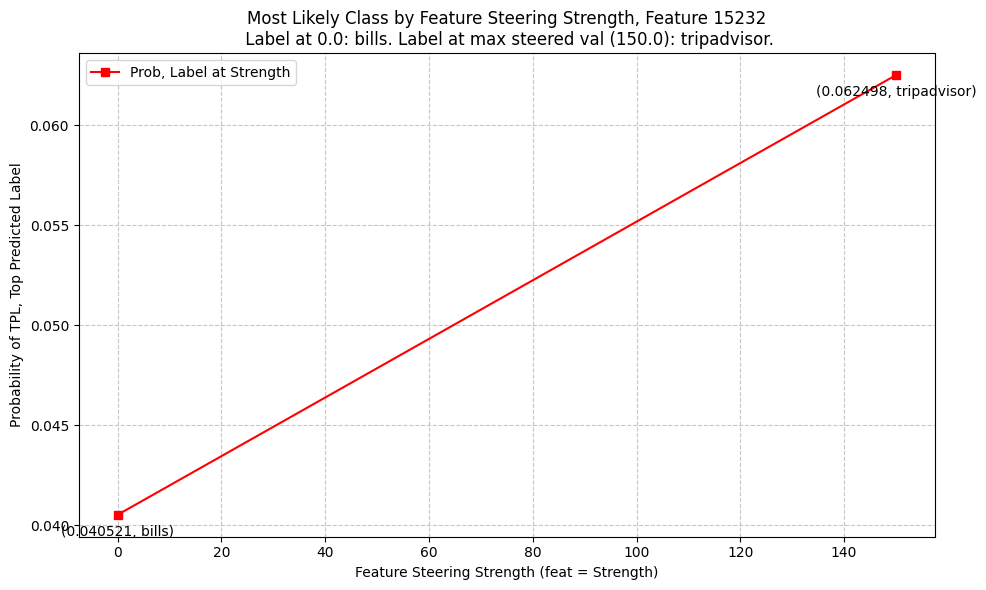

In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

feat_num: 15232


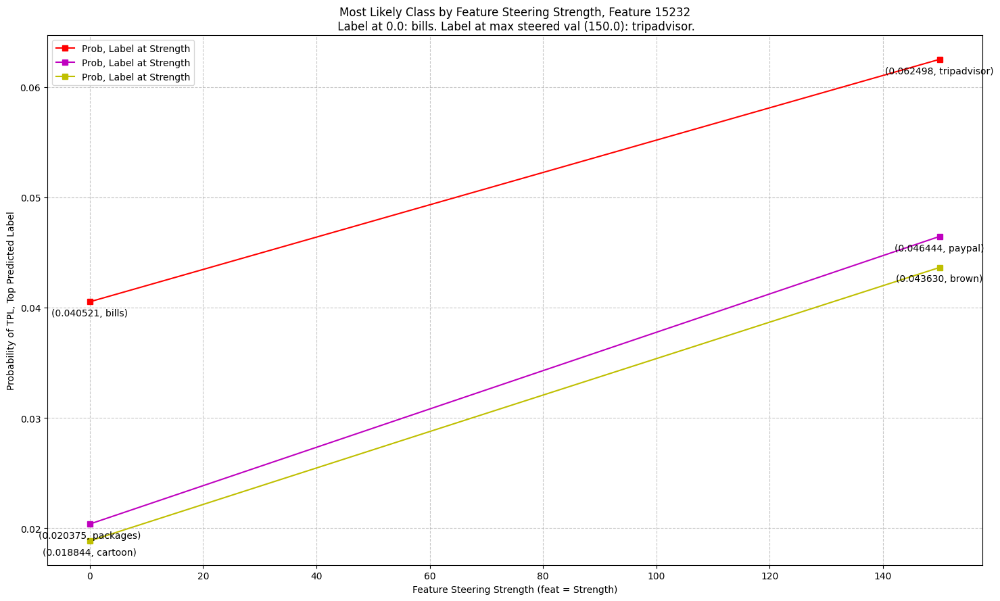

In [40]:
image_idx = image_idx
feat_num = feat_num

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_concept_arr_2 = []
feat_num_concept_arr_3 = []
feat_num_prob_arr = []
feat_num_prob_arr_2 = []
feat_num_prob_arr_3 = []
for dict_key in steering_strengths:
    # steering_strength_image_results is: [steering_strength][feat_num][image_idx][0:concept name,1:concept_probability][i in 0-9 for img i in top-k]
    
    # concept names
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
    feat_num_concept_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][1]))
    feat_num_concept_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][2]))

    # probabilities
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))
    feat_num_prob_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][1].item()))
    feat_num_prob_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][2].item()))


# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
y1_2 = [tup[1] for tup in sorted(feat_num_concept_arr_2)]
y2_2 = [tup[1] for tup in sorted(feat_num_prob_arr_2)]
y1_3 = [tup[1] for tup in sorted(feat_num_concept_arr_3)]
y2_3 = [tup[1] for tup in sorted(feat_num_prob_arr_3)]

# Create the plot
plt.figure(figsize=(15, 9))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_2, 'ms-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_3, 'ys-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_2[i]:01f}, {y1_2[i]})', 
                (x[i], y2_2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_3[i]:01f}, {y1_3[i]})', 
                (x[i], y2_3[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

In [41]:
steering_strength_info.keys()

dict_keys([0.0, 150.0])

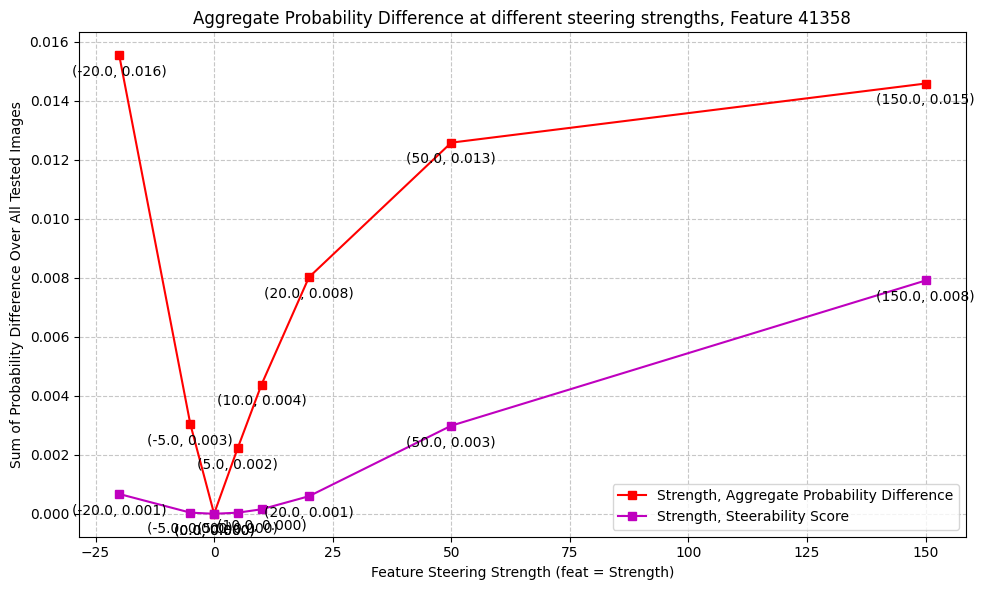

41358
150.0 ['mass' 'towns' 'milfs' 'town' 'debian' 'gmt' 'exact' 'allowing' 'parking'
 'difficult']
150.0 probs tensor([0.0140, 0.0140, 0.0137, 0.0129, 0.0121, 0.0118, 0.0103, 0.0093, 0.0092,
        0.0086], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.1247e-04, 2.0075e-04, 1.9127e-04, 1.4946e-04, 1.3094e-04, 1.2520e-04,
        1.0931e-04, 8.6782e-05, 8.5346e-05, 5.9187e-05])
['towns' 'mass' 'town' 'debian' 'milfs' 'gmt' 'exact' 'allowing' 'parking'
 'exists']


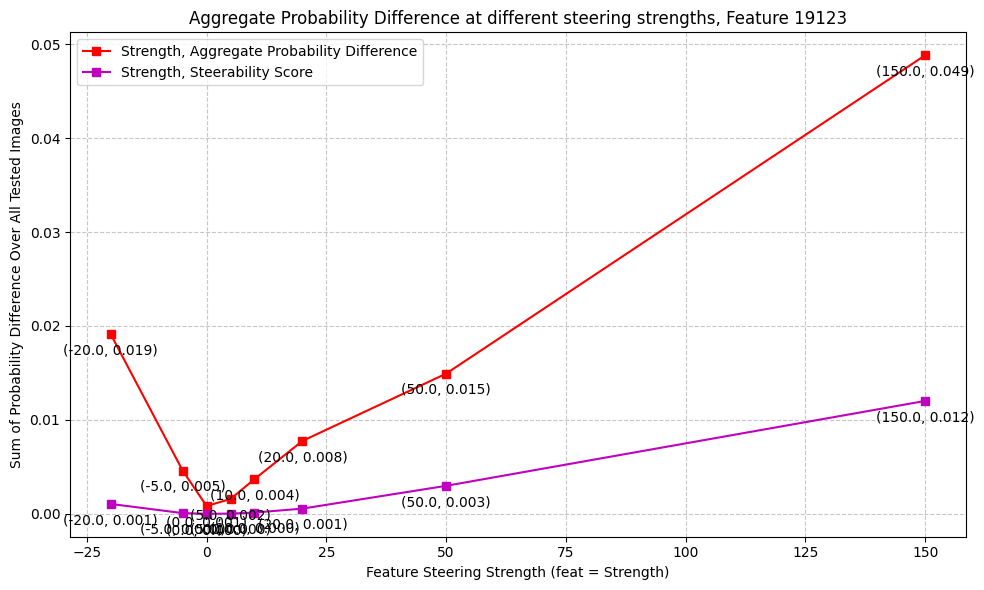

19123
150.0 ['joint' 'php' 'unix' 'dancing' 'get' 'spirit' 'clients' 'census' 'gets'
 'apartments']
150.0 probs tensor([0.0519, 0.0407, 0.0296, 0.0284, 0.0168, 0.0156, 0.0150, 0.0137, 0.0132,
        0.0129], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0024, 0.0018, 0.0009, 0.0006, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['joint' 'php' 'unix' 'dancing' 'clients' 'mysql' 'spirit' 'get' 'sql'
 'fetish']


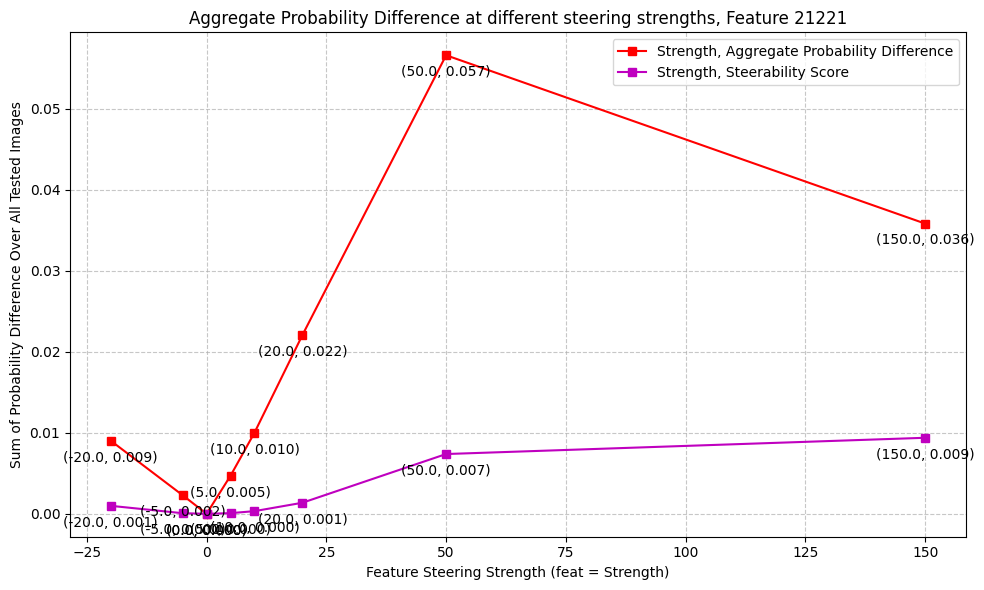

21221
150.0 ['cartoon' 'capacity' 'basket' 'iran' 'friends' 'useful' 'disney' 'census'
 'crystal' 'bills']
150.0 probs tensor([0.0542, 0.0479, 0.0268, 0.0216, 0.0204, 0.0172, 0.0138, 0.0131, 0.0112,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2840e-03, 1.1279e-03, 7.0901e-04, 3.9068e-04, 2.7792e-04, 2.7535e-04,
        1.3449e-04, 1.3306e-04, 7.0691e-05, 6.6701e-05])
['capacity' 'cartoon' 'basket' 'iran' 'friends' 'useful' 'crystal'
 'disney' 'ancient' 'circuit']


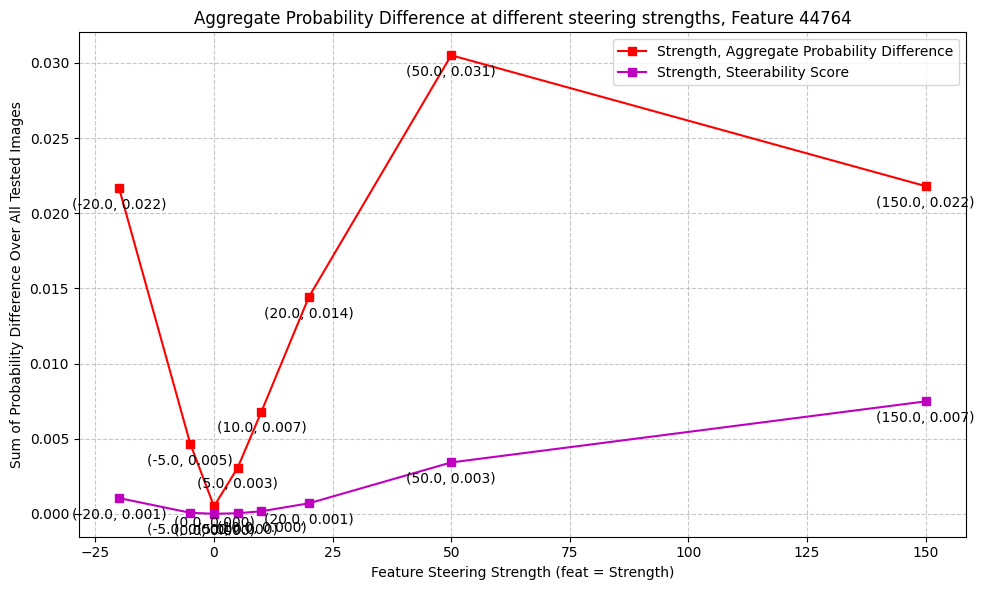

44764
150.0 ['packages' 'risks' 'helpful' 'painting' 'roll' 'output' 'cancel' 'manage'
 'census' 'values']
150.0 probs tensor([0.0241, 0.0227, 0.0171, 0.0154, 0.0149, 0.0142, 0.0140, 0.0120, 0.0117,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.7532e-04, 2.2793e-04, 2.1656e-04, 1.9837e-04, 1.8091e-04, 1.0971e-04,
        1.0565e-04, 1.0074e-04, 1.0012e-04, 8.1458e-05])
['risks' 'helpful' 'roll' 'cancel' 'painting' 'manage' 'viagra' 'values'
 'samples' 'lesbian']


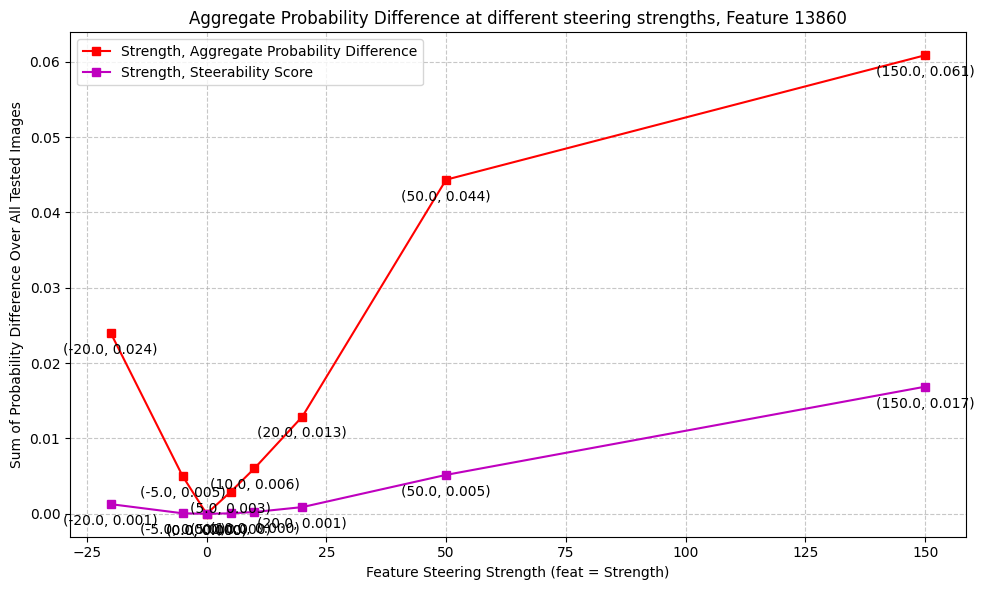

13860
150.0 ['tourist' 'posters' 'dress' 'cartoon' 'suites' 'movies' 'cumshots'
 'receipt' 'cinema' 'tourism']
150.0 probs tensor([0.0722, 0.0528, 0.0434, 0.0268, 0.0225, 0.0225, 0.0205, 0.0197, 0.0164,
        0.0130], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0037, 0.0030, 0.0016, 0.0006, 0.0005, 0.0005, 0.0002, 0.0002, 0.0002,
        0.0002])
['tourist' 'posters' 'dress' 'cumshots' 'suites' 'movies' 'cinema'
 'receipt' 'vacuum' 'glass']


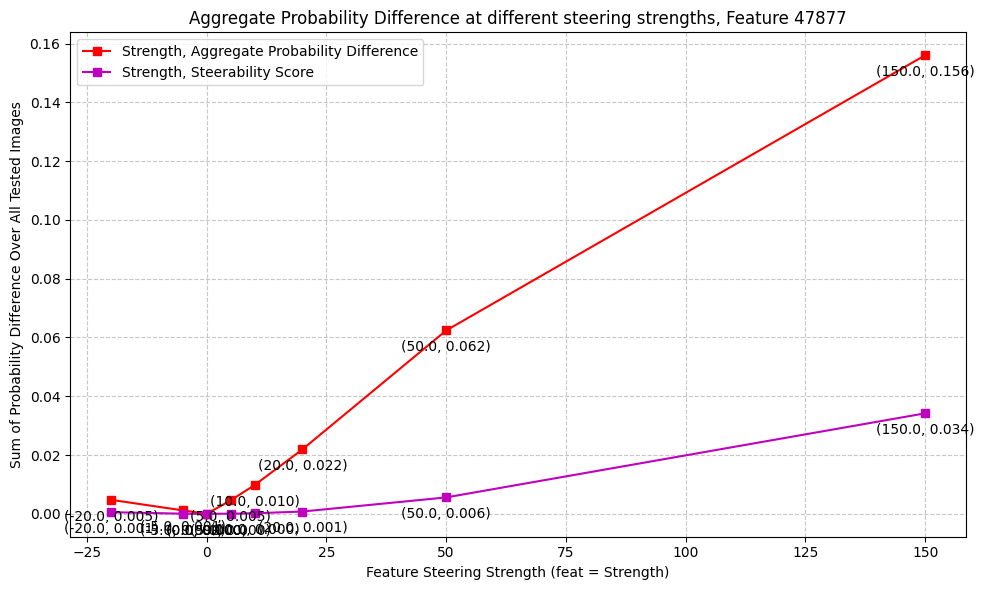

47877
150.0 ['taken' 'capacity' 'milk' 'oil' 'fitness' 'gas' 'cartridge' 'bulk'
 'modem' 'get']
150.0 probs tensor([0.1510, 0.0670, 0.0258, 0.0206, 0.0201, 0.0173, 0.0140, 0.0116, 0.0098,
        0.0089], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.4337e-02, 3.0977e-03, 7.1791e-04, 4.6255e-04, 2.5845e-04, 2.2166e-04,
        2.0329e-04, 1.0885e-04, 9.2748e-05, 7.0315e-05])
['taken' 'capacity' 'milk' 'oil' 'gas' 'cartridge' 'fitness' 'bulk'
 'modem' 'pipeline']


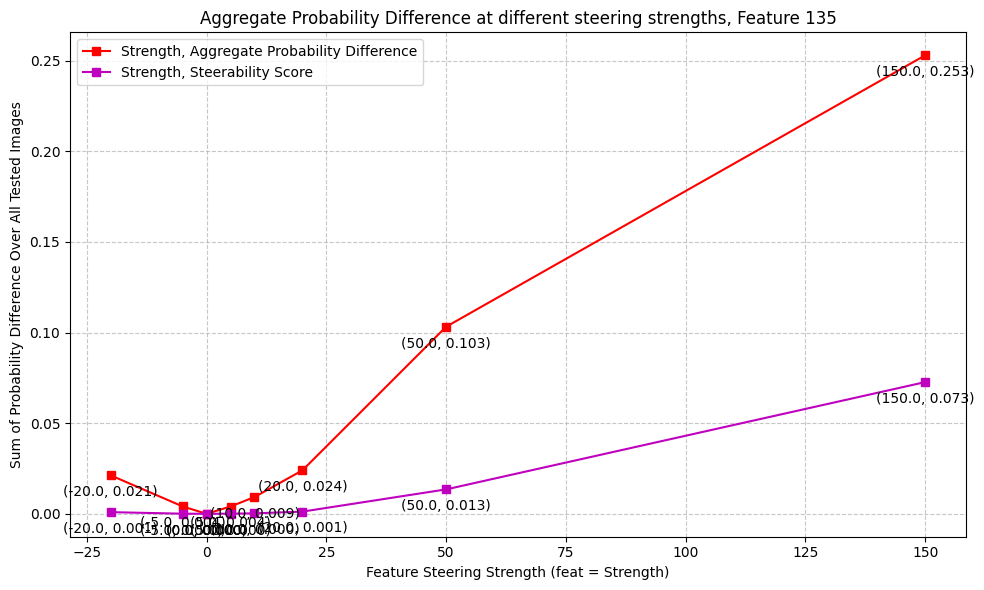

135
150.0 ['ads' 'poster' 'ad' 'print' 'beer' 'fees' 'advertisement' 'posters'
 'indeed' 'cities']
150.0 probs tensor([0.2633, 0.0491, 0.0257, 0.0143, 0.0136, 0.0126, 0.0114, 0.0106, 0.0097,
        0.0080], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.3972e-02, 2.2034e-03, 5.6548e-04, 1.1961e-04, 1.0516e-04, 1.0486e-04,
        1.0452e-04, 8.8579e-05, 8.7983e-05, 7.6954e-05])
['ads' 'poster' 'ad' 'advertisement' 'beer' 'posters' 'fees' 'print'
 'indeed' 'noted']


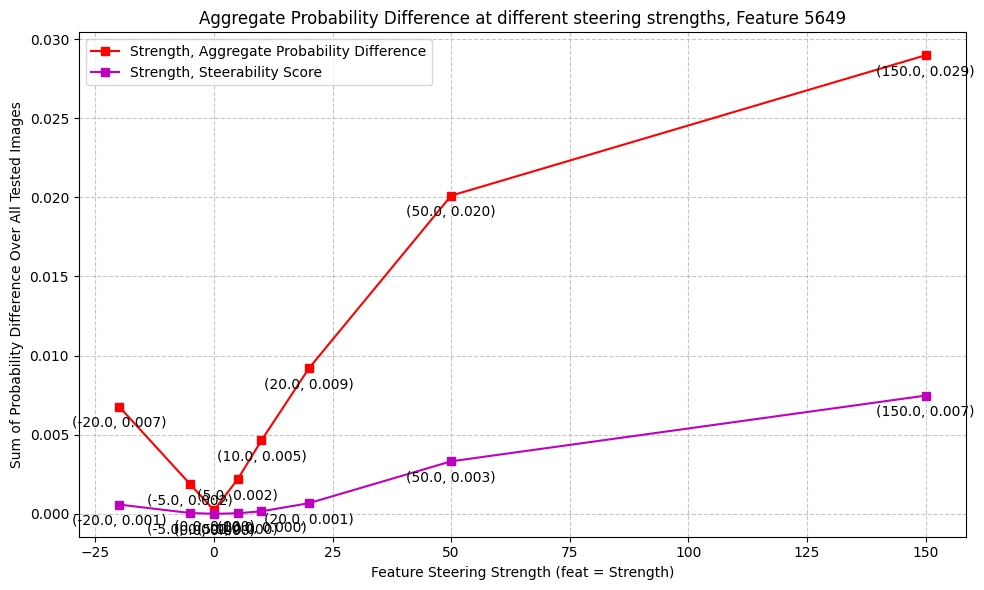

5649
150.0 ['trees' 'shirts' 'dress' 'kits' 'pass' 'houses' 'steps' 'keeps'
 'capacity' 'moves']
150.0 probs tensor([0.0233, 0.0208, 0.0197, 0.0193, 0.0174, 0.0157, 0.0155, 0.0150, 0.0123,
        0.0117], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([8.3955e-04, 3.1940e-04, 2.4598e-04, 2.1333e-04, 1.5271e-04, 1.5033e-04,
        1.1618e-04, 9.5304e-05, 9.5079e-05, 7.5050e-05])
['trees' 'dress' 'steps' 'shirts' 'pass' 'keeps' 'moves' 'mainly' 'exists'
 'boost']


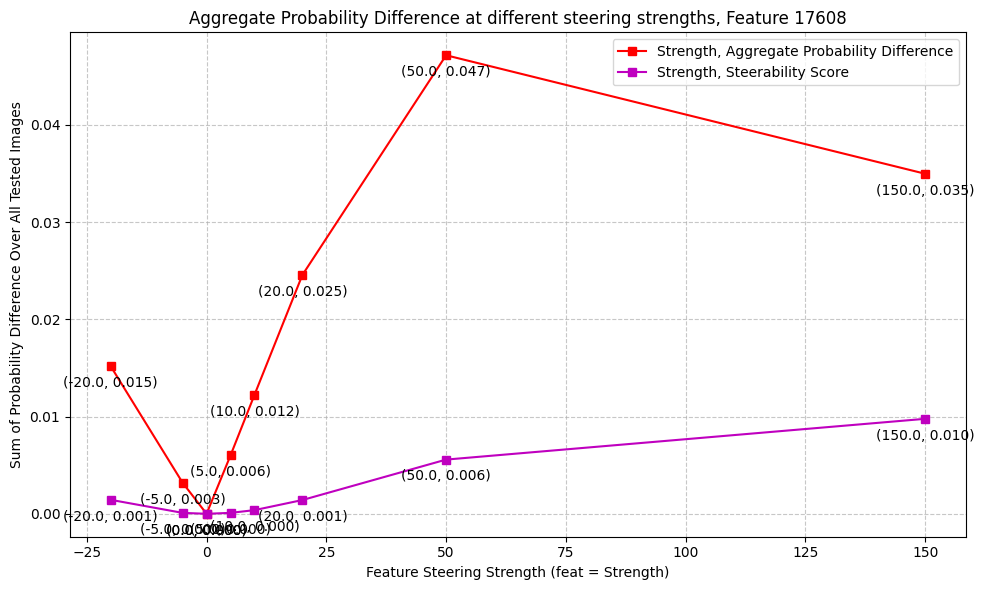

17608
150.0 ['comics' 'bills' 'courts' 'shirts' 'civil' 'ear' 'tripadvisor' 'java'
 'cartoon' 'gear']
150.0 probs tensor([0.0358, 0.0326, 0.0321, 0.0264, 0.0262, 0.0224, 0.0195, 0.0189, 0.0186,
        0.0161], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0012, 0.0011, 0.0006, 0.0005, 0.0004, 0.0004, 0.0004, 0.0003, 0.0002,
        0.0001])
['comics' 'courts' 'civil' 'ear' 'shirts' 'tripadvisor' 'java' 'gear'
 'comic' 'debian']


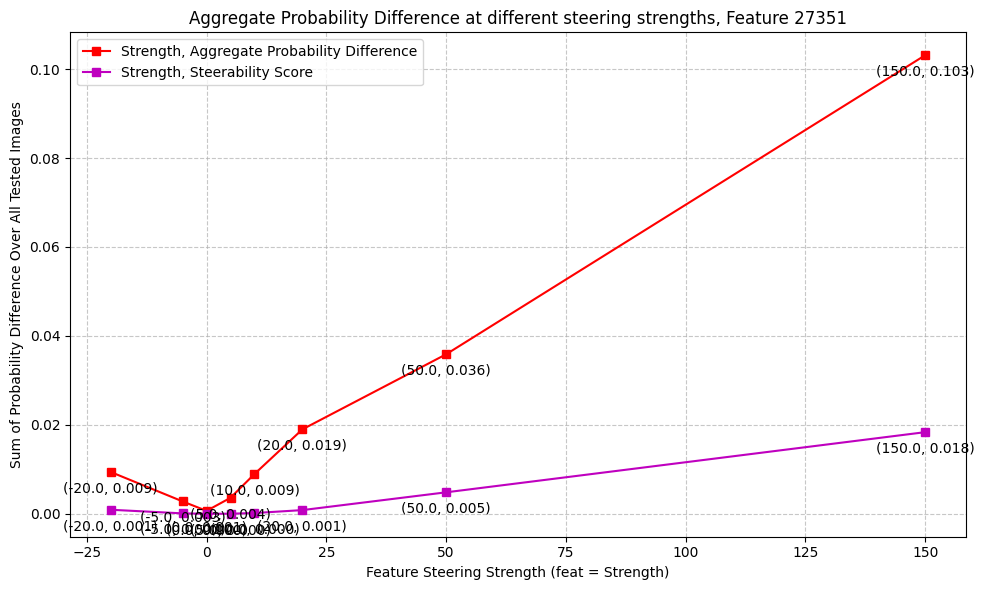

27351
150.0 ['massage' 'shirts' 'bills' 'orleans' 'expenses' 'tobacco' 'thongs'
 'census' 'eyes' 'apartments']
150.0 probs tensor([0.1056, 0.0437, 0.0300, 0.0295, 0.0263, 0.0186, 0.0131, 0.0131, 0.0110,
        0.0101], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0632e-02, 1.4756e-03, 8.6601e-04, 5.4001e-04, 4.3846e-04, 1.8013e-04,
        1.0358e-04, 5.7962e-05, 5.6655e-05, 5.4656e-05])
['massage' 'shirts' 'orleans' 'expenses' 'tobacco' 'thongs' 'eyes'
 'census' 'sexcam' 'shirt']


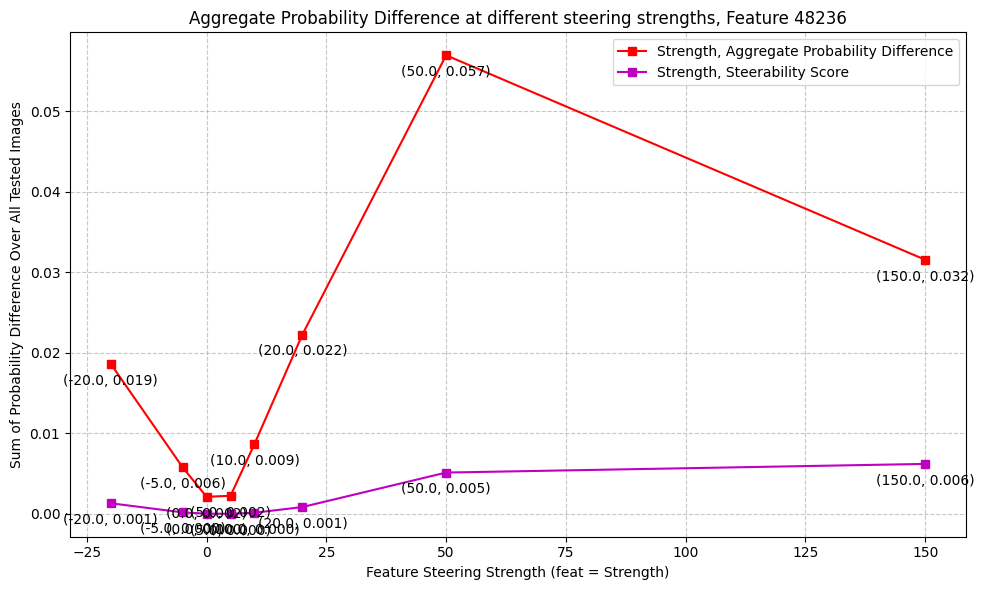

48236
150.0 ['bills' 'tall' 'man' 'monster' 'shirts' 'capacity' 'motion' 'tourist'
 'holdem' 'men']
150.0 probs tensor([0.0719, 0.0249, 0.0249, 0.0209, 0.0154, 0.0150, 0.0147, 0.0121, 0.0119,
        0.0113], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.9475e-04, 4.6704e-04, 3.9377e-04, 2.0434e-04, 1.5260e-04, 1.0713e-04,
        8.4066e-05, 8.1534e-05, 7.5708e-05, 6.8077e-05])
['bills' 'monster' 'tall' 'man' 'holdem' 'motion' 'shoppers' 'shirts'
 'shopper' 'matt']


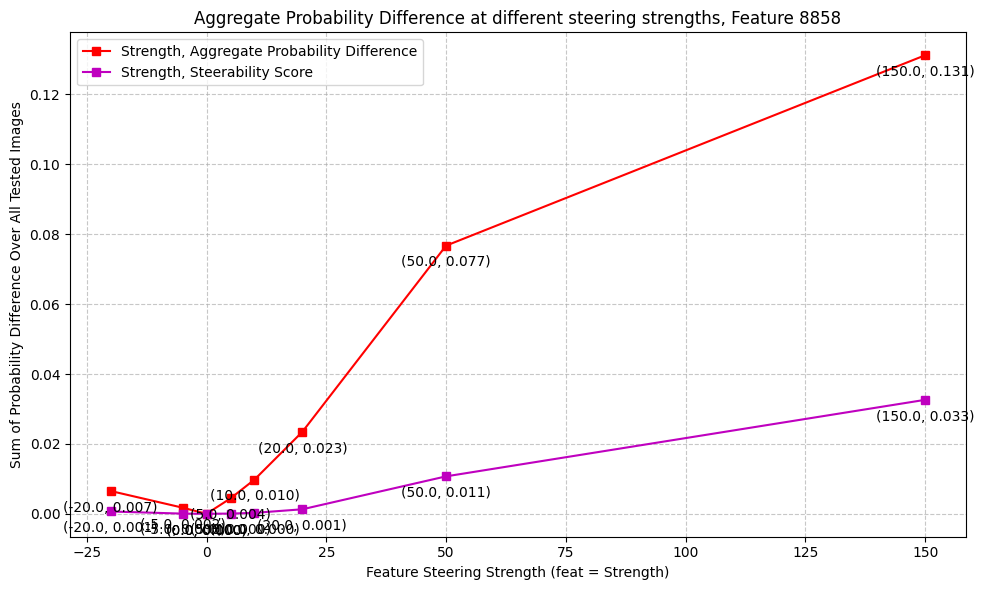

8858
150.0 ['advertising' 'apartments' 'tourist' 'developer' 'advertise' 'spiritual'
 'apartment' 'individual' 'pub' 'consultant']
150.0 probs tensor([0.1348, 0.0786, 0.0459, 0.0335, 0.0267, 0.0225, 0.0213, 0.0149, 0.0140,
        0.0131], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.7219e-02, 5.1981e-03, 1.3998e-03, 1.2075e-03, 7.8326e-04, 5.4522e-04,
        2.9059e-04, 2.0974e-04, 2.0196e-04, 7.3413e-05])
['advertising' 'apartments' 'developer' 'tourist' 'advertise' 'apartment'
 'spiritual' 'individual' 'consultant' 'walking']


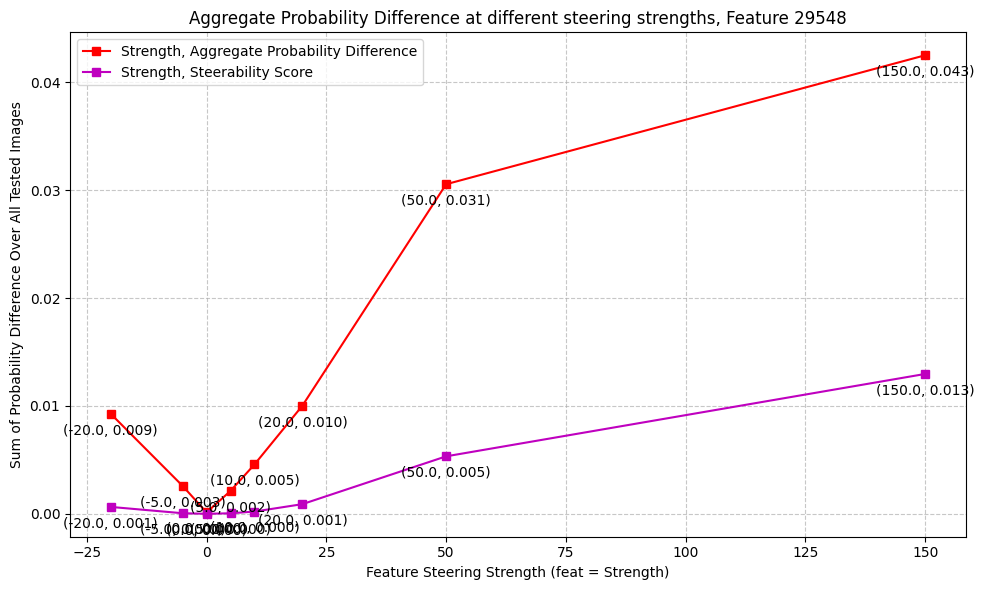

29548
150.0 ['families' 'people' 'teachers' 'tall' 'minimum' 'family' 'men' 'thongs'
 'tourist' 'walk']
150.0 probs tensor([0.0459, 0.0421, 0.0341, 0.0272, 0.0268, 0.0248, 0.0231, 0.0193, 0.0161,
        0.0134], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0018, 0.0016, 0.0013, 0.0005, 0.0005, 0.0004, 0.0004, 0.0002, 0.0001,
        0.0001])
['families' 'people' 'teachers' 'minimum' 'tall' 'thongs' 'men' 'family'
 'walk' 'minority']


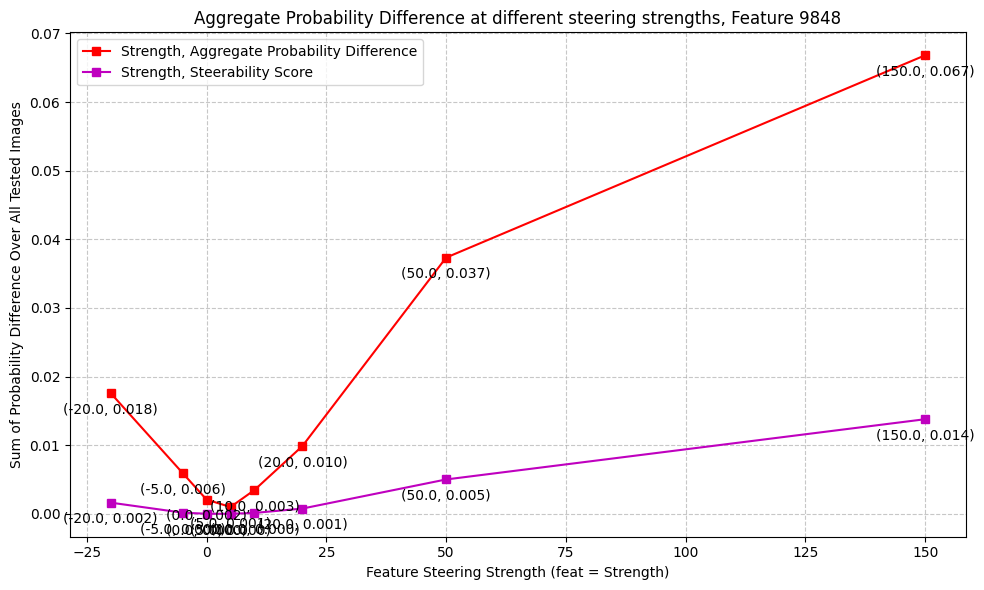

9848
150.0 ['faces' 'family' 'rain' 'guests' 'paul' 'dancing' 'mom' 'girls'
 'portland' 'benefit']
150.0 probs tensor([0.0647, 0.0276, 0.0268, 0.0255, 0.0225, 0.0188, 0.0180, 0.0147, 0.0144,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0045, 0.0007, 0.0005, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0001])
['faces' 'rain' 'guests' 'paul' 'mom' 'family' 'portland' 'dancing'
 'benefit' 'girls']


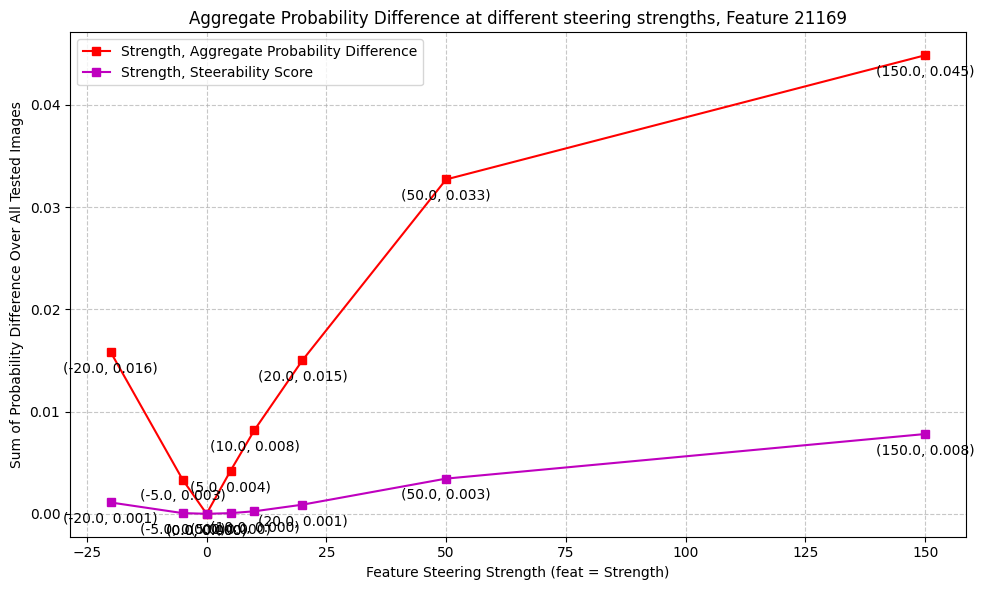

21169
150.0 ['accept' 'cpu' 'tourist' 'bills' 'budget' 'sciences' 'gambling'
 'pollution' 'credits' 'pci']
150.0 probs tensor([0.0428, 0.0336, 0.0246, 0.0201, 0.0145, 0.0112, 0.0097, 0.0094, 0.0093,
        0.0093], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.0123e-03, 3.5320e-04, 2.2536e-04, 1.4427e-04, 1.1577e-04, 1.0996e-04,
        8.9928e-05, 8.0312e-05, 7.8584e-05, 7.1433e-05])
['accept' 'cpu' 'tourist' 'budget' 'sciences' 'pollution' 'pci' 'ref'
 'gambling' 'resolution']


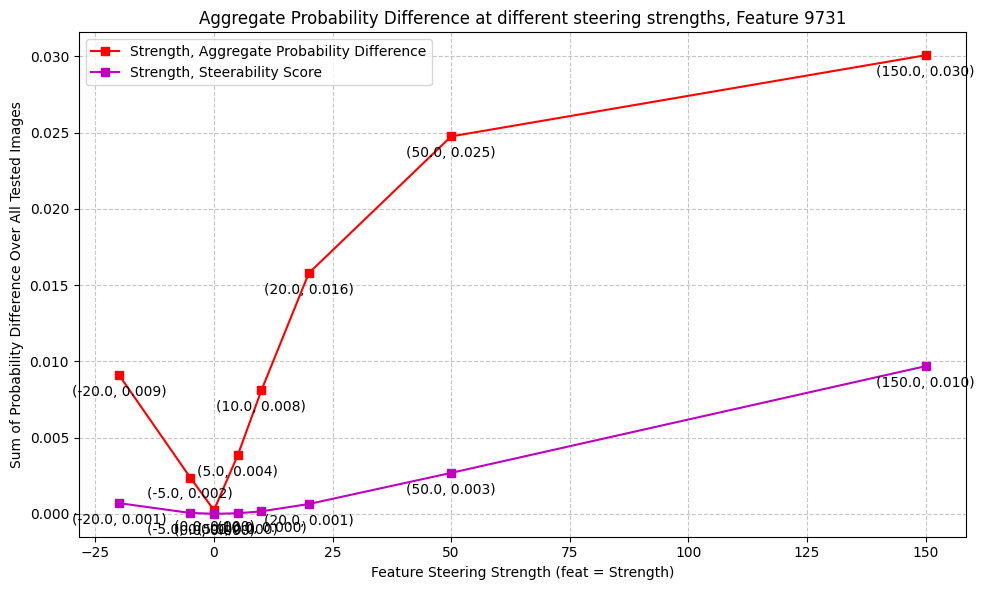

9731
150.0 ['beer' 'berlin' 'dublin' 'saw' 'cocks' 'dvds' 'turkey' 'bills' 'portland'
 'seattle']
150.0 probs tensor([0.0333, 0.0329, 0.0246, 0.0209, 0.0209, 0.0186, 0.0177, 0.0176, 0.0170,
        0.0157], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.0484e-04, 8.2734e-04, 5.1129e-04, 4.3425e-04, 3.9421e-04, 3.8994e-04,
        3.4930e-04, 2.6959e-04, 2.6476e-04, 9.7238e-05])
['beer' 'berlin' 'saw' 'dublin' 'dvds' 'cocks' 'portland' 'turkey'
 'seattle' 'pakistan']


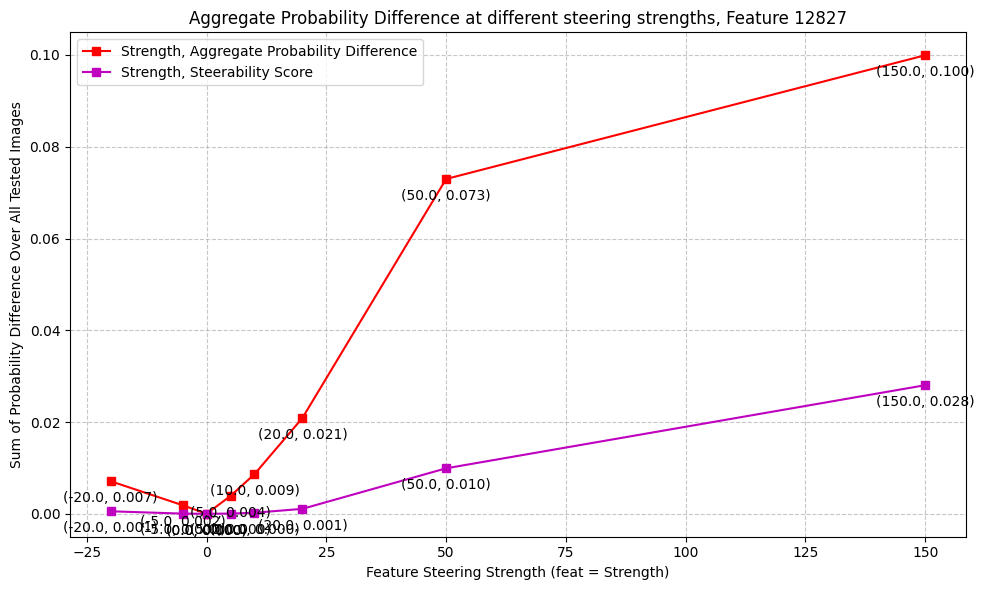

12827
150.0 ['kits' 'maps' 'poker' 'charger' 'kings' 'man' 'ram' 'bags' 'rack'
 'drinking']
150.0 probs tensor([0.1063, 0.0938, 0.0468, 0.0329, 0.0201, 0.0164, 0.0161, 0.0156, 0.0156,
        0.0138], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0100, 0.0080, 0.0022, 0.0012, 0.0003, 0.0003, 0.0002, 0.0001, 0.0001,
        0.0001])
['kits' 'maps' 'poker' 'charger' 'rack' 'kings' 'ram' 'wings' 'gambling'
 'bruce']


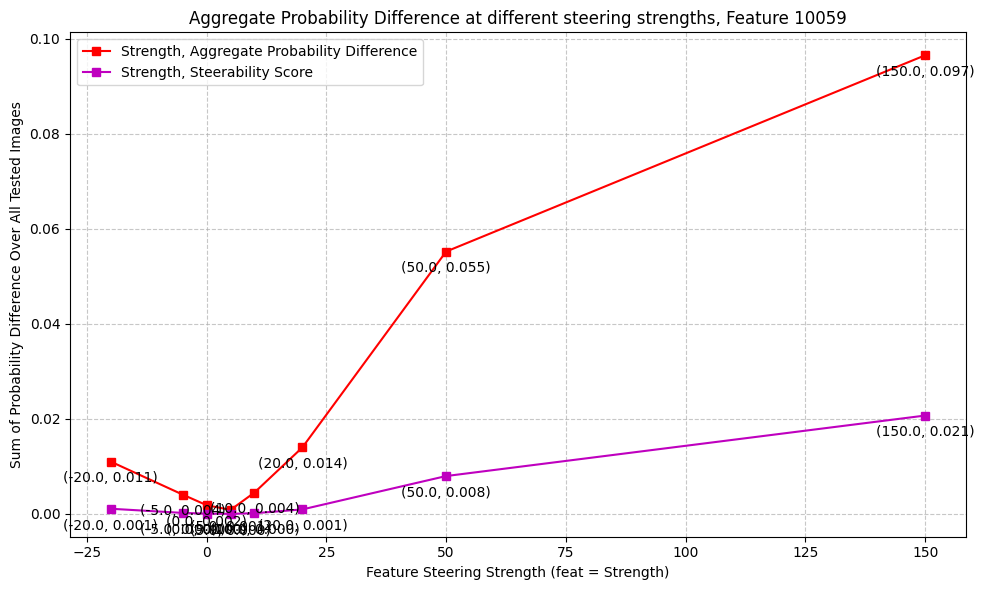

10059
150.0 ['family' 'apartments' 'fitness' 'mountains' 'parents' 'movies' 'phones'
 'families' 'thongs' 'films']
150.0 probs tensor([0.1111, 0.0415, 0.0336, 0.0326, 0.0258, 0.0256, 0.0240, 0.0231, 0.0229,
        0.0164], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0093, 0.0010, 0.0010, 0.0007, 0.0007, 0.0006, 0.0006, 0.0005, 0.0003,
        0.0003])
['family' 'mountains' 'apartments' 'phones' 'fitness' 'parents' 'movies'
 'thongs' 'families' 'films']


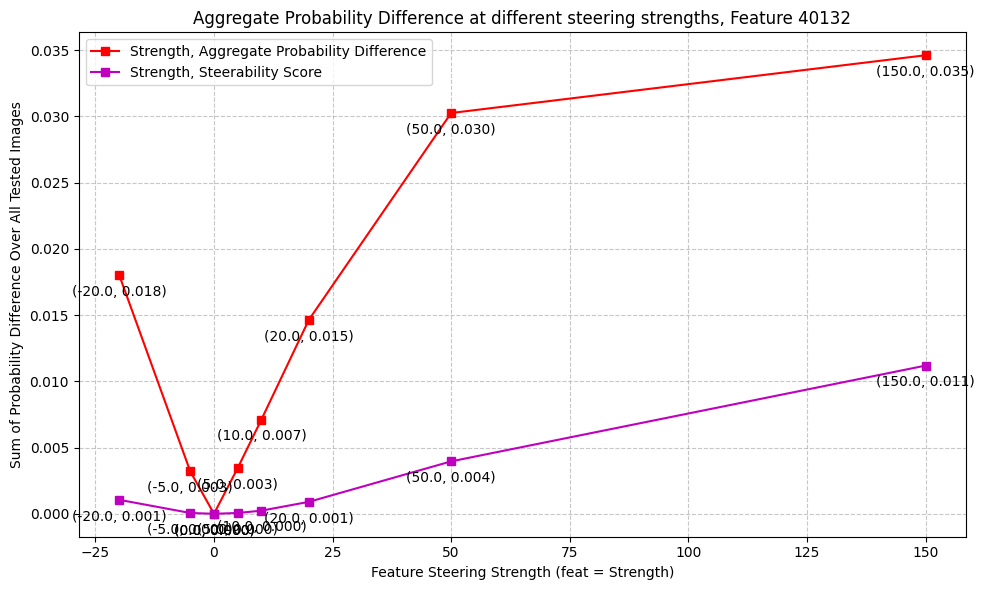

40132
150.0 ['cam' 'gulf' 'contain' 'homes' 'carrying' 'secondary' 'capacity' 'cialis'
 'craig' 'someone']
150.0 probs tensor([0.0362, 0.0332, 0.0299, 0.0259, 0.0190, 0.0168, 0.0162, 0.0146, 0.0145,
        0.0136], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0012, 0.0009, 0.0008, 0.0007, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['cam' 'gulf' 'contain' 'homes' 'carrying' 'cialis' 'secondary' 'craig'
 'fucking' 'someone']


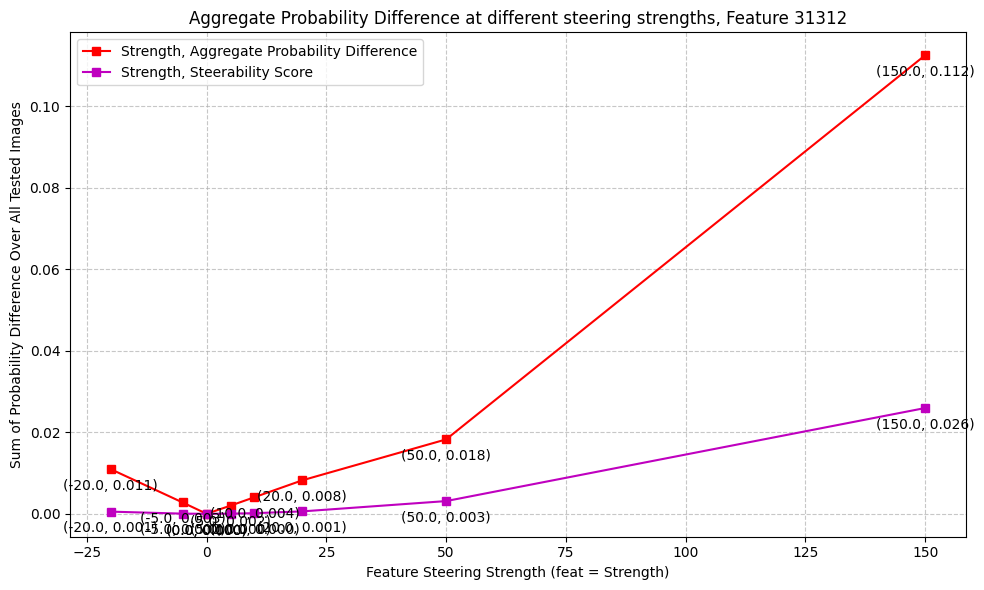

31312
150.0 ['supplements' 'voltage' 'millions' 'pollution' 'ups' 'kits' 'acts'
 'minimum' 'virus' 'hiv']
150.0 probs tensor([0.1014, 0.0828, 0.0164, 0.0162, 0.0125, 0.0117, 0.0114, 0.0111, 0.0098,
        0.0093], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2650e-02, 6.6710e-03, 3.6622e-04, 3.2473e-04, 1.1682e-04, 9.3617e-05,
        7.7235e-05, 7.5349e-05, 6.9554e-05, 6.4838e-05])
['supplements' 'voltage' 'millions' 'pollution' 'ups' 'virus' 'acts' 'hiv'
 'developer' 'medication']


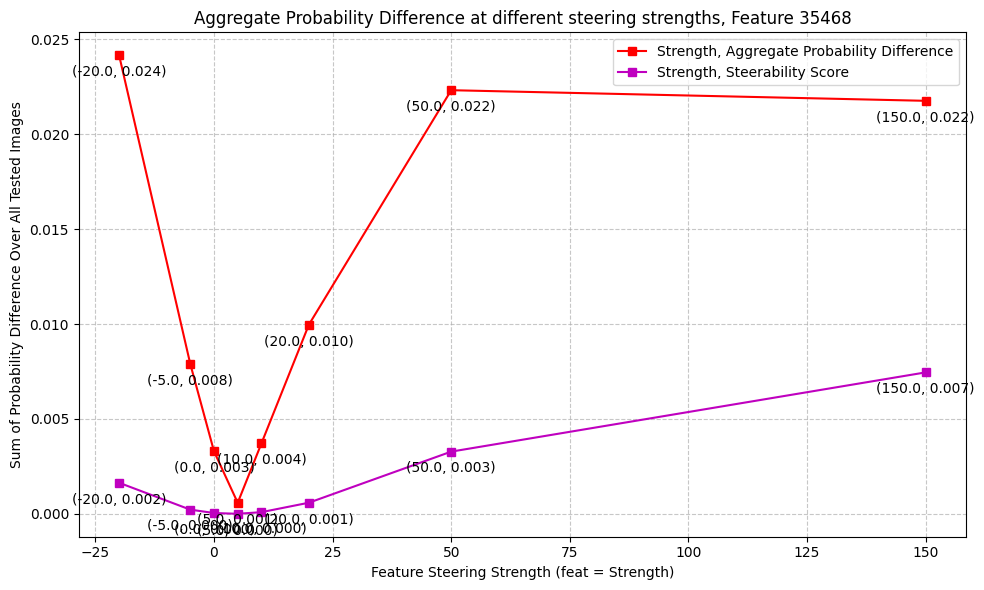

35468
150.0 ['pat' 'coming' 'sporting' 'apartments' 'capacity' 'anything' 'winning'
 'dancing' 'community' 'commit']
150.0 probs tensor([0.0240, 0.0238, 0.0204, 0.0197, 0.0176, 0.0147, 0.0141, 0.0117, 0.0117,
        0.0112], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.7357e-04, 4.5252e-04, 2.9678e-04, 2.1808e-04, 1.6570e-04, 1.2394e-04,
        1.1918e-04, 1.0786e-04, 9.2330e-05, 6.8837e-05])
['coming' 'sporting' 'pat' 'anything' 'winning' 'community' 'commit'
 'although' 'advertising' 'dancing']


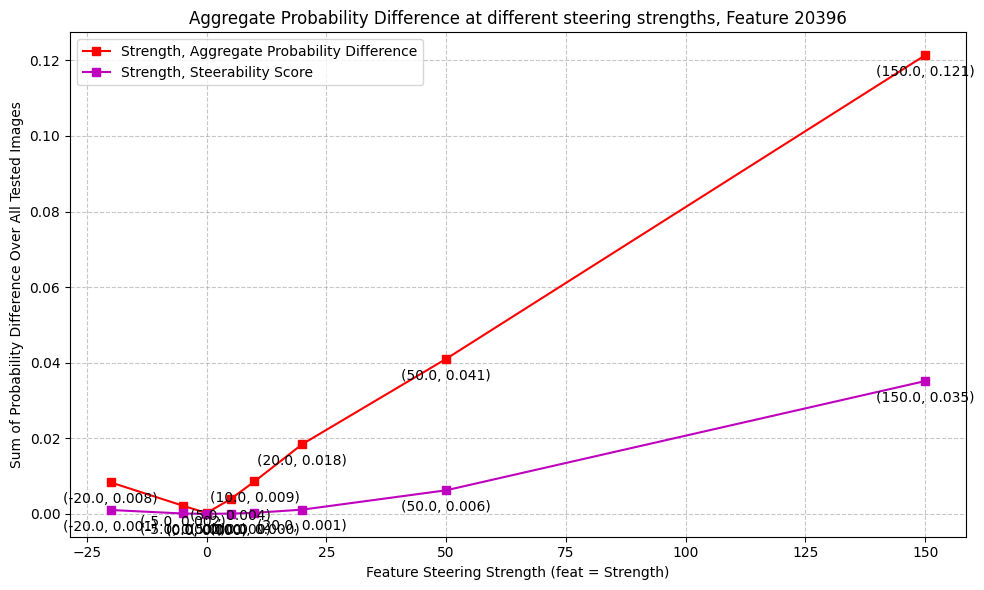

20396
150.0 ['eyes' 'cameras' 'soldiers' 'joint' 'packages' 'apartments' 'military'
 'engines' 'shirts' 'men']
150.0 probs tensor([0.1182, 0.0806, 0.0550, 0.0545, 0.0313, 0.0215, 0.0187, 0.0176, 0.0161,
        0.0159], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.4726e-02, 8.5428e-03, 3.0364e-03, 2.4288e-03, 3.5905e-04, 2.5386e-04,
        2.1877e-04, 2.1165e-04, 1.3109e-04, 9.3287e-05])
['eyes' 'cameras' 'soldiers' 'joint' 'military' 'engines' 'engineers'
 'speakers' 'men' 'packages']


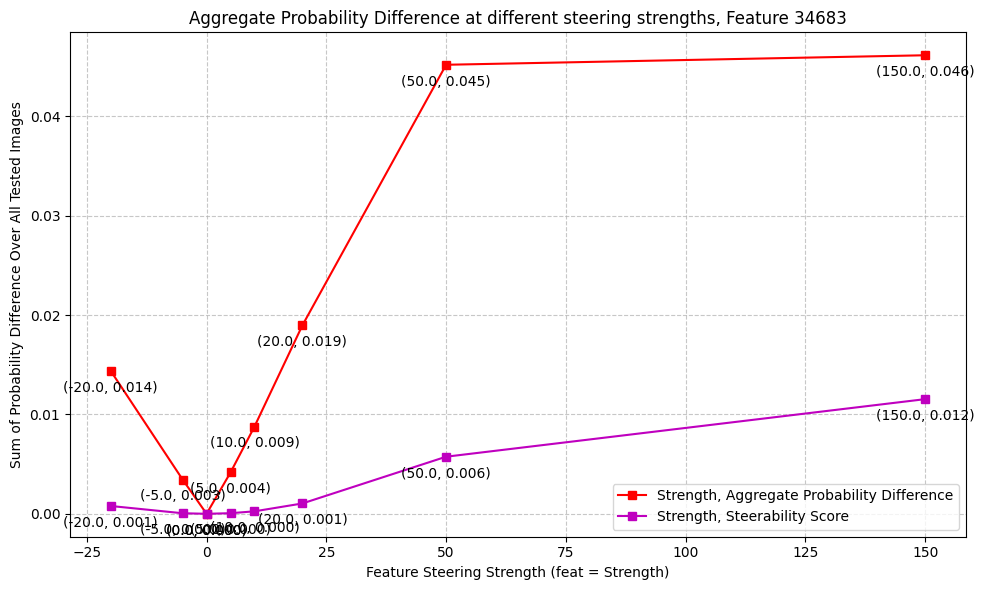

34683
150.0 ['ease' 'pass' 'census' 'capacity' 'tabs' 'epinions' 'penis' 'estimates'
 'pan' 'walls']
150.0 probs tensor([0.0476, 0.0362, 0.0320, 0.0289, 0.0282, 0.0179, 0.0175, 0.0142, 0.0115,
        0.0115], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0009, 0.0007, 0.0007, 0.0003, 0.0003, 0.0002, 0.0002, 0.0001,
        0.0001])
['ease' 'pass' 'tabs' 'census' 'epinions' 'penis' 'capacity' 'estimates'
 'pan' 'obvious']


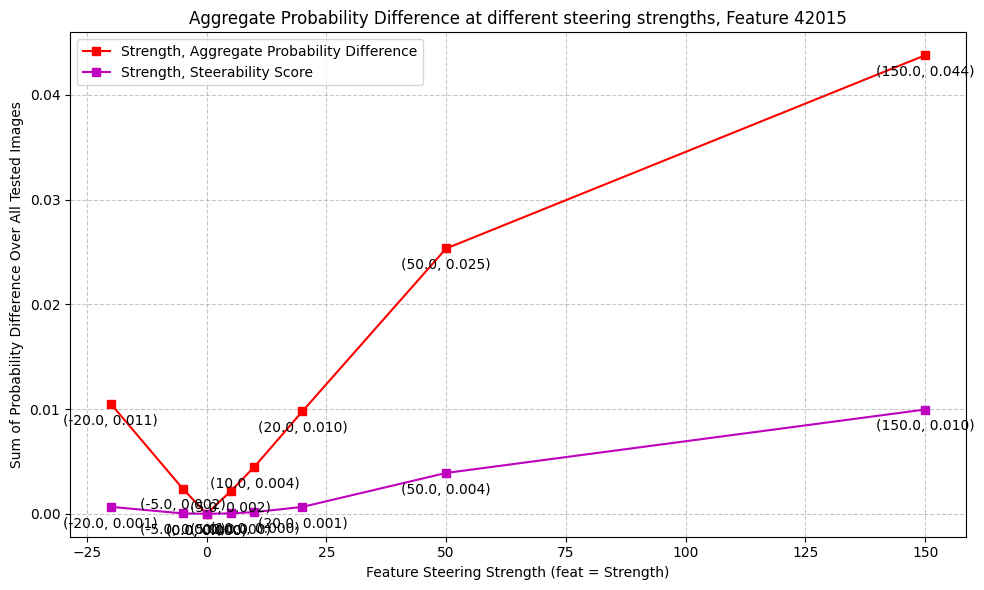

42015
150.0 ['couple' 'drinking' 'scripts' 'minimum' 'man' 'grants' 'couples' 'script'
 'amounts' 'family']
150.0 probs tensor([0.0497, 0.0297, 0.0258, 0.0229, 0.0214, 0.0212, 0.0138, 0.0131, 0.0128,
        0.0126], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0019, 0.0005, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['couple' 'scripts' 'grants' 'minimum' 'drinking' 'couples' 'dynamics'
 'amounts' 'maine' 'script']


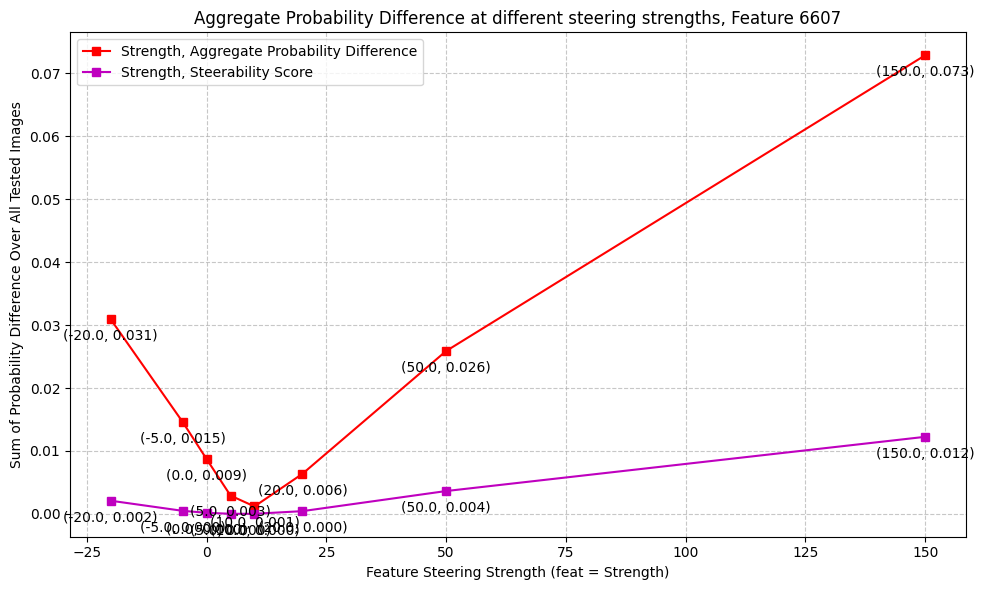

6607
150.0 ['massage' 'parents' 'cartoon' 'cartoons' 'keeps' 'success' 'managers'
 'artists' 'packages' 'friends']
150.0 probs tensor([0.0753, 0.0281, 0.0237, 0.0148, 0.0126, 0.0125, 0.0123, 0.0111, 0.0101,
        0.0091], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.3095e-03, 7.5271e-04, 1.6744e-04, 1.2247e-04, 1.0743e-04, 9.9074e-05,
        7.4654e-05, 6.5003e-05, 5.0739e-05, 4.9883e-05])
['massage' 'parents' 'managers' 'cartoons' 'artists' 'keeps' 'success'
 'records' 'arm' 'dreams']


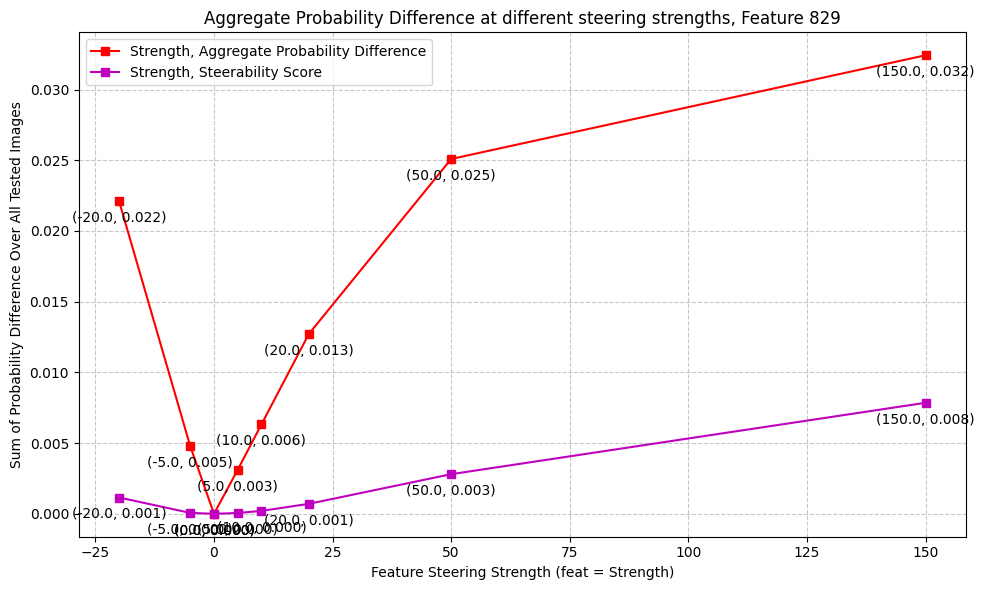

829
150.0 ['capable' 'poster' 'capacity' 'change' 'printable' 'unless' 'offline'
 'immigration' 'charge' 'winning']
150.0 probs tensor([0.0316, 0.0266, 0.0180, 0.0162, 0.0137, 0.0119, 0.0109, 0.0101, 0.0101,
        0.0096], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0515e-03, 6.4030e-04, 1.8773e-04, 1.4951e-04, 1.2532e-04, 9.6038e-05,
        9.3857e-05, 8.7999e-05, 8.5726e-05, 7.6469e-05])
['capable' 'poster' 'change' 'printable' 'offline' 'unless' 'turning'
 'maine' 'immigration' 'thinking']


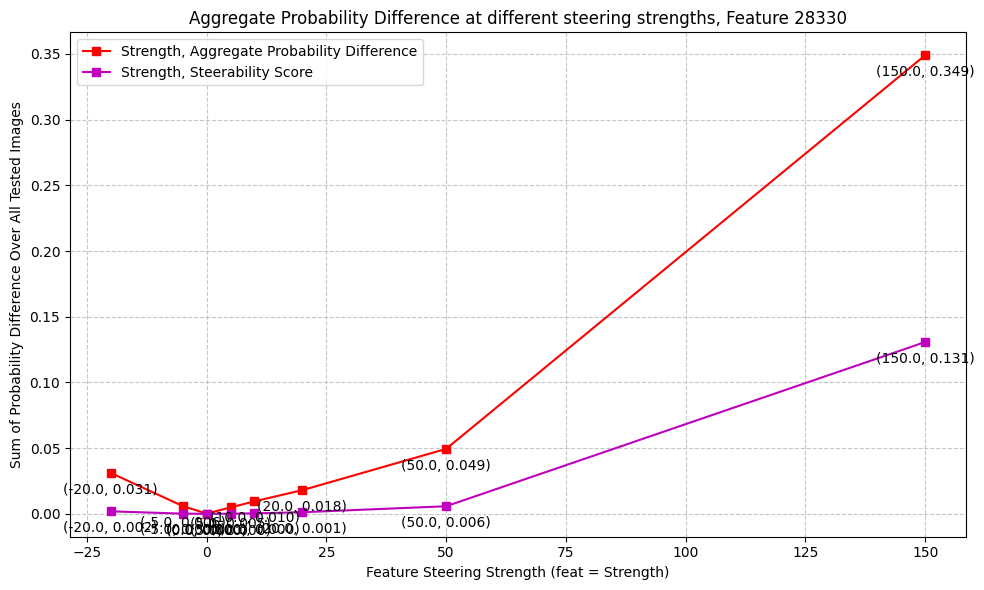

28330
150.0 ['thoughts' 'thought' 'apartments' 'resorts' 'vacations' 'bills' 'rooms'
 'taught' 'drugs' 'moving']
150.0 probs tensor([0.3306, 0.0511, 0.0362, 0.0223, 0.0120, 0.0115, 0.0105, 0.0104, 0.0098,
        0.0091], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2183e-01, 2.7361e-03, 6.1434e-04, 4.3969e-04, 9.5806e-05, 8.8755e-05,
        8.6782e-05, 6.1985e-05, 5.9447e-05, 5.7600e-05])
['thoughts' 'thought' 'apartments' 'resorts' 'rooms' 'vacations' 'taught'
 'requests' 'apartment' 'drugs']


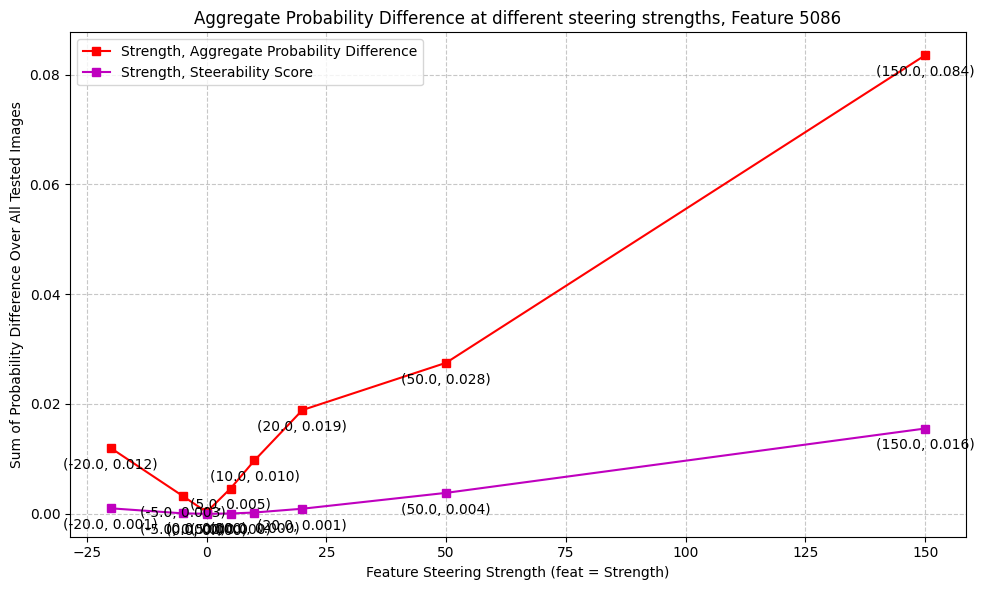

5086
150.0 ['psychology' 'pages' 'pubmed' 'maine' 'bills' 'circumstances' 'yoga'
 'prayer' 'counseling' 'messenger']
150.0 probs tensor([0.0815, 0.0302, 0.0271, 0.0236, 0.0166, 0.0162, 0.0154, 0.0148, 0.0123,
        0.0121], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0070, 0.0007, 0.0006, 0.0006, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['psychology' 'pubmed' 'pages' 'maine' 'circumstances' 'prayer'
 'messenger' 'counseling' 'yoga' 'resume']


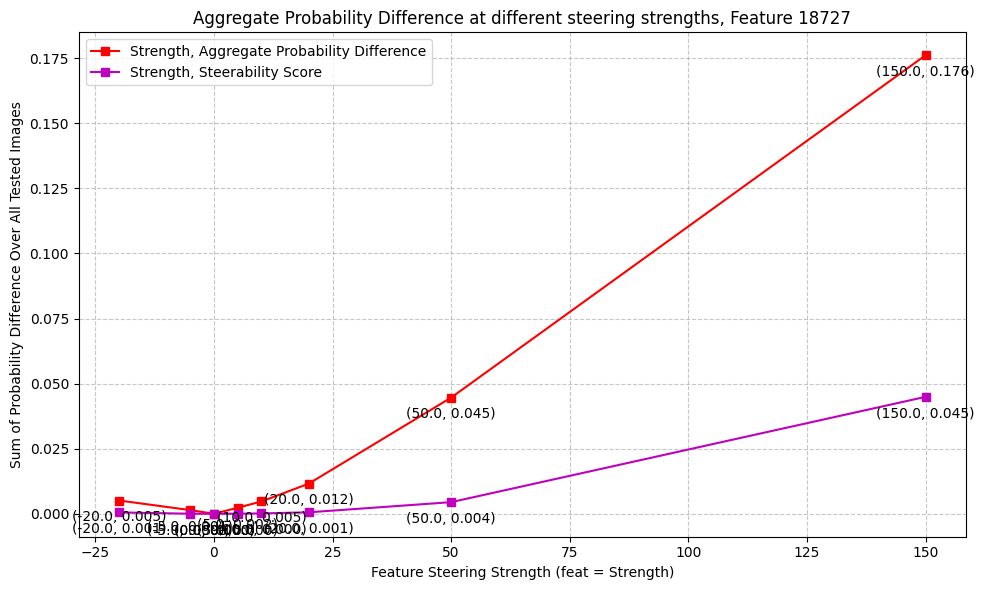

18727
150.0 ['difficult' 'utilities' 'efficient' 'effort' 'kits' 'gets' 'spiritual'
 'streets' 'bills' 'drive']
150.0 probs tensor([0.1780, 0.0868, 0.0219, 0.0198, 0.0170, 0.0148, 0.0134, 0.0101, 0.0070,
        0.0067], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.1025e-02, 8.0398e-03, 4.3763e-04, 3.7226e-04, 1.0261e-04, 6.3768e-05,
        6.0543e-05, 4.3726e-05, 3.3849e-05, 2.8466e-05])
['difficult' 'utilities' 'efficient' 'effort' 'streets' 'spiritual' 'gets'
 'drive' 'sufficient' 'bmw']


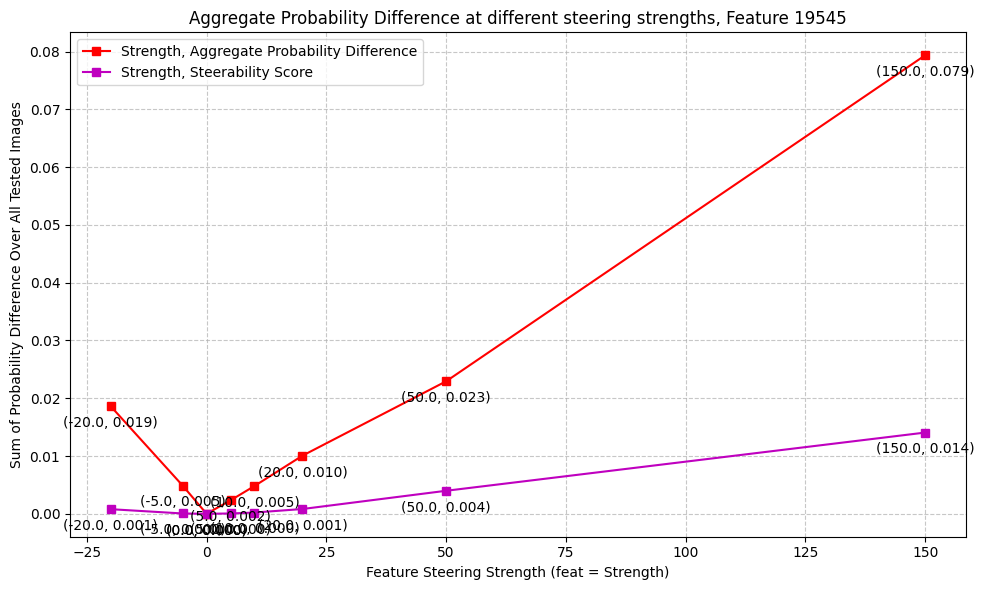

19545
150.0 ['circuit' 'eyes' 'guests' 'kits' 'utilities' 'batteries' 'modules' 'bags'
 'goods' 'strategy']
150.0 probs tensor([0.0810, 0.0278, 0.0247, 0.0236, 0.0205, 0.0187, 0.0187, 0.0166, 0.0089,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.2972e-03, 7.9155e-04, 4.2123e-04, 4.1866e-04, 2.8558e-04, 2.6429e-04,
        1.3062e-04, 9.5412e-05, 8.8731e-05, 7.4307e-05])
['circuit' 'eyes' 'batteries' 'guests' 'modules' 'utilities' 'kits' 'bags'
 'cumshots' 'goods']


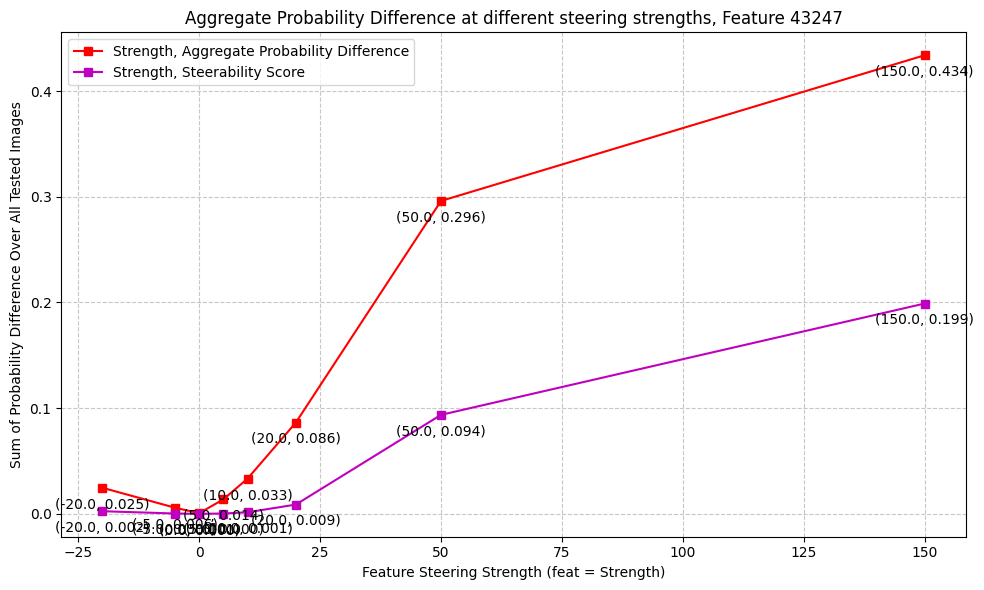

43247
150.0 ['bills' 'cartoon' 'purple' 'comics' 'green' 'comic' 'tampa' 'charge'
 'walls' 'sublime']
150.0 probs tensor([0.4743, 0.0716, 0.0374, 0.0357, 0.0285, 0.0191, 0.0177, 0.0137, 0.0133,
        0.0091], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.8820e-01, 2.6072e-03, 1.3450e-03, 1.0995e-03, 8.8542e-04, 3.4134e-04,
        3.1347e-04, 1.2505e-04, 1.0444e-04, 4.8473e-05])
['bills' 'cartoon' 'comics' 'purple' 'green' 'comic' 'tampa' 'walls'
 'sublime' 'florida']


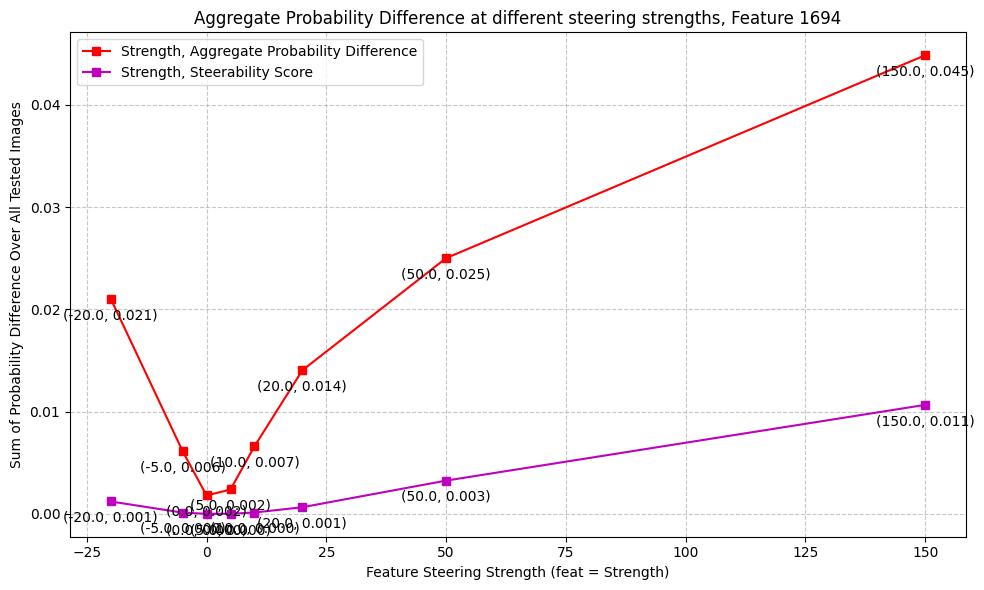

1694
150.0 ['output' 'acts' 'commit' 'moment' 'bills' 'amounts' 'census' 'guess'
 'pat' 'cpu']
150.0 probs tensor([0.0467, 0.0456, 0.0390, 0.0270, 0.0235, 0.0233, 0.0224, 0.0135, 0.0111,
        0.0108], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.0100e-03, 1.6617e-03, 1.4403e-03, 5.5638e-04, 5.1301e-04, 2.7357e-04,
        1.5378e-04, 6.9310e-05, 5.7221e-05, 5.1560e-05])
['acts' 'commit' 'output' 'amounts' 'moment' 'census' 'guess' 'cats' 'pci'
 'bytes']


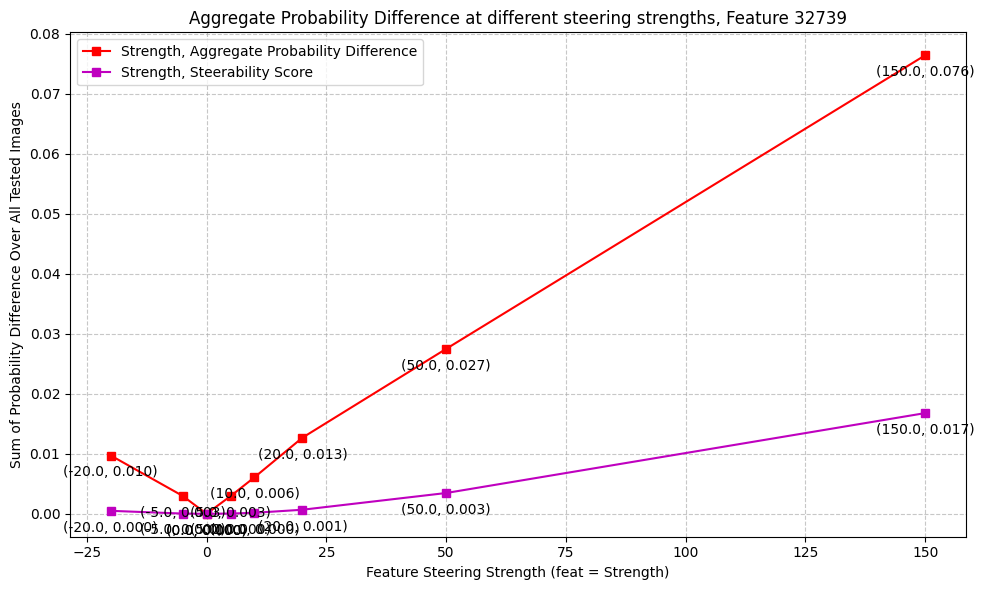

32739
150.0 ['pakistan' 'tripadvisor' 'ok' 'os' 'optimization' 'okay' 'cpu' 'busy'
 'top' 'malaysia']
150.0 probs tensor([0.0790, 0.0502, 0.0241, 0.0216, 0.0204, 0.0172, 0.0163, 0.0139, 0.0120,
        0.0106], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.8352e-03, 2.7433e-03, 5.4314e-04, 5.2363e-04, 4.4101e-04, 2.7605e-04,
        1.8125e-04, 1.2885e-04, 1.0628e-04, 7.7981e-05])
['pakistan' 'tripadvisor' 'os' 'ok' 'optimization' 'okay' 'busy' 'top'
 'malaysia' 'turkey']


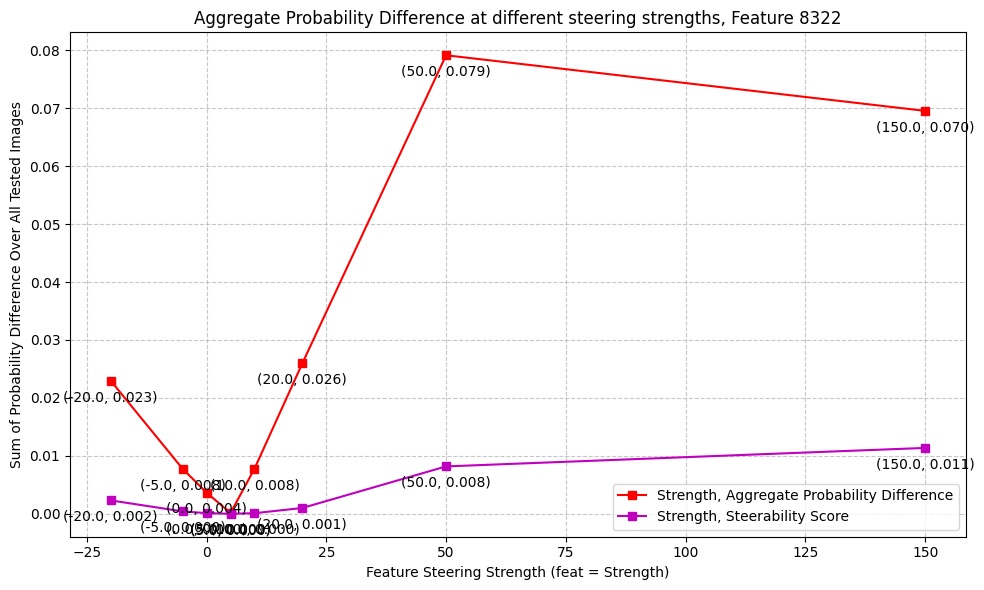

8322
150.0 ['bills' 'tall' 'cities' 'tour' 'gas' 'tabs' 'tourist' 'guys' 'malaysia'
 'cells']
150.0 probs tensor([0.1111, 0.0501, 0.0198, 0.0189, 0.0173, 0.0169, 0.0128, 0.0120, 0.0104,
        0.0102], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.8353e-03, 1.8098e-03, 2.7158e-04, 2.5289e-04, 2.2447e-04, 1.0168e-04,
        6.5801e-05, 5.9068e-05, 5.7934e-05, 5.2059e-05])
['bills' 'tall' 'gas' 'tour' 'tabs' 'malaysia' 'gulf' 'virus' 'exit'
 'yards']


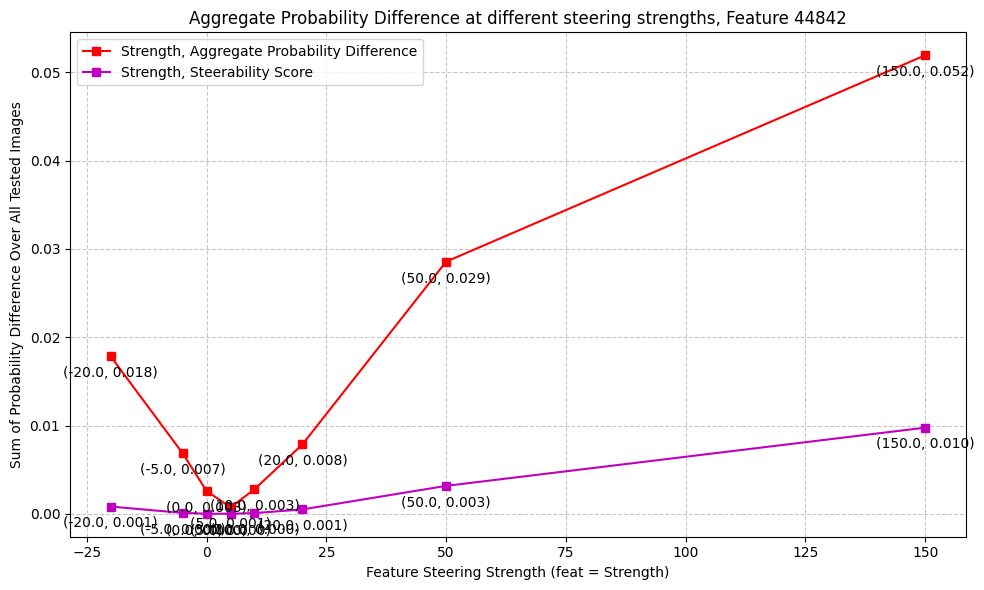

44842
150.0 ['faces' 'cocks' 'senior' 'parents' 'folks' 'units' 'mechanisms'
 'minority' 'milfs' 'cartoon']
150.0 probs tensor([0.0536, 0.0247, 0.0152, 0.0152, 0.0148, 0.0120, 0.0116, 0.0113, 0.0111,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.6963e-03, 5.4358e-04, 2.1698e-04, 1.9908e-04, 1.9519e-04, 1.1279e-04,
        1.1231e-04, 8.9087e-05, 8.3775e-05, 6.6648e-05])
['faces' 'cocks' 'folks' 'senior' 'parents' 'units' 'minority' 'density'
 'famous' 'milfs']


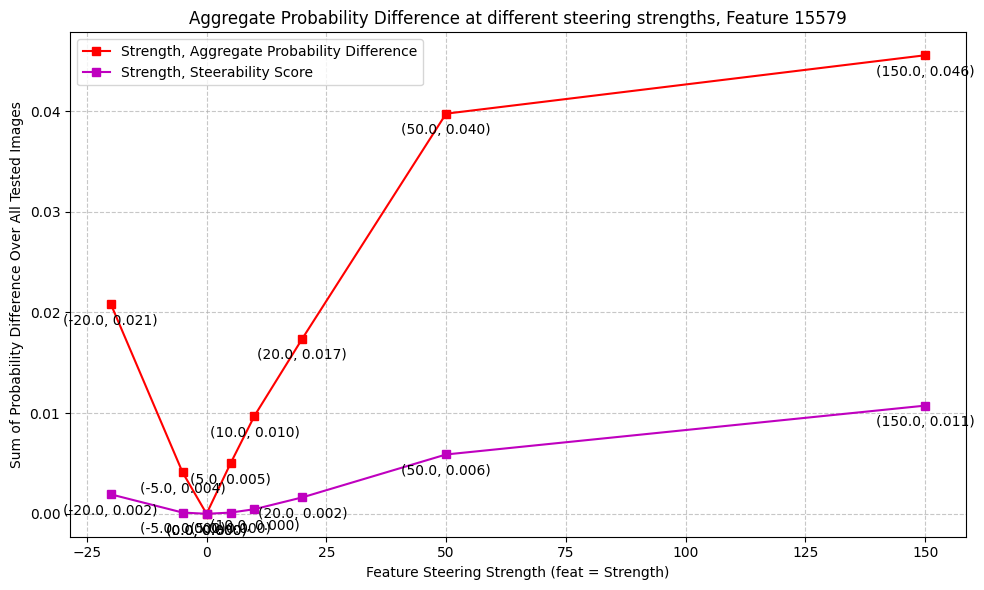

15579
150.0 ['lesbian' 'kits' 'monthly' 'bestiality' 'minority' 'tall' 'capacity'
 'relatively' 'bills' 'multi']
150.0 probs tensor([0.0451, 0.0398, 0.0298, 0.0217, 0.0215, 0.0205, 0.0188, 0.0166, 0.0143,
        0.0142], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0009, 0.0008, 0.0004, 0.0004, 0.0003, 0.0002, 0.0001, 0.0001,
        0.0001])
['lesbian' 'kits' 'monthly' 'minority' 'bestiality' 'relatively' 'tall'
 'carrying' 'multi' 'hungary']


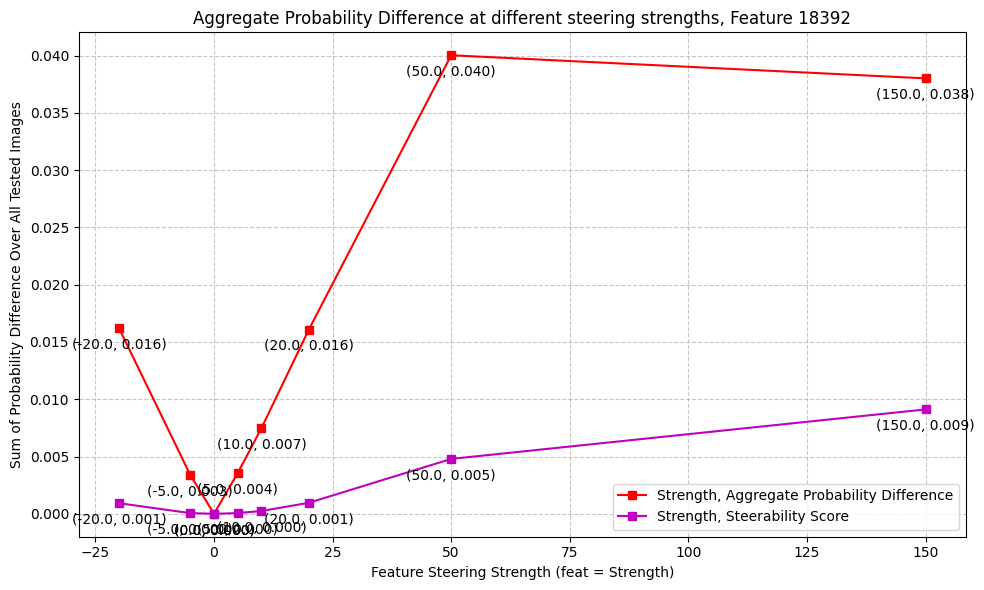

18392
150.0 ['cpu' 'tabs' 'faces' 'cartoon' 'receipt' 'professor' 'trips' 'print'
 'census' 'principal']
150.0 probs tensor([0.0447, 0.0401, 0.0267, 0.0265, 0.0259, 0.0189, 0.0133, 0.0118, 0.0117,
        0.0110], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.4453e-03, 9.5002e-04, 5.1656e-04, 4.4425e-04, 4.3283e-04, 1.1942e-04,
        1.1901e-04, 9.6314e-05, 8.6264e-05, 7.7948e-05])
['tabs' 'cpu' 'faces' 'professor' 'receipt' 'trips' 'principal'
 'processor' 'plans' 'optimization']


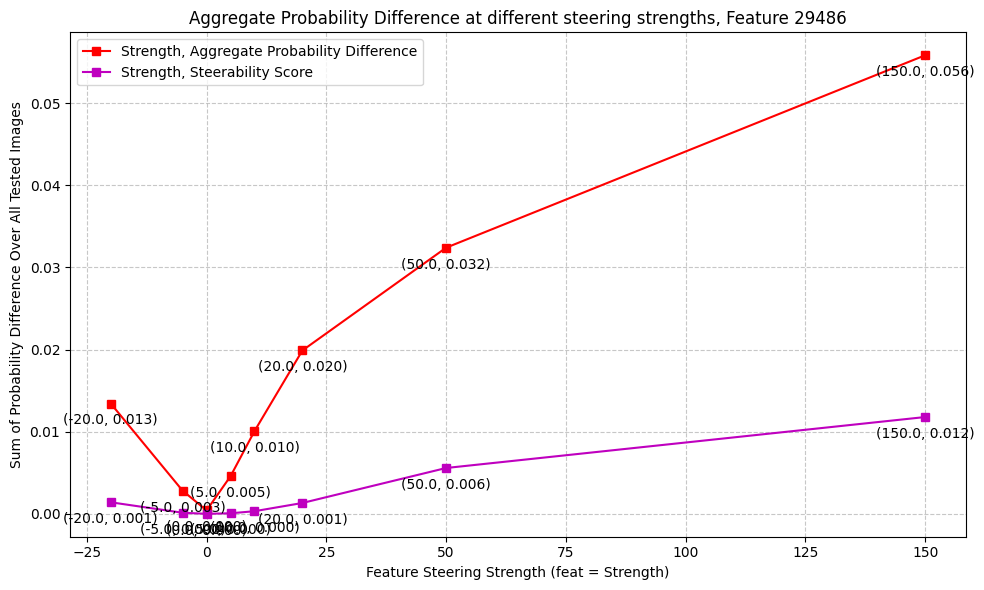

29486
150.0 ['dancing' 'drink' 'drinking' 'bulk' 'angels' 'bills' 'andrew' 'capacity'
 'jonathan' 'diff']
150.0 probs tensor([0.0624, 0.0446, 0.0387, 0.0235, 0.0217, 0.0203, 0.0198, 0.0158, 0.0144,
        0.0139], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.1184e-03, 1.4500e-03, 7.3116e-04, 5.2050e-04, 4.9724e-04, 3.8912e-04,
        2.0935e-04, 2.0823e-04, 1.9951e-04, 8.8810e-05])
['dancing' 'drink' 'drinking' 'bulk' 'angels' 'andrew' 'jonathan'
 'audience' 'diff' 'dan']


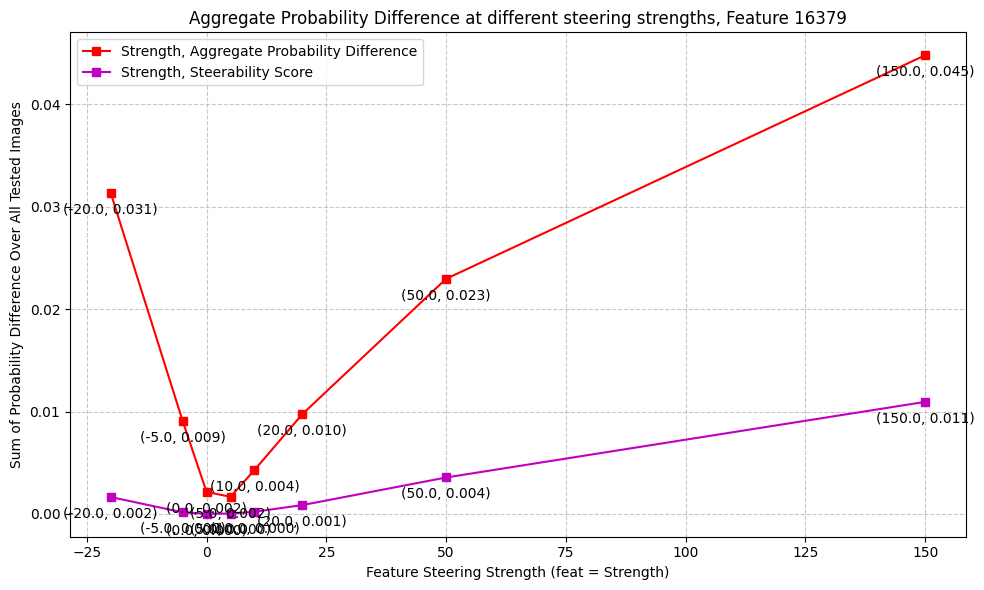

16379
150.0 ['tampa' 'gain' 'tabs' 'cartoon' 'epson' 'pan' 'ads' 'notices' 'walls'
 'clubs']
150.0 probs tensor([0.0456, 0.0422, 0.0297, 0.0256, 0.0179, 0.0173, 0.0156, 0.0139, 0.0135,
        0.0129], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0020, 0.0016, 0.0008, 0.0003, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['tampa' 'gain' 'tabs' 'epson' 'pan' 'notices' 'glance' 'clubs' 'var'
 'walls']


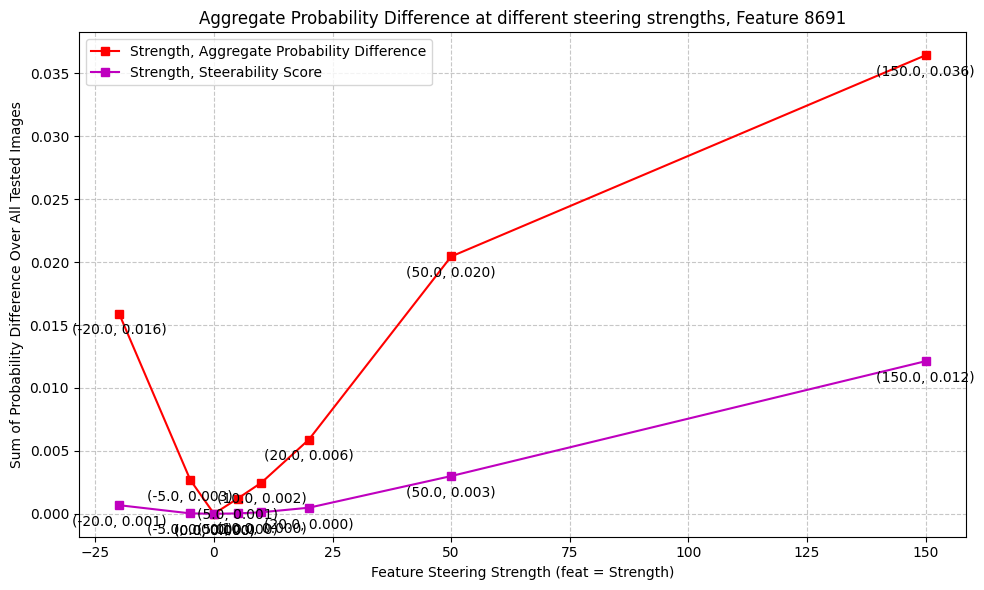

8691
150.0 ['moment' 'contains' 'getting' 'epinions' 'pass' 'citizens' 'passion'
 'taken' 'malaysia' 'motion']
150.0 probs tensor([0.0394, 0.0394, 0.0337, 0.0283, 0.0252, 0.0231, 0.0199, 0.0195, 0.0139,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0013, 0.0013, 0.0009, 0.0008, 0.0004, 0.0004, 0.0004, 0.0004, 0.0002,
        0.0001])
['contains' 'moment' 'getting' 'epinions' 'citizens' 'pass' 'taken'
 'passion' 'malaysia' 'parents']


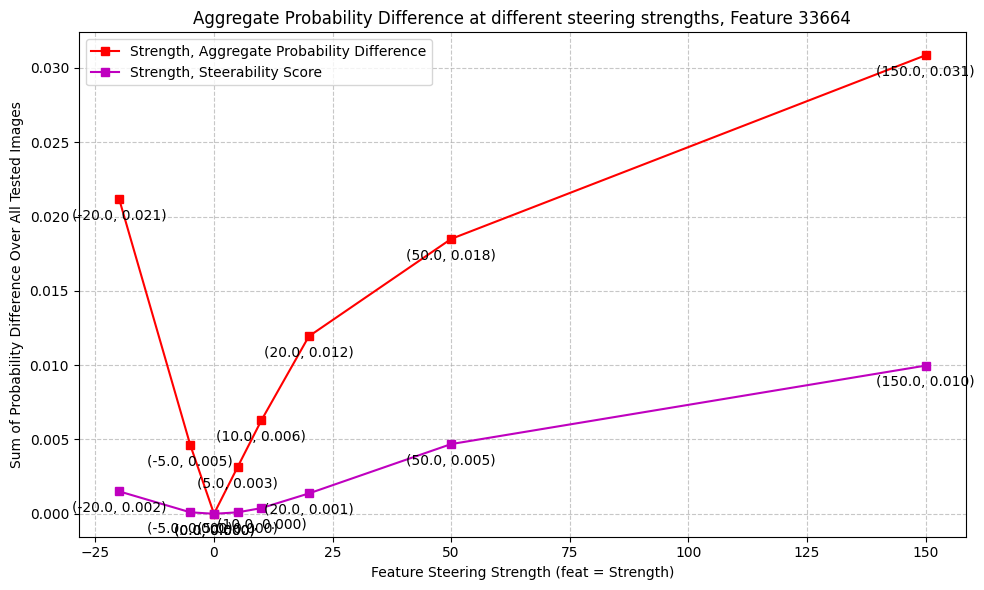

33664
150.0 ['aol' 'python' 'colors' 'gnu' 'cells' 'paypal' 'xp' 'mysql' 'tabs' 'kits']
150.0 probs tensor([0.0302, 0.0260, 0.0225, 0.0209, 0.0191, 0.0175, 0.0166, 0.0164, 0.0144,
        0.0130], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0010, 0.0008, 0.0005, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001])
['aol' 'python' 'gnu' 'mysql' 'colors' 'xp' 'cells' 'paypal' 'million'
 'tabs']


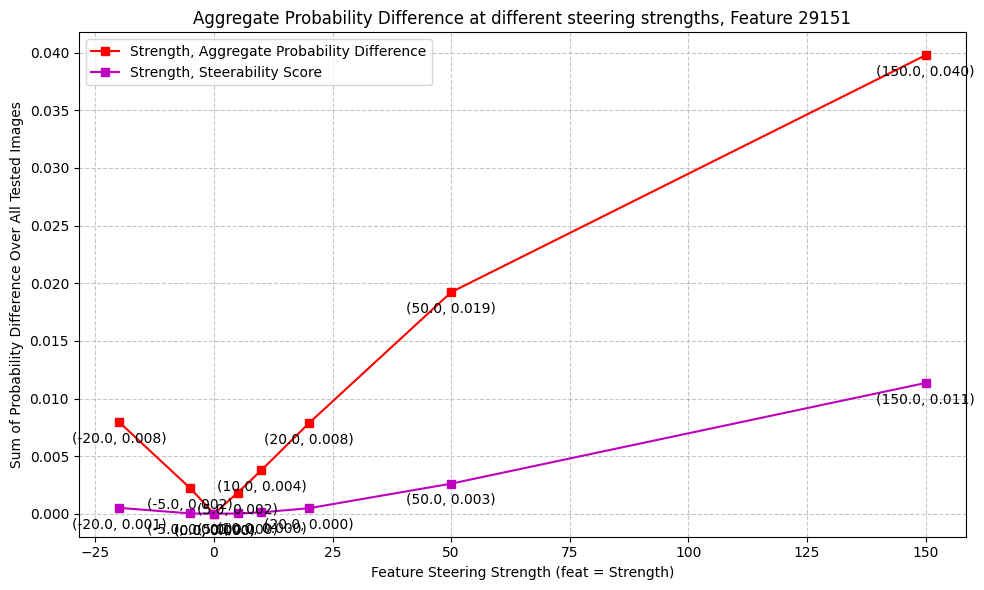

29151
150.0 ['vintage' 'largest' 'antique' 'carrying' 'comedy' 'shirts' 'wallpaper'
 'family' 'parliament' 'choices']
150.0 probs tensor([0.0389, 0.0375, 0.0250, 0.0249, 0.0208, 0.0204, 0.0186, 0.0160, 0.0135,
        0.0127], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0016, 0.0014, 0.0006, 0.0006, 0.0004, 0.0003, 0.0002, 0.0002, 0.0001,
        0.0001])
['vintage' 'largest' 'antique' 'carrying' 'comedy' 'wallpaper'
 'parliament' 'shirts' 'voltage' 'oldest']


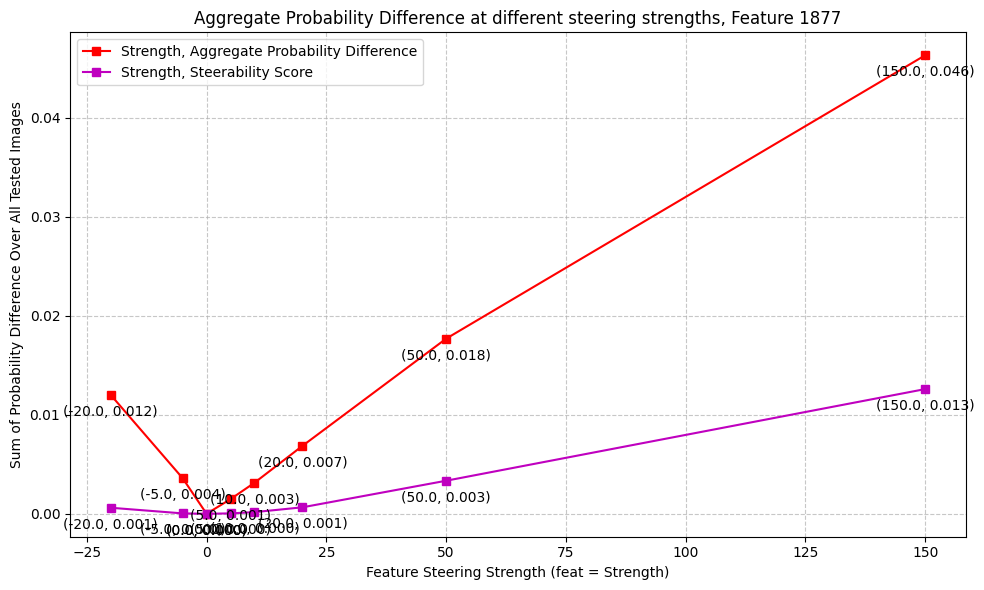

1877
150.0 ['upskirt' 'pakistan' 'cam' 'pour' 'php' 'cyprus' 'paris' 'unix'
 'utilities' 'extras']
150.0 probs tensor([0.0467, 0.0314, 0.0281, 0.0240, 0.0240, 0.0219, 0.0217, 0.0183, 0.0167,
        0.0165], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0009, 0.0007, 0.0006, 0.0005, 0.0005, 0.0003, 0.0003, 0.0003,
        0.0002])
['upskirt' 'pakistan' 'cam' 'php' 'pour' 'cyprus' 'paris' 'unix' 'extras'
 'perl']


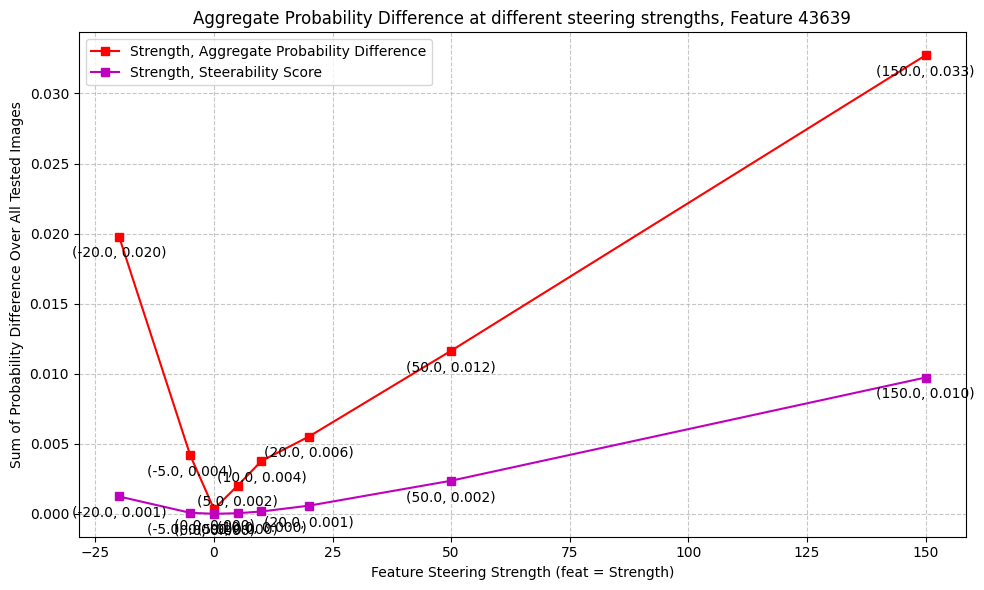

43639
150.0 ['ministry' 'sublime' 'confirm' 'cells' 'inventory' 'guests' 'rules'
 'kevin' 'keeps' 'quiet']
150.0 probs tensor([0.0319, 0.0267, 0.0249, 0.0213, 0.0209, 0.0192, 0.0140, 0.0109, 0.0104,
        0.0095], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0712e-03, 1.0071e-03, 5.3806e-04, 5.1053e-04, 3.2204e-04, 2.5275e-04,
        1.3243e-04, 1.0193e-04, 9.8486e-05, 7.3471e-05])
['ministry' 'sublime' 'confirm' 'inventory' 'cells' 'guests' 'rules'
 'million' 'kevin' 'limits']


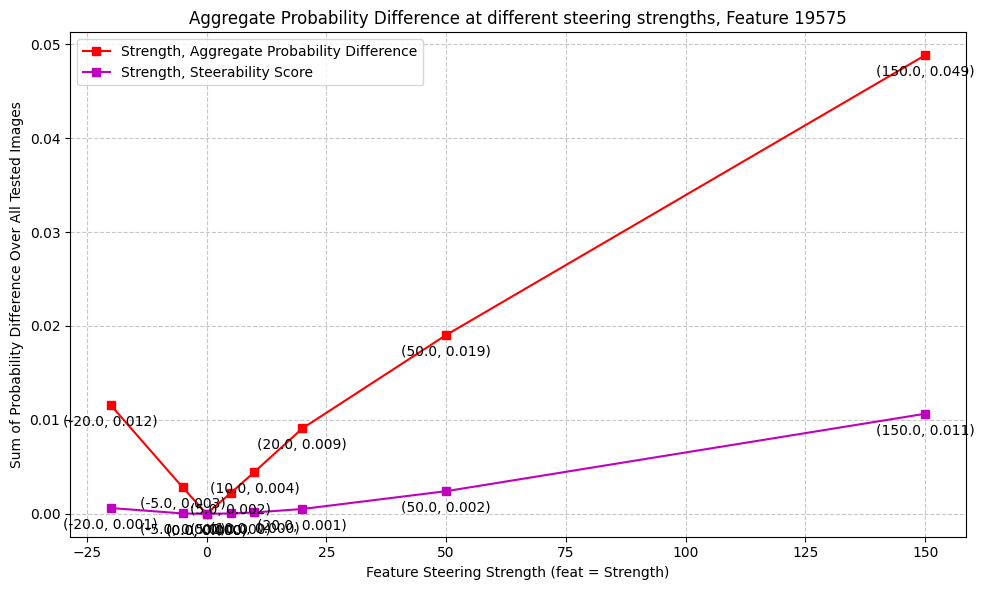

19575
150.0 ['unix' 'chips' 'posters' 'ministry' 'parking' 'orleans' 'apartments'
 'taken' 'pass' 'papers']
150.0 probs tensor([0.0478, 0.0273, 0.0207, 0.0193, 0.0172, 0.0159, 0.0149, 0.0128, 0.0121,
        0.0117], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.3840e-03, 6.9573e-04, 4.2303e-04, 3.6912e-04, 2.9935e-04, 2.4210e-04,
        1.5207e-04, 1.4447e-04, 1.4069e-04, 9.5318e-05])
['unix' 'chips' 'posters' 'ministry' 'parking' 'orleans' 'taken' 'lines'
 'papers' 'links']


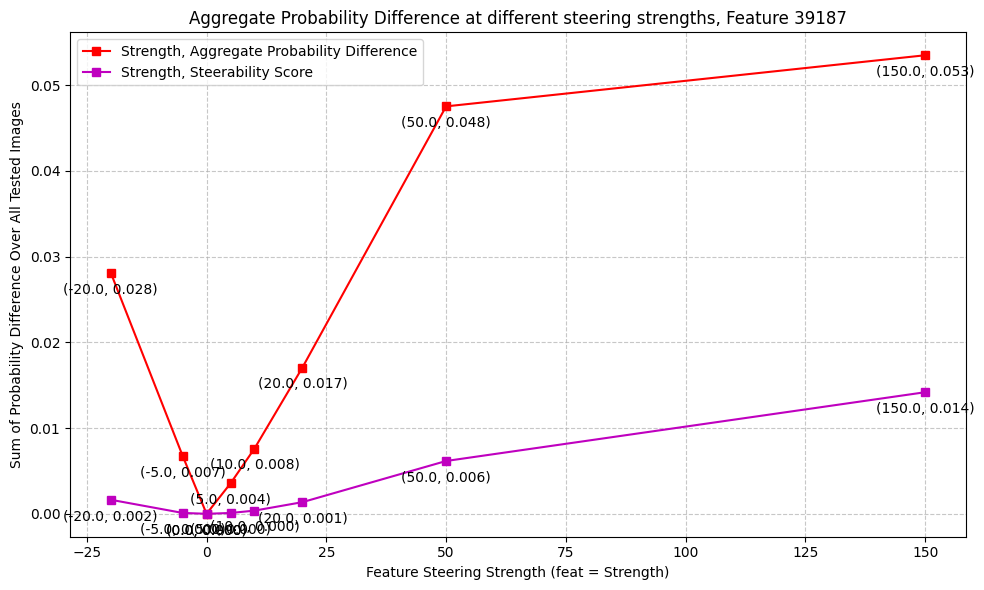

39187
150.0 ['specifications' 'apartments' 'packet' 'posters' 'shirts' 'users' 'lists'
 'kits' 'pricing' 'specification']
150.0 probs tensor([0.0535, 0.0479, 0.0472, 0.0337, 0.0249, 0.0243, 0.0188, 0.0144, 0.0127,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0029, 0.0018, 0.0013, 0.0011, 0.0007, 0.0003, 0.0003, 0.0001, 0.0001,
        0.0001])
['specifications' 'packet' 'apartments' 'posters' 'users' 'shirts' 'lists'
 'pricing' 'specification' 'vertical']


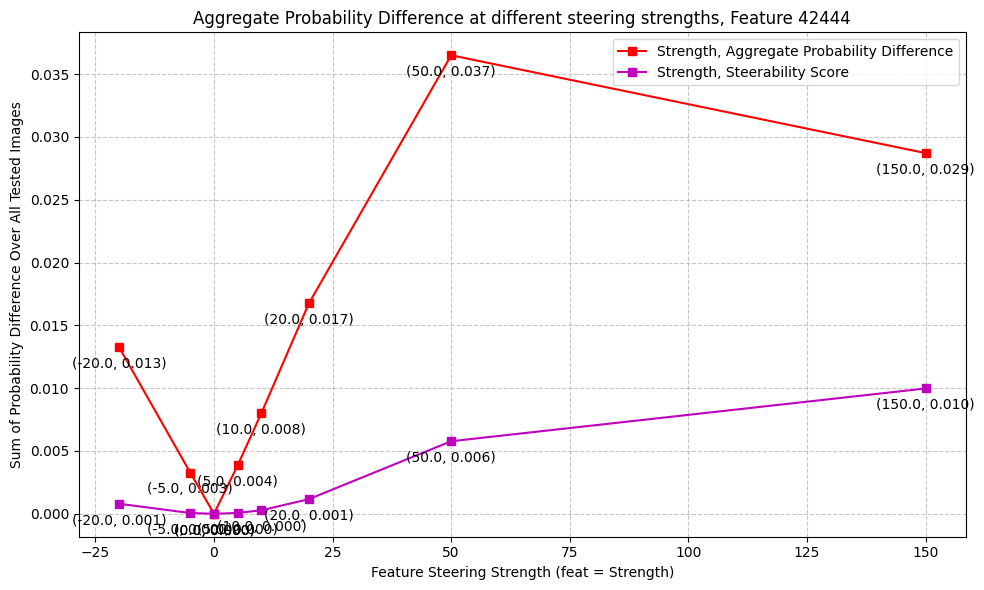

42444
150.0 ['cumshot' 'kits' 'packages' 'domains' 'cpu' 'dress' 'pricing' 'pills'
 'kids' 'pipeline']
150.0 probs tensor([0.0285, 0.0272, 0.0272, 0.0227, 0.0215, 0.0211, 0.0189, 0.0185, 0.0182,
        0.0172], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0008, 0.0005, 0.0004, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['cumshot' 'domains' 'pills' 'dress' 'pricing' 'pipeline' 'kids' 'phones'
 'kits' 'cables']


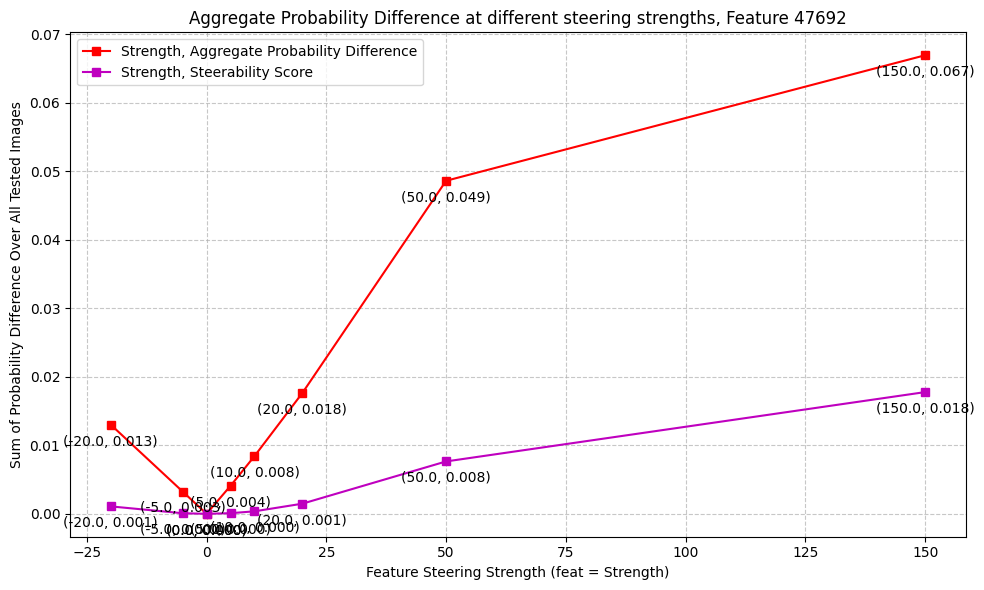

47692
150.0 ['batteries' 'kits' 'orders' 'charge' 'sublime' 'officers' 'voltage'
 'packages' 'outlet' 'cells']
150.0 probs tensor([0.0605, 0.0501, 0.0441, 0.0406, 0.0335, 0.0303, 0.0262, 0.0240, 0.0141,
        0.0123], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.4833e-03, 1.9768e-03, 1.4560e-03, 1.4462e-03, 1.2395e-03, 8.9904e-04,
        6.2446e-04, 1.7454e-04, 9.3529e-05, 9.0924e-05])
['batteries' 'orders' 'kits' 'sublime' 'officers' 'charge' 'voltage'
 'outlet' 'battery' 'subscriptions']


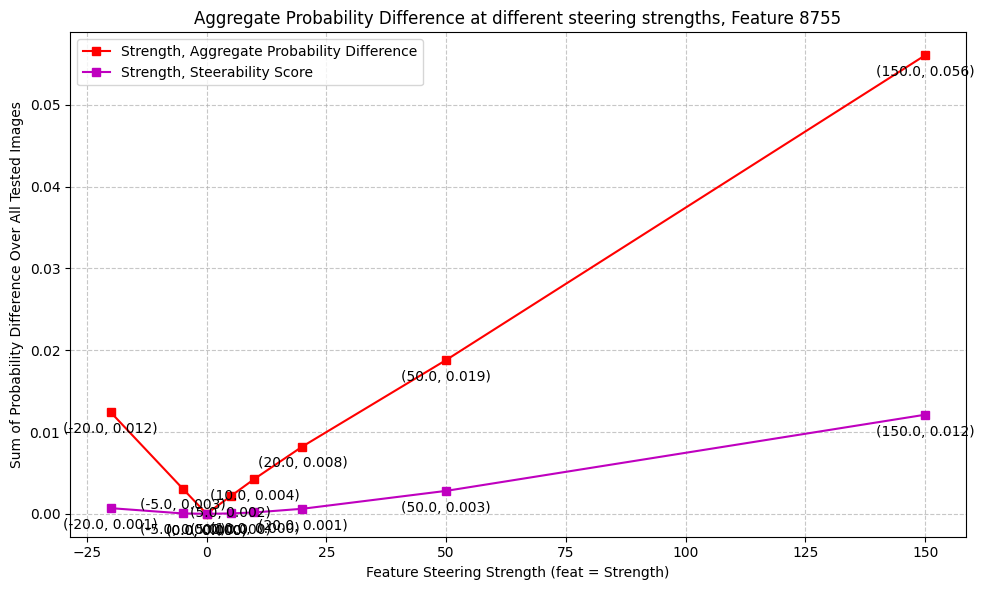

8755
150.0 ['casual' 'overall' 'engine' 'feet' 'yoga' 'organisation' 'family' 'crew'
 'downloads' 'quality']
150.0 probs tensor([0.0590, 0.0334, 0.0281, 0.0237, 0.0181, 0.0176, 0.0176, 0.0169, 0.0115,
        0.0112], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.1445e-03, 1.1753e-03, 8.2738e-04, 4.7351e-04, 3.3977e-04, 2.7318e-04,
        2.0959e-04, 1.2149e-04, 1.0152e-04, 8.4025e-05])
['casual' 'overall' 'engine' 'feet' 'organisation' 'crew' 'yoga'
 'downloads' 'quality' 'engines']


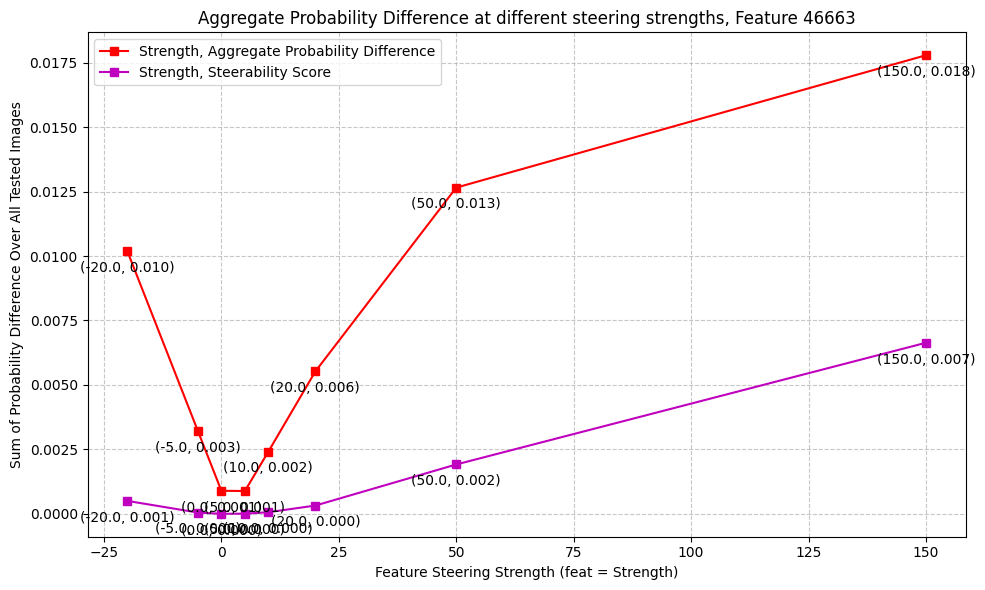

46663
150.0 ['managers' 'tampa' 'family' 'clients' 'kings' 'spiritual' 'census'
 'dates' 'families' 'guests']
150.0 probs tensor([0.0168, 0.0163, 0.0152, 0.0134, 0.0132, 0.0117, 0.0111, 0.0099, 0.0096,
        0.0094], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.1631e-04, 2.3464e-04, 1.5424e-04, 1.1099e-04, 9.9745e-05, 9.5422e-05,
        9.4785e-05, 8.6304e-05, 7.3943e-05, 5.7676e-05])
['managers' 'tampa' 'clients' 'dates' 'wireless' 'policies' 'kings'
 'millions' 'losses' 'folks']


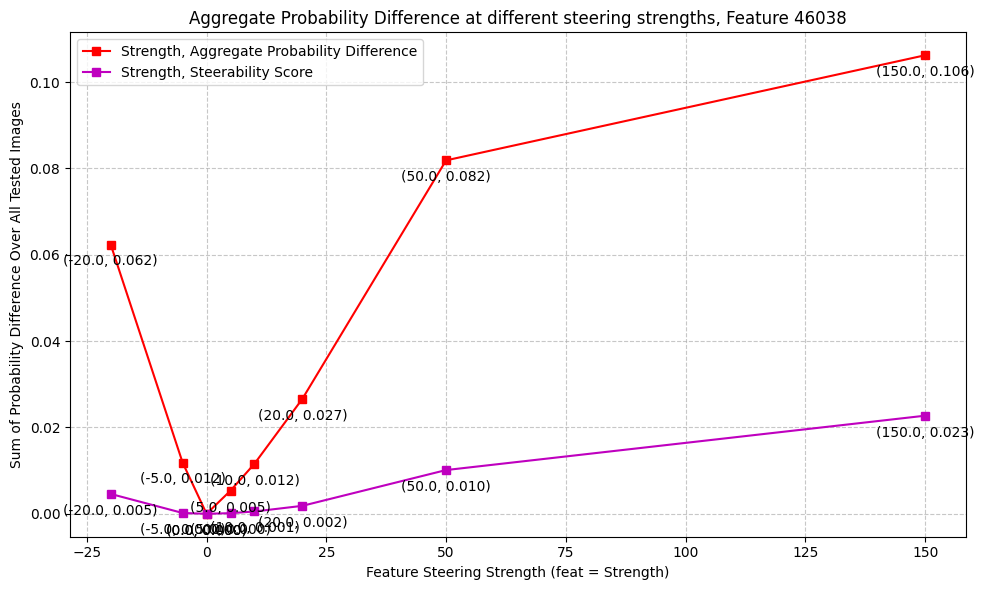

46038
150.0 ['packages' 'parents' 'users' 'fitness' 'machines' 'kits' 'efficiency'
 'apartments' 'mechanisms' 'supplements']
150.0 probs tensor([0.1296, 0.0512, 0.0455, 0.0278, 0.0202, 0.0199, 0.0196, 0.0187, 0.0144,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1278e-02, 2.5224e-03, 2.4753e-03, 4.3765e-04, 4.2282e-04, 3.2452e-04,
        2.5260e-04, 1.1804e-04, 1.0565e-04, 9.3616e-05])
['packages' 'parents' 'users' 'fitness' 'machines' 'efficiency'
 'supplements' 'teachers' 'mechanisms' 'charts']


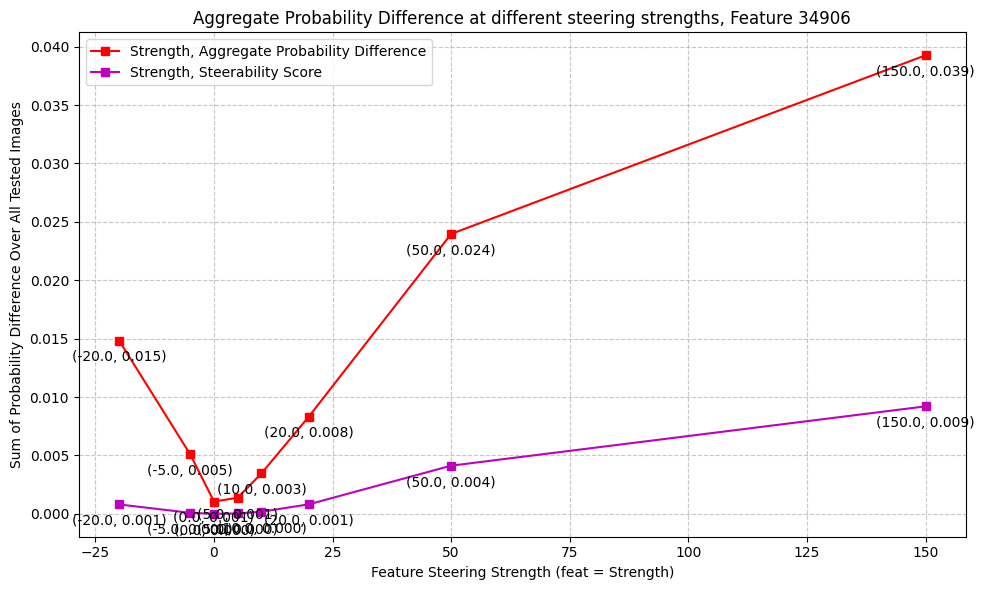

34906
150.0 ['shopper' 'mom' 'tourist' 'shirts' 'motion' 'analyst' 'families'
 'seattle' 'dancing' 'manager']
150.0 probs tensor([0.0420, 0.0300, 0.0255, 0.0161, 0.0113, 0.0109, 0.0097, 0.0092, 0.0087,
        0.0083], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.5418e-03, 8.1454e-04, 2.4819e-04, 1.3381e-04, 9.2565e-05, 9.0698e-05,
        6.8002e-05, 6.7539e-05, 6.3131e-05, 5.0467e-05])
['shopper' 'mom' 'tourist' 'analyst' 'seattle' 'shirts' 'handle' 'manager'
 'modem' 'portland']


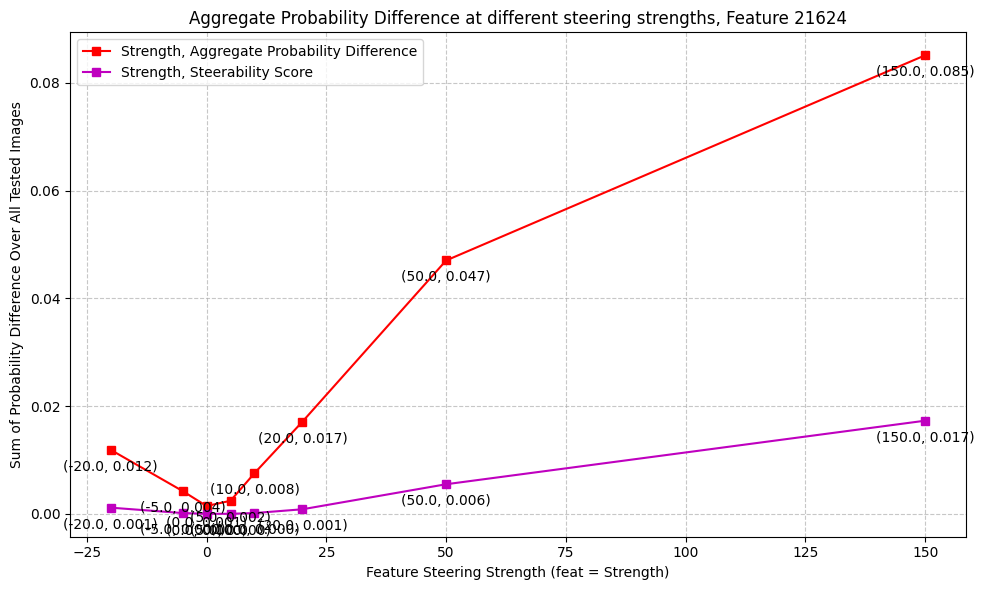

21624
150.0 ['tourist' 'without' 'antique' 'sublime' 'bills' 'bags' 'output' 'lift'
 'ministry' 'rental']
150.0 probs tensor([0.0976, 0.0514, 0.0263, 0.0257, 0.0186, 0.0167, 0.0151, 0.0145, 0.0140,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0072, 0.0026, 0.0009, 0.0007, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['tourist' 'without' 'sublime' 'antique' 'ministry' 'lift' 'commit'
 'rental' 'throat' 'bags']


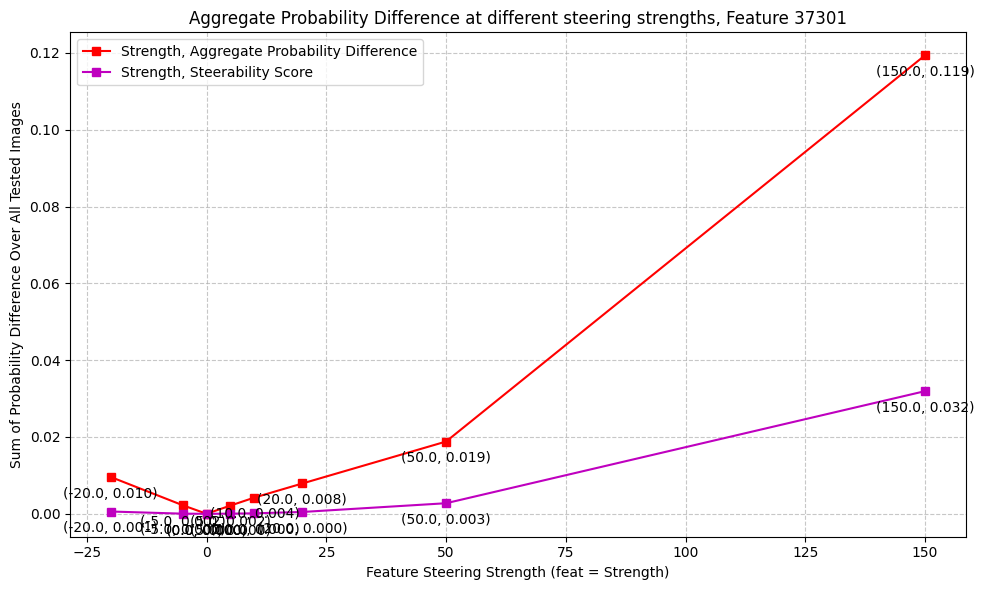

37301
150.0 ['chemical' 'cialis' 'chemicals' 'charge' 'gulf' 'chemistry' 'walk' 'gold'
 'dad' 'medication']
150.0 probs tensor([0.1171, 0.0926, 0.0343, 0.0199, 0.0169, 0.0165, 0.0160, 0.0130, 0.0108,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.4257e-02, 9.9330e-03, 1.2620e-03, 2.2139e-04, 2.1446e-04, 1.9965e-04,
        1.8700e-04, 1.1680e-04, 1.1111e-04, 9.4286e-05])
['chemical' 'cialis' 'chemicals' 'gulf' 'chemistry' 'walk' 'gold' 'charge'
 'dildo' 'medication']


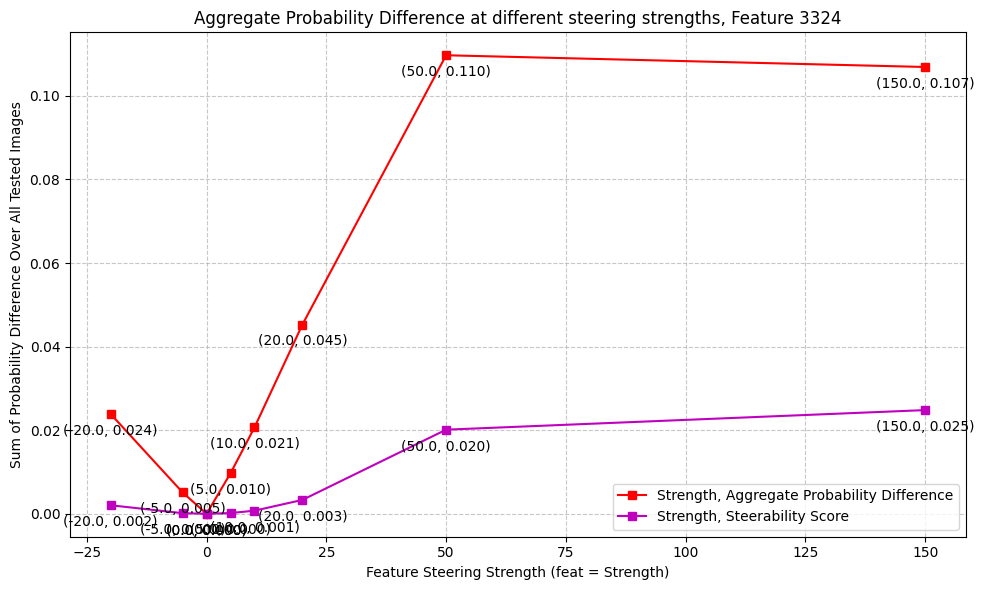

3324
150.0 ['kits' 'bills' 'milfs' 'vat' 'pub' 'ram' 'cam' 'kit' 'fuel' 'fuck']
150.0 probs tensor([0.1122, 0.1087, 0.0502, 0.0290, 0.0260, 0.0175, 0.0168, 0.0135, 0.0133,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0114, 0.0044, 0.0027, 0.0008, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['kits' 'bills' 'milfs' 'vat' 'ram' 'cam' 'pub' 'kit' 'fuel' 'fuck']


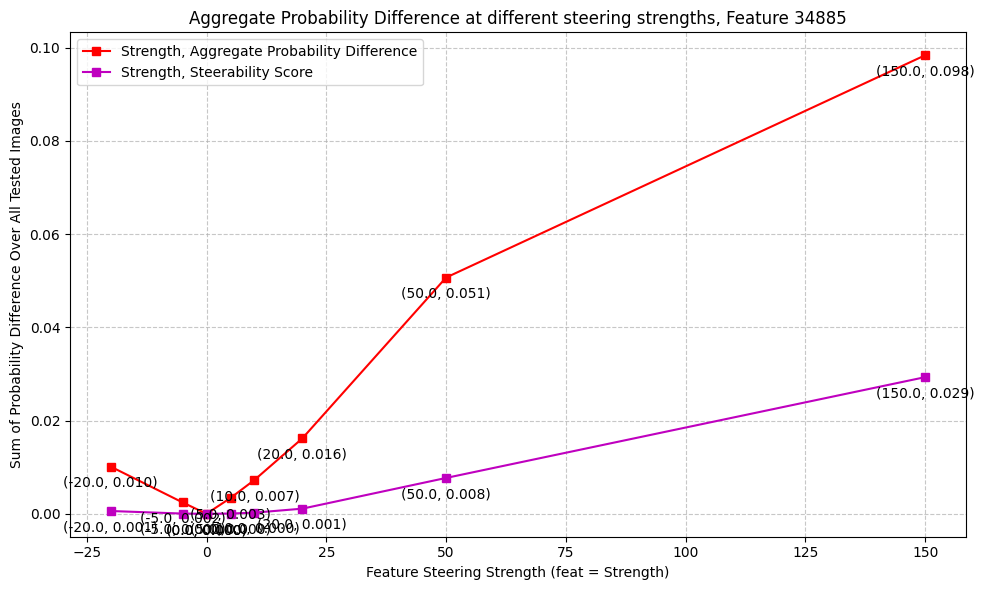

34885
150.0 ['orleans' 'drinking' 'steps' 'upskirt' 'apartments' 'sublime' 'vegas'
 'details' 'owners' 'pregnant']
150.0 probs tensor([0.0981, 0.0764, 0.0656, 0.0551, 0.0381, 0.0246, 0.0245, 0.0194, 0.0189,
        0.0138], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0097, 0.0046, 0.0036, 0.0029, 0.0008, 0.0008, 0.0005, 0.0004, 0.0004,
        0.0001])
['orleans' 'steps' 'drinking' 'upskirt' 'sublime' 'apartments' 'vegas'
 'details' 'owners' 'pregnant']


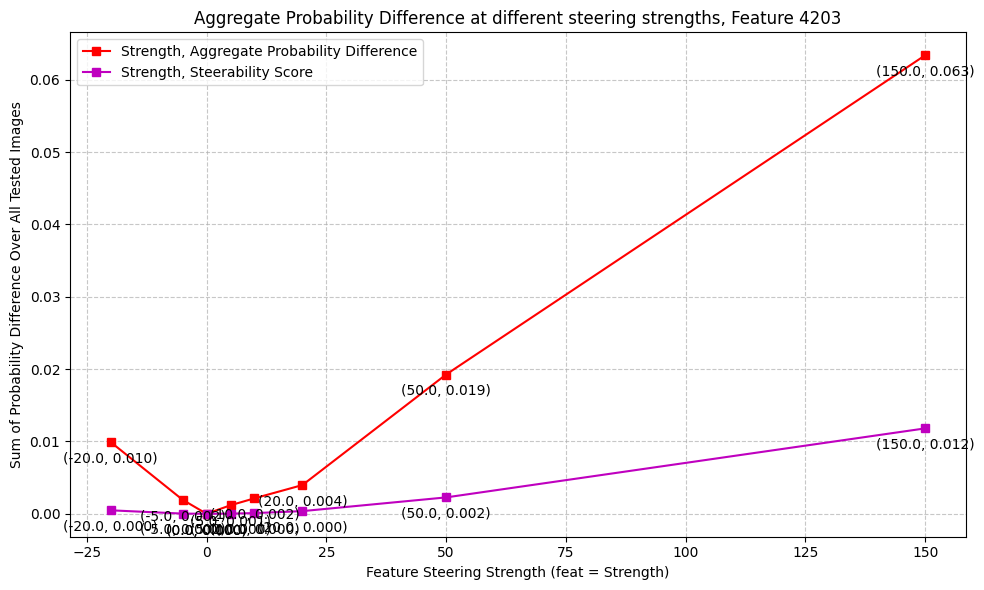

4203
150.0 ['packet' 'dicke' 'places' 'oldest' 'ceo' 'dance' 'czech' 'offline'
 'college' 'berlin']
150.0 probs tensor([0.0643, 0.0294, 0.0184, 0.0163, 0.0142, 0.0110, 0.0107, 0.0099, 0.0084,
        0.0083], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.0187e-03, 8.4302e-04, 2.7822e-04, 2.3627e-04, 2.0967e-04, 1.0046e-04,
        9.6881e-05, 8.1355e-05, 6.4314e-05, 5.7041e-05])
['packet' 'dicke' 'places' 'oldest' 'ceo' 'offline' 'czech' 'dance'
 'kentucky' 'berlin']


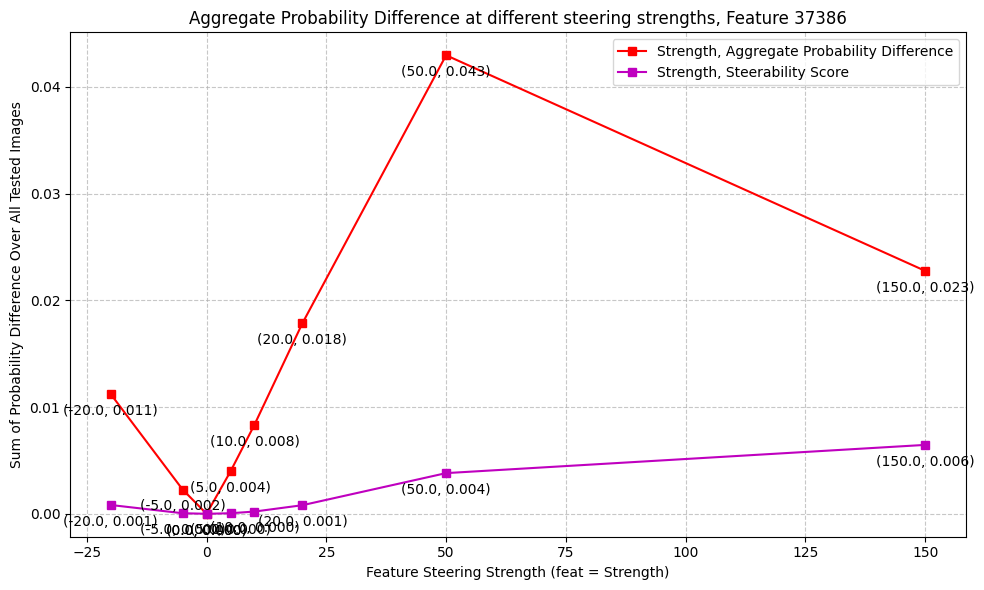

37386
150.0 ['capacity' 'cyprus' 'utility' 'census' 'antique' 'obvious' 'yours'
 'utilities' 'carrying' 'antiques']
150.0 probs tensor([0.0384, 0.0145, 0.0114, 0.0114, 0.0106, 0.0095, 0.0093, 0.0092, 0.0090,
        0.0088], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.1789e-04, 1.8656e-04, 1.2954e-04, 9.2665e-05, 8.2232e-05, 7.5419e-05,
        7.2214e-05, 6.8184e-05, 6.5573e-05, 5.6313e-05])
['capacity' 'cyprus' 'utility' 'antique' 'antiques' 'yours' 'tennessee'
 'physicians' 'obvious' 'carrying']


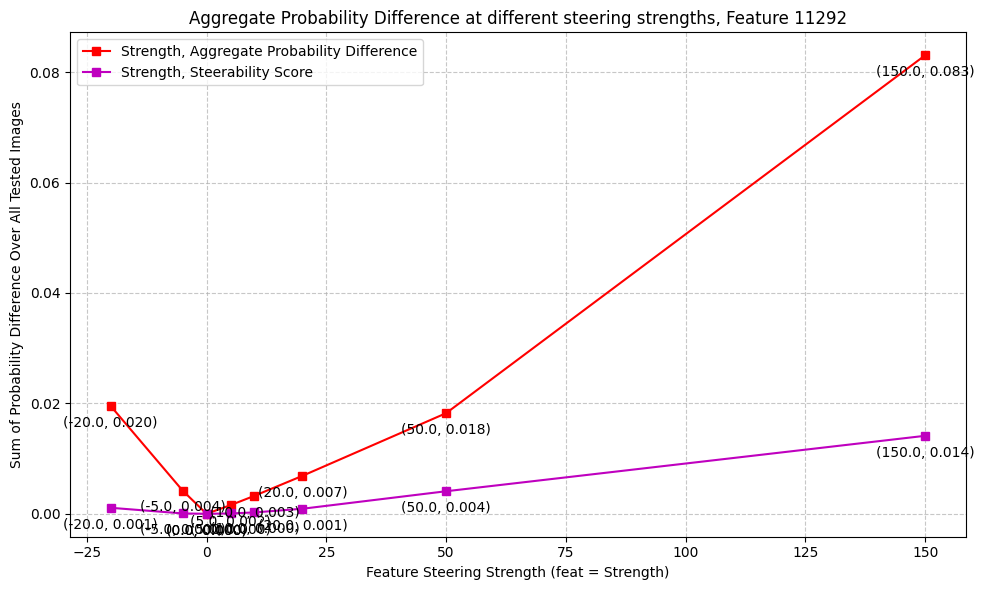

11292
150.0 ['manage' 'tourist' 'moves' 'motion' 'moving' 'unless' 'faces' 'behaviour'
 'ghost' 'spiritual']
150.0 probs tensor([0.0842, 0.0181, 0.0172, 0.0164, 0.0150, 0.0147, 0.0144, 0.0135, 0.0121,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.9003e-03, 2.6694e-04, 1.7431e-04, 1.6081e-04, 1.4916e-04, 1.4094e-04,
        1.3733e-04, 1.1004e-04, 9.1726e-05, 8.2671e-05])
['manage' 'moves' 'moving' 'behaviour' 'unless' 'motion' 'ghost' 'brass'
 'mature' 'underground']


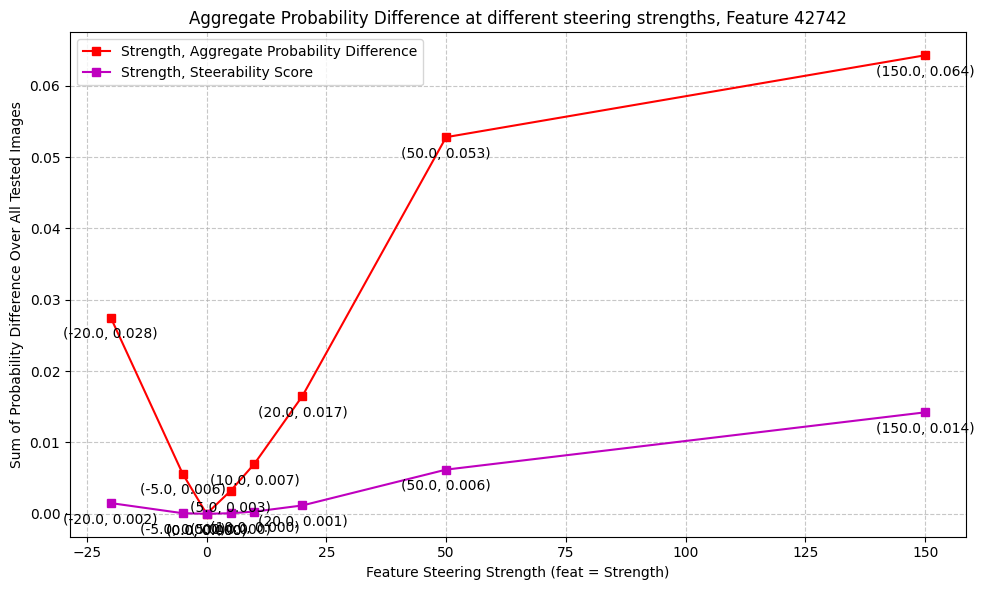

42742
150.0 ['family' 'contains' 'ordinary' 'tall' 'owners' 'yes' 'quantity' 'monthly'
 'cartoon' 'owner']
150.0 probs tensor([0.0723, 0.0467, 0.0321, 0.0262, 0.0248, 0.0158, 0.0146, 0.0126, 0.0125,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.1310e-03, 1.8879e-03, 8.4371e-04, 7.6148e-04, 4.7294e-04, 2.4783e-04,
        2.2872e-04, 1.5161e-04, 1.3199e-04, 9.3693e-05])
['family' 'contains' 'ordinary' 'owners' 'tall' 'quantity' 'yes' 'monthly'
 'owner' 'continue']


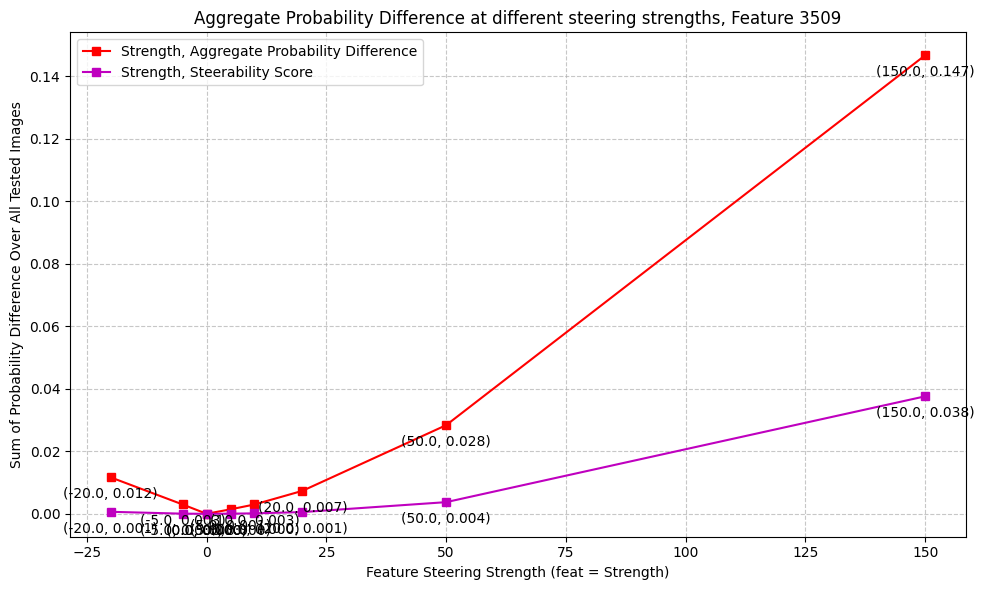

3509
150.0 ['mouth' 'memory' 'moment' 'throat' 'messenger' 'manner' 'movement'
 'amounts' 'tobacco' 'pregnant']
150.0 probs tensor([0.1388, 0.0641, 0.0483, 0.0404, 0.0293, 0.0275, 0.0223, 0.0210, 0.0116,
        0.0114], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.1548e-02, 3.7798e-03, 2.1069e-03, 1.7245e-03, 8.6069e-04, 7.8089e-04,
        5.1330e-04, 4.0418e-04, 1.4888e-04, 9.5501e-05])
['mouth' 'memory' 'throat' 'moment' 'messenger' 'manner' 'movement'
 'amounts' 'tobacco' 'pregnant']


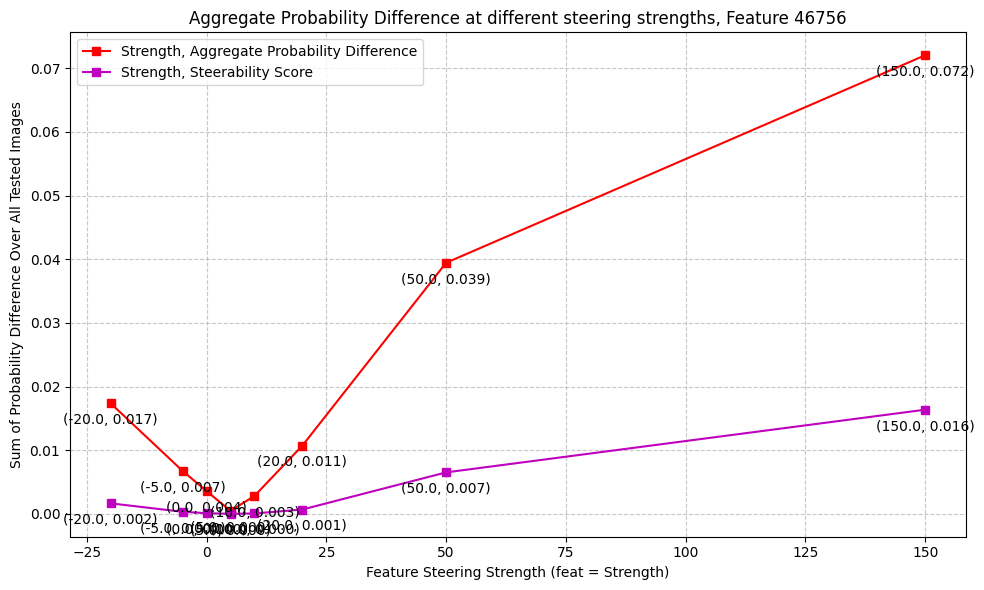

46756
150.0 ['family' 'houses' 'families' 'apartments' 'capacity' 'friends' 'parents'
 'friendly' 'gang' 'homes']
150.0 probs tensor([0.0839, 0.0696, 0.0429, 0.0355, 0.0214, 0.0168, 0.0163, 0.0110, 0.0104,
        0.0096], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.1900e-03, 3.6120e-03, 1.5325e-03, 6.2919e-04, 2.3156e-04, 1.6621e-04,
        9.1337e-05, 8.7355e-05, 8.5235e-05, 6.6737e-05])
['family' 'houses' 'families' 'apartments' 'parents' 'friends' 'homes'
 'gang' 'friendly' 'carrying']


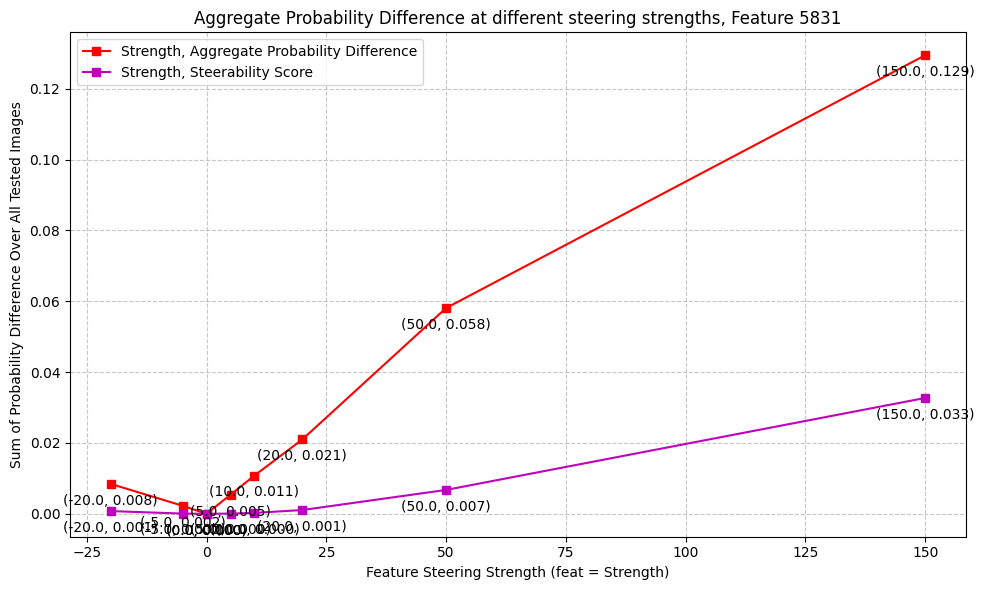

5831
150.0 ['utilities' 'downloads' 'certificate' 'bills' 'specs' 'checks' 'man'
 'savings' 'difficult' 'charger']
150.0 probs tensor([0.1233, 0.1006, 0.0243, 0.0219, 0.0136, 0.0117, 0.0112, 0.0109, 0.0107,
        0.0098], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.6767e-02, 1.0076e-02, 4.7451e-04, 2.0182e-04, 1.1912e-04, 1.0599e-04,
        8.9690e-05, 8.5387e-05, 7.2139e-05, 4.4145e-05])
['utilities' 'downloads' 'certificate' 'specs' 'checks' 'savings'
 'charger' 'difficult' 'officials' 'offered']


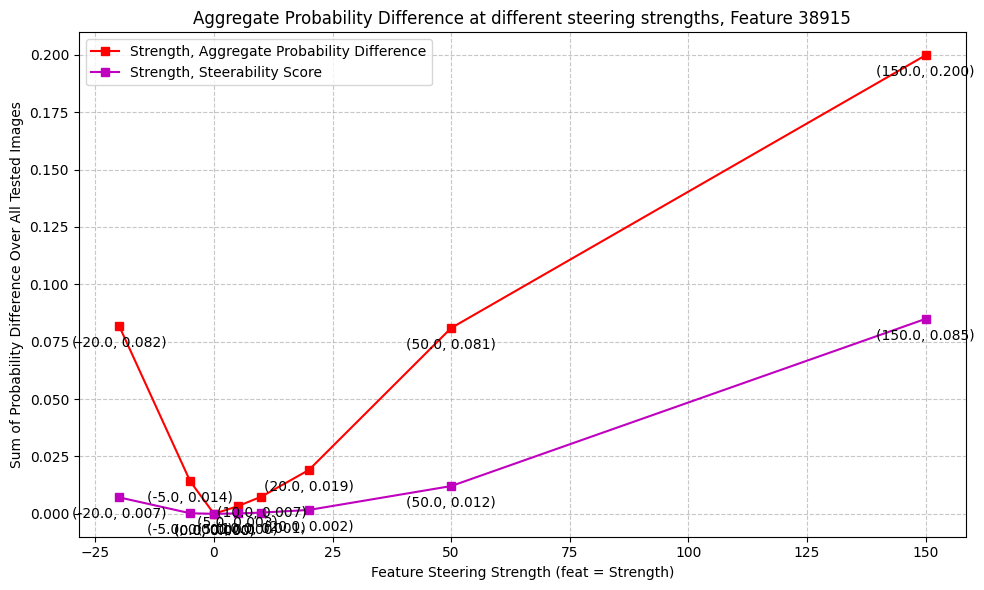

38915
150.0 ['pat' 'pub' 'fetish' 'apartments' 'combat' 'packet' 'dancing' 'laptops'
 'parents' 'cumshots']
150.0 probs tensor([0.2253, 0.2236, 0.0284, 0.0194, 0.0117, 0.0098, 0.0087, 0.0080, 0.0080,
        0.0076], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.9926e-02, 3.8508e-02, 7.5975e-04, 1.5826e-04, 9.9081e-05, 7.7675e-05,
        7.4557e-05, 7.2474e-05, 7.1479e-05, 5.5260e-05])
['pat' 'pub' 'fetish' 'combat' 'cumshots' 'laptops' 'apartments' 'throat'
 'packet' 'teachers']


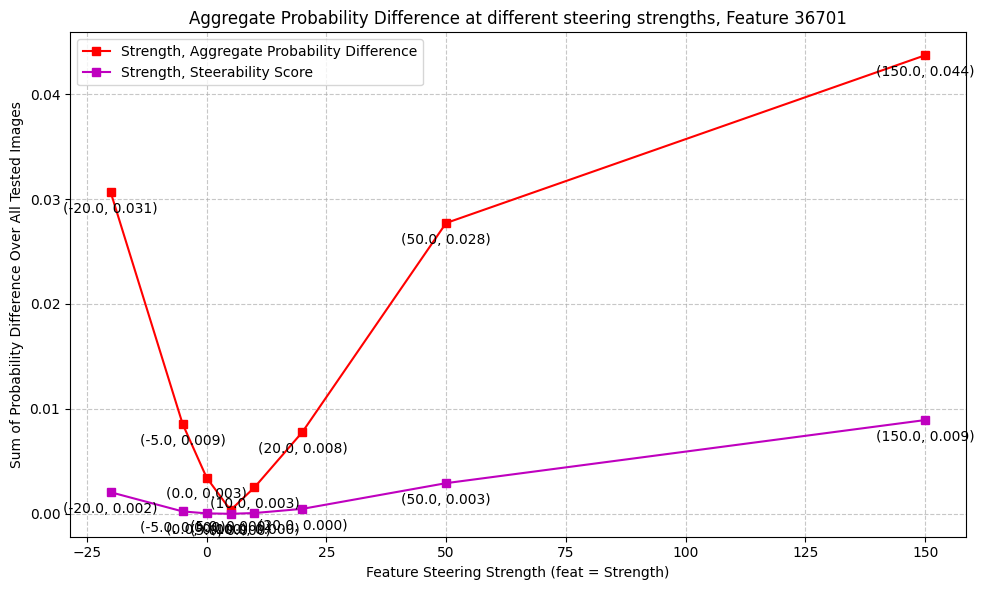

36701
150.0 ['tourist' 'guests' 'ticket' 'angels' 'tourism' 'receipt' 'pass'
 'counseling' 'counts' 'pricing']
150.0 probs tensor([0.0542, 0.0264, 0.0196, 0.0179, 0.0175, 0.0141, 0.0113, 0.0108, 0.0105,
        0.0093], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.9102e-03, 4.9778e-04, 3.3629e-04, 3.2224e-04, 1.2790e-04, 1.1384e-04,
        1.1314e-04, 1.0645e-04, 8.2615e-05, 7.8335e-05])
['tourist' 'guests' 'ticket' 'angels' 'mysql' 'tourism' 'counseling'
 'receipt' 'pricing' 'counts']


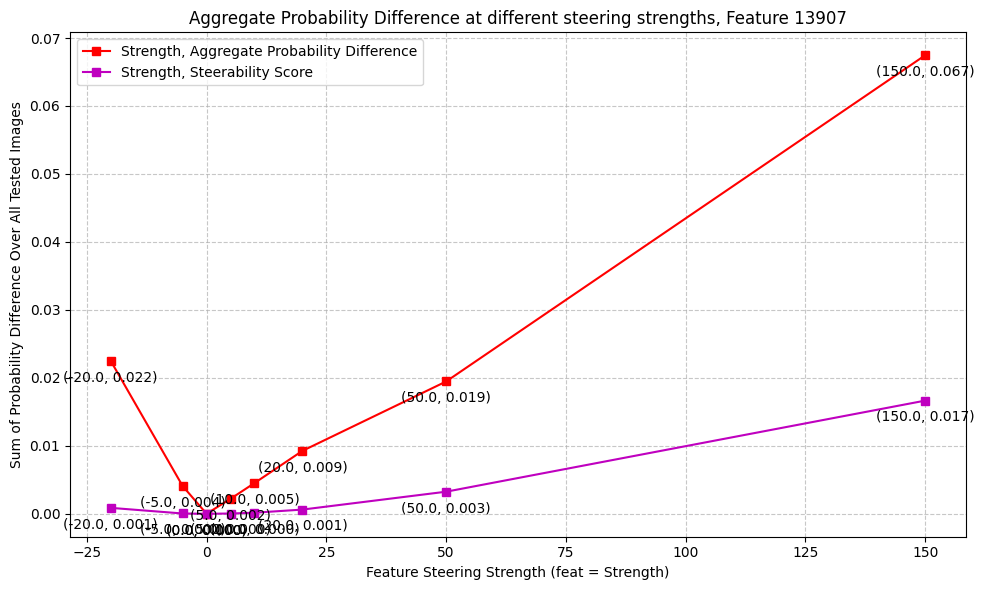

13907
150.0 ['mouth' 'pupils' 'upskirt' 'throat' 'cape' 'faces' 'houses' 'house'
 'capital' 'proper']
150.0 probs tensor([0.0616, 0.0574, 0.0465, 0.0234, 0.0218, 0.0162, 0.0159, 0.0118, 0.0105,
        0.0098], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.5513e-03, 2.7838e-03, 2.1235e-03, 7.4573e-04, 4.4148e-04, 1.1224e-04,
        1.0938e-04, 9.8544e-05, 9.6282e-05, 9.1119e-05])
['mouth' 'pupils' 'upskirt' 'throat' 'cape' 'faces' 'proper' 'house'
 'capital' 'principal']


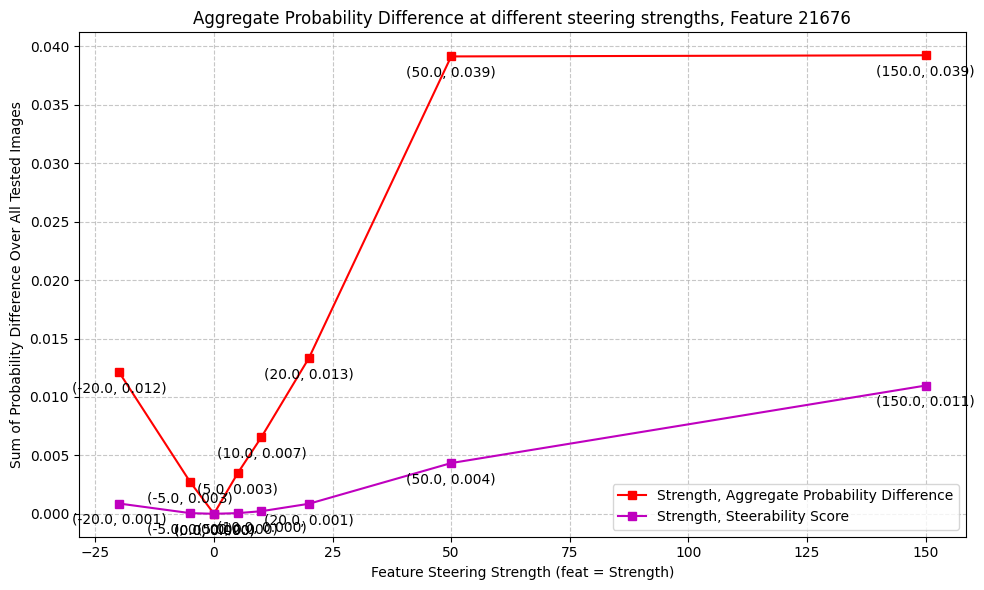

21676
150.0 ['drinking' 'simpson' 'grants' 'resolution' 'mechanisms' 'poster'
 'cartoon' 'card' 'craig' 'drink']
150.0 probs tensor([0.0520, 0.0299, 0.0260, 0.0227, 0.0204, 0.0197, 0.0177, 0.0174, 0.0160,
        0.0154], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0015, 0.0010, 0.0006, 0.0005, 0.0003, 0.0003, 0.0003, 0.0002, 0.0001,
        0.0001])
['drinking' 'simpson' 'grants' 'resolution' 'poster' 'mechanisms' 'card'
 'craig' 'donald' 'lesbian']


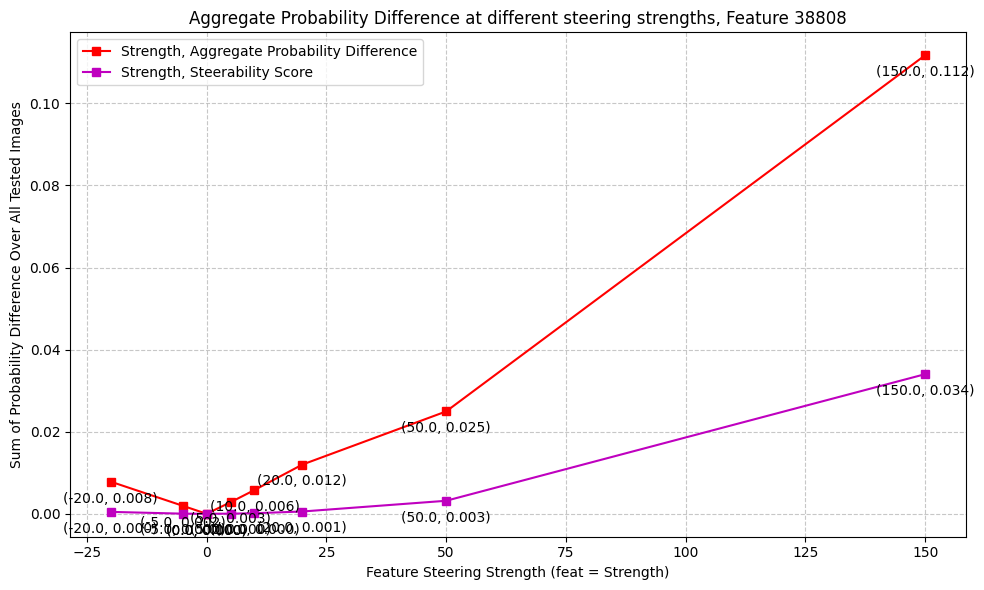

38808
150.0 ['specifications' 'cellular' 'engines' 'seats' 'maintenance' 'engine'
 'cpu' 'mechanism' 'leadership' 'mechanisms']
150.0 probs tensor([0.1078, 0.1053, 0.0486, 0.0294, 0.0153, 0.0128, 0.0121, 0.0100, 0.0087,
        0.0077], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2481e-02, 1.2219e-02, 2.4180e-03, 8.1222e-04, 2.3563e-04, 1.6800e-04,
        9.2752e-05, 5.2671e-05, 4.0267e-05, 3.7274e-05])
['specifications' 'cellular' 'engines' 'seats' 'maintenance' 'engine'
 'mechanism' 'leadership' 'gear' 'cooling']


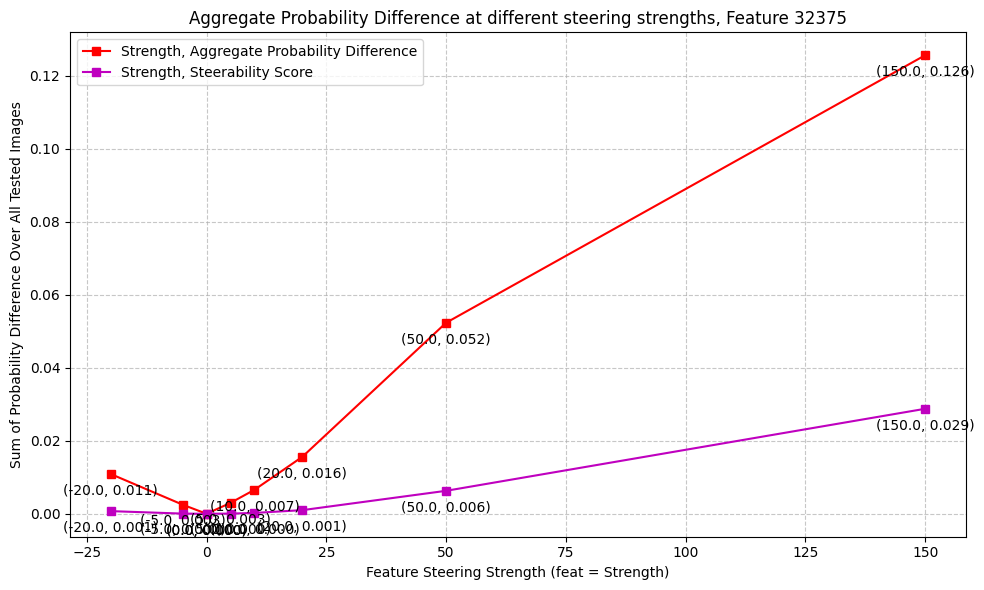

32375
150.0 ['backup' 'drinking' 'combat' 'cleaning' 'charge' 'wine' 'pregnant'
 'dancing' 'promotion' 'drink']
150.0 probs tensor([0.1357, 0.0785, 0.0407, 0.0282, 0.0211, 0.0171, 0.0141, 0.0132, 0.0124,
        0.0121], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.5786e-02, 4.1926e-03, 1.7587e-03, 8.1857e-04, 2.5607e-04, 1.7895e-04,
        1.6565e-04, 1.5694e-04, 9.2840e-05, 7.9055e-05])
['backup' 'drinking' 'combat' 'cleaning' 'wine' 'promotion' 'pregnant'
 'charge' 'dancing' 'potter']


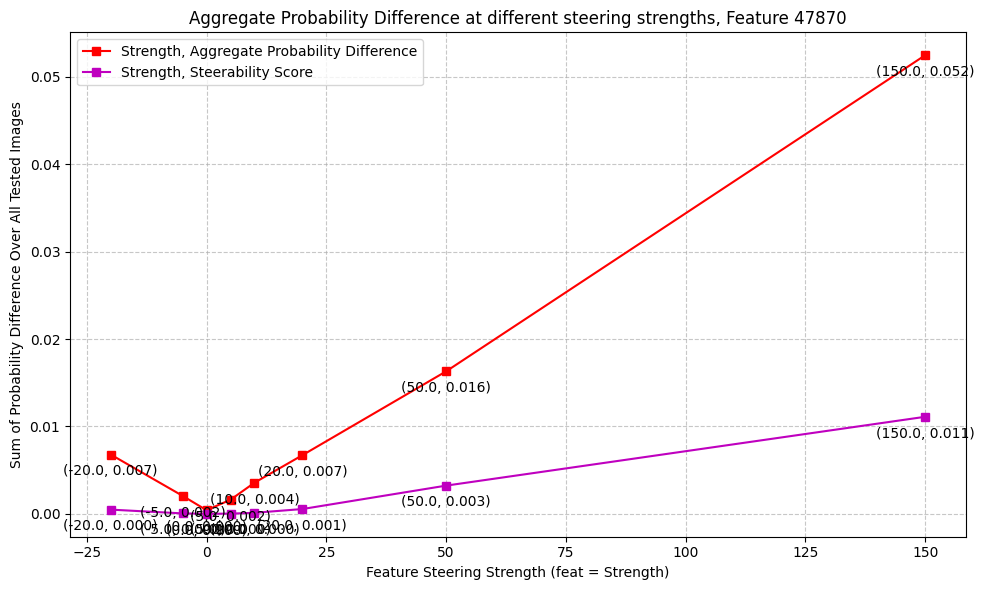

47870
150.0 ['douglas' 'pass' 'mac' 'programmes' 'famous' 'ac' 'longer' 'mechanisms'
 'crazy' 'bags']
150.0 probs tensor([0.0526, 0.0305, 0.0226, 0.0219, 0.0148, 0.0121, 0.0121, 0.0117, 0.0116,
        0.0112], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.7548e-03, 6.0913e-04, 5.3365e-04, 4.8784e-04, 1.9247e-04, 1.3204e-04,
        1.2797e-04, 1.2017e-04, 1.0377e-04, 9.5515e-05])
['douglas' 'pass' 'programmes' 'mac' 'famous' 'ac' 'longer' 'particular'
 'crazy' 'do']


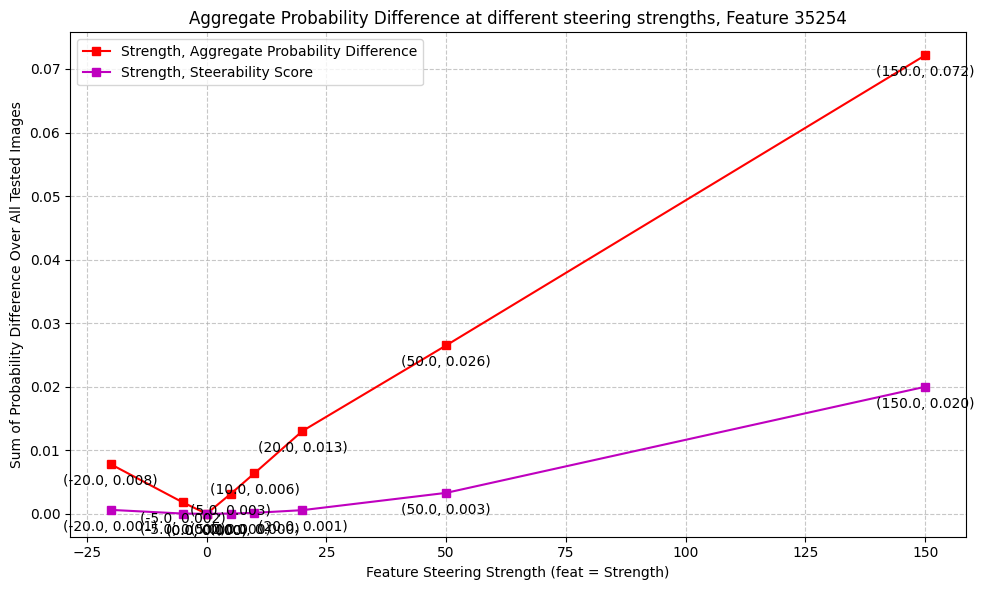

35254
150.0 ['tall' 'giant' 'dildo' 'pipeline' 'pat' 'capacity' 'up' 'patent' 'vat'
 'carry']
150.0 probs tensor([0.0834, 0.0736, 0.0492, 0.0296, 0.0213, 0.0166, 0.0151, 0.0149, 0.0139,
        0.0132], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0052, 0.0042, 0.0032, 0.0010, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['tall' 'giant' 'dildo' 'pipeline' 'pat' 'patent' 'vat' 'up' 'large'
 'carry']


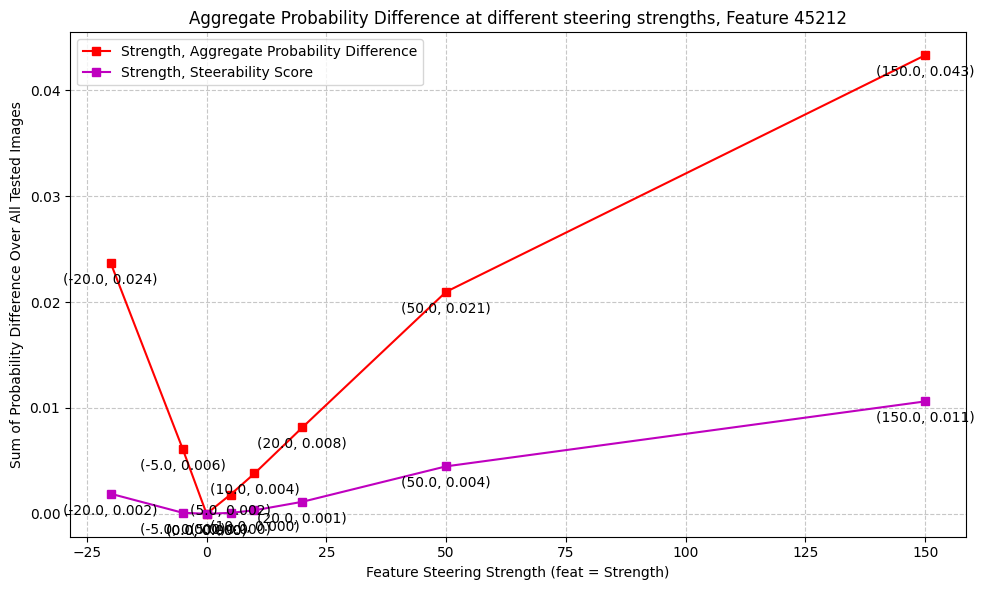

45212
150.0 ['couple' 'riding' 'multi' 'charge' 'couples' 'multiple' 'capital'
 'milfhunter' 'fat' 'capable']
150.0 probs tensor([0.0483, 0.0348, 0.0297, 0.0201, 0.0154, 0.0153, 0.0144, 0.0119, 0.0118,
        0.0115], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0019, 0.0009, 0.0008, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['couple' 'riding' 'multi' 'multiple' 'couples' 'capital' 'milfhunter'
 'charge' 'capable' 'comfort']


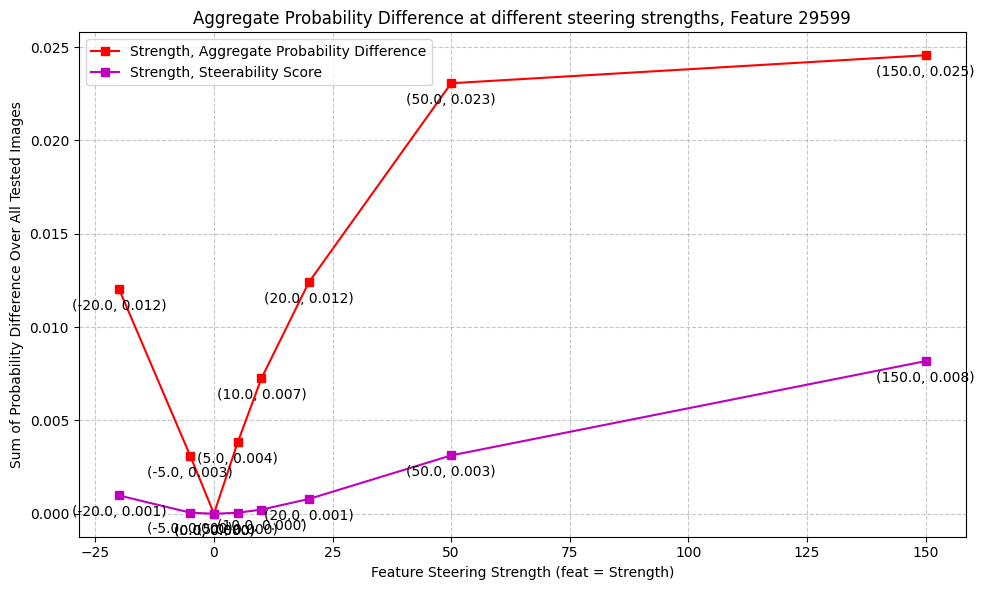

29599
150.0 ['tourist' 'father' 'spiritual' 'granted' 'georgia' 'brother' 'psychology'
 'certain' 'pat' 'bills']
150.0 probs tensor([0.0264, 0.0246, 0.0245, 0.0243, 0.0172, 0.0169, 0.0118, 0.0117, 0.0114,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.0328e-04, 5.2115e-04, 3.8276e-04, 2.9432e-04, 2.8753e-04, 2.7456e-04,
        1.1701e-04, 1.1520e-04, 1.0123e-04, 9.4131e-05])
['granted' 'father' 'spiritual' 'tourist' 'brother' 'georgia' 'certain'
 'psychology' 'resolution' 'century']


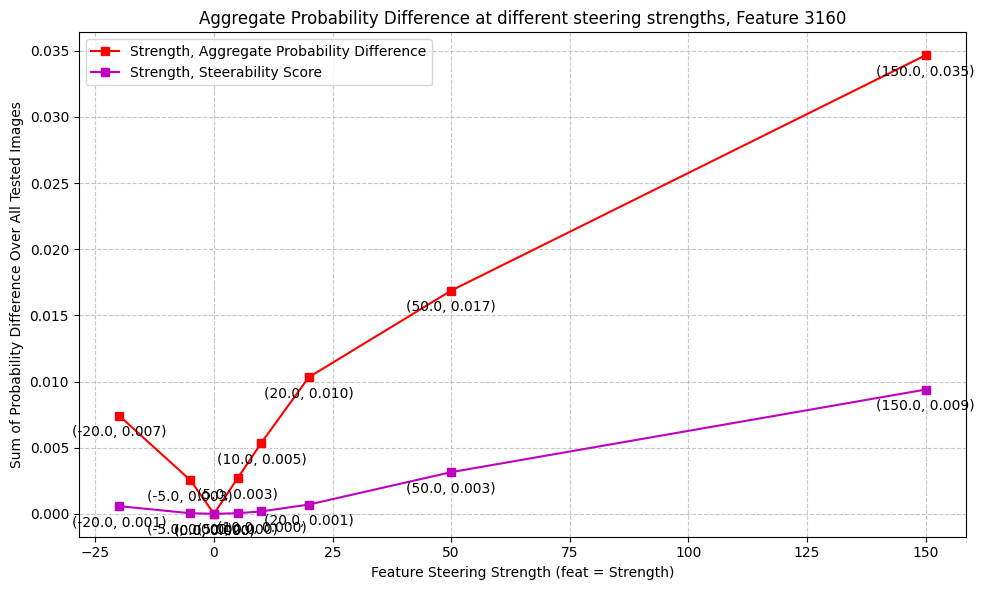

3160
150.0 ['clip' 'scripts' 'lights' 'circuit' 'milfs' 'charger' 'dancing' 'wells'
 'script' 'packages']
150.0 probs tensor([0.0365, 0.0232, 0.0208, 0.0169, 0.0165, 0.0157, 0.0150, 0.0149, 0.0137,
        0.0122], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0012, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['clip' 'lights' 'scripts' 'charger' 'wells' 'circuit' 'milfs' 'amp'
 'script' 'dancing']


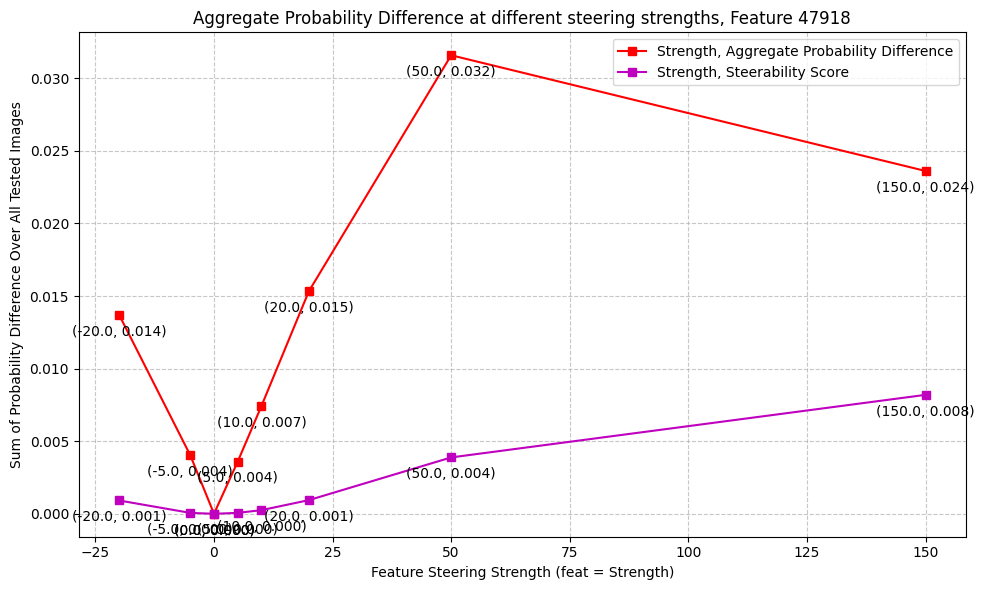

47918
150.0 ['receipt' 'concepts' 'samples' 'capacity' 'filled' 'placed' 'filed'
 'chip' 'acceptance' 'principle']
150.0 probs tensor([0.0256, 0.0241, 0.0203, 0.0173, 0.0139, 0.0123, 0.0114, 0.0112, 0.0107,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.5757e-04, 4.4209e-04, 4.3233e-04, 1.9207e-04, 1.5767e-04, 1.1116e-04,
        1.0871e-04, 1.0145e-04, 9.7281e-05, 8.4327e-05])
['concepts' 'receipt' 'samples' 'filled' 'placed' 'filed' 'acceptance'
 'cumshots' 'chip' 'principle']


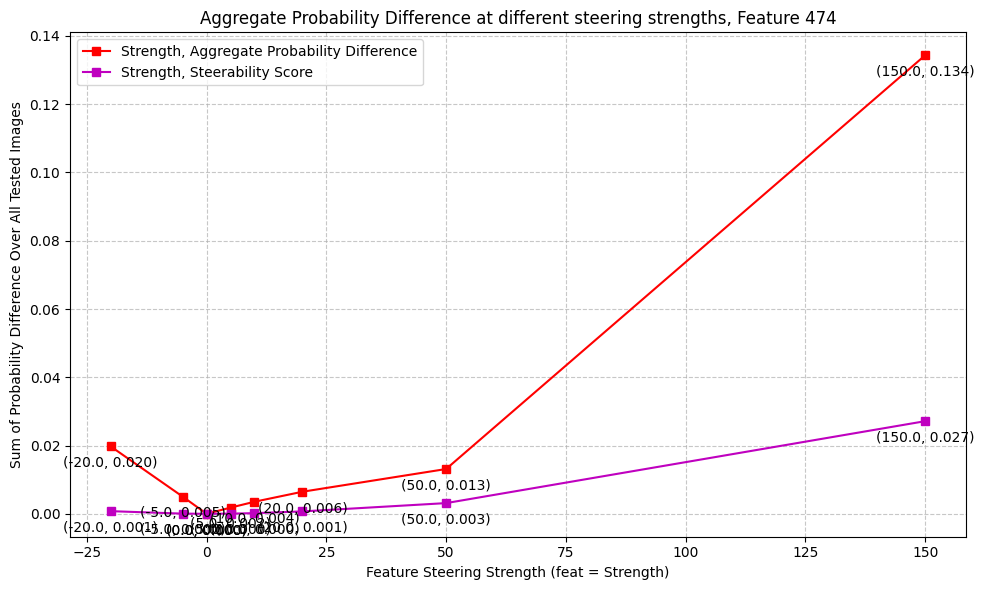

474
150.0 ['roads' 'matt' 'most' 'mature' 'coast' 'rail' 'mad' 'real' 'out' 'man']
150.0 probs tensor([0.1281, 0.0467, 0.0198, 0.0189, 0.0162, 0.0153, 0.0146, 0.0130, 0.0111,
        0.0103], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.8050e-02, 1.6153e-03, 4.1164e-04, 3.5767e-04, 2.3963e-04, 2.2495e-04,
        1.9681e-04, 1.2447e-04, 1.1540e-04, 7.8973e-05])
['roads' 'matt' 'most' 'mature' 'coast' 'rail' 'mad' 'real' 'split' 'road']


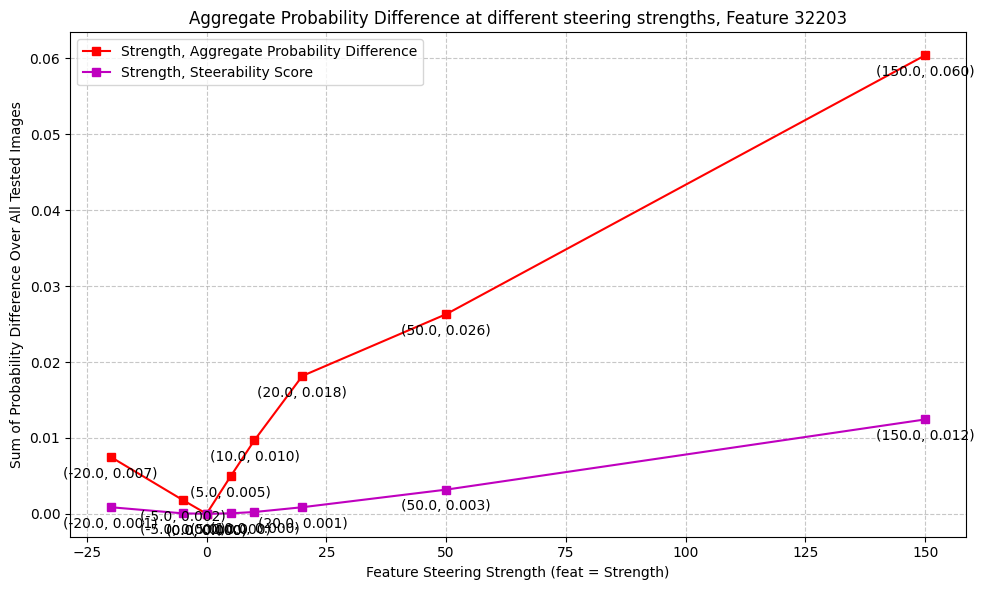

32203
150.0 ['pipeline' 'mountains' 'mountain' 'angels' 'bills' 'hills' 'steps'
 'moment' 'running' 'couple']
150.0 probs tensor([0.0566, 0.0382, 0.0275, 0.0205, 0.0182, 0.0167, 0.0161, 0.0157, 0.0142,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0037, 0.0014, 0.0007, 0.0004, 0.0003, 0.0002, 0.0001, 0.0001, 0.0001,
        0.0001])
['pipeline' 'mountains' 'mountain' 'angels' 'steps' 'hills' 'well'
 'horses' 'wings' 'moment']


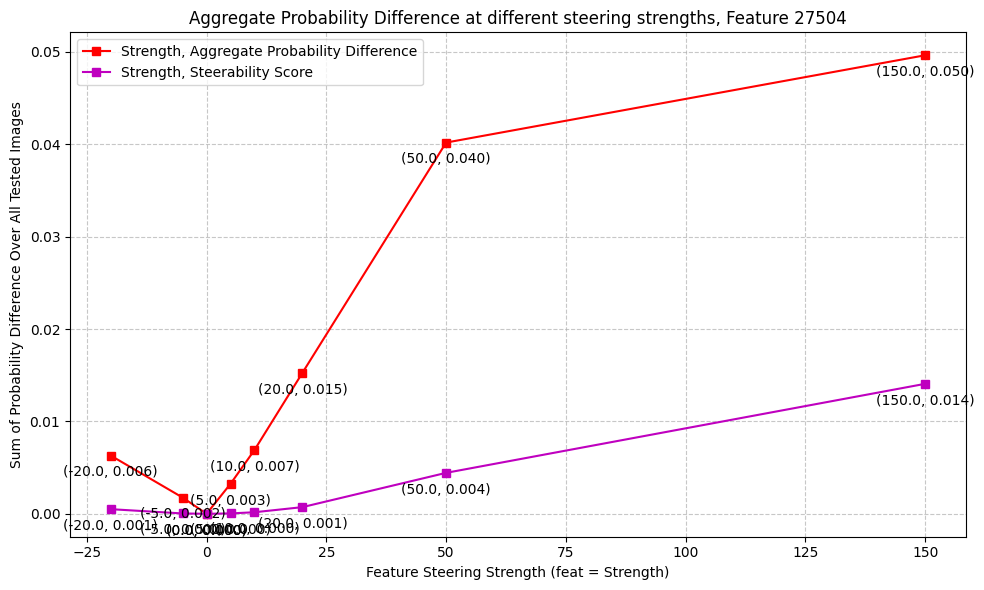

27504
150.0 ['poster' 'cartoon' 'certificate' 'boards' 'resume' 'documents' 'plates'
 'certification' 'posters' 'certificates']
150.0 probs tensor([0.0523, 0.0404, 0.0374, 0.0284, 0.0263, 0.0230, 0.0206, 0.0194, 0.0192,
        0.0166], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0025, 0.0012, 0.0009, 0.0007, 0.0005, 0.0004, 0.0004, 0.0004, 0.0004,
        0.0003])
['poster' 'certificate' 'boards' 'resume' 'documents' 'plates' 'cartoon'
 'posters' 'certification' 'certificates']


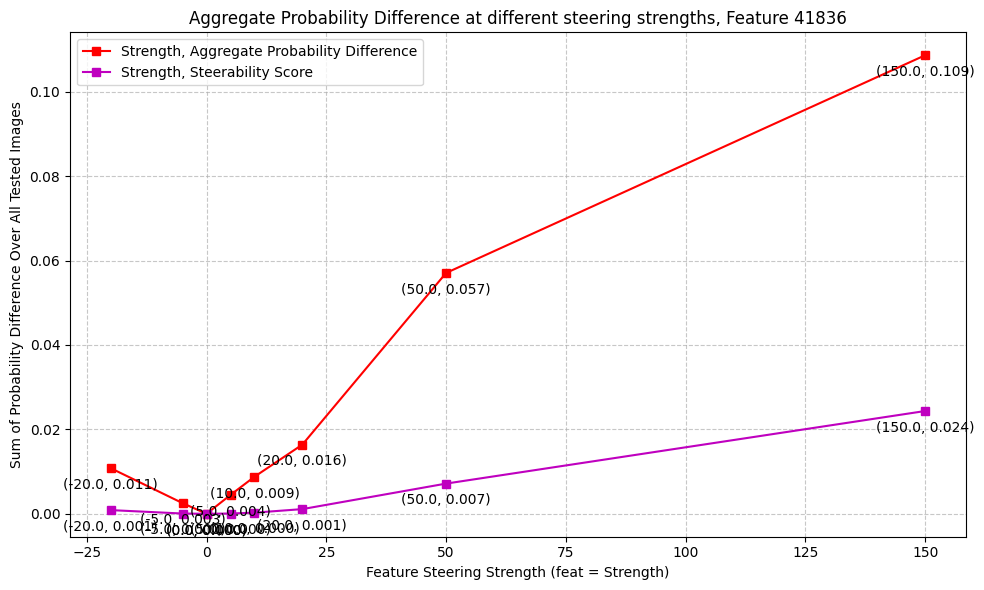

41836
150.0 ['family' 'couple' 'kits' 'checks' 'dolls' 'couples' 'looking' 'bills'
 'cells' 'guys']
150.0 probs tensor([0.1207, 0.0602, 0.0444, 0.0401, 0.0354, 0.0269, 0.0253, 0.0211, 0.0125,
        0.0125], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1798e-02, 2.9299e-03, 1.5304e-03, 1.2266e-03, 1.1531e-03, 6.5222e-04,
        6.4614e-04, 1.3814e-04, 9.4573e-05, 8.6414e-05])
['family' 'couple' 'checks' 'dolls' 'kits' 'couples' 'looking' 'processor'
 'images' 'amounts']


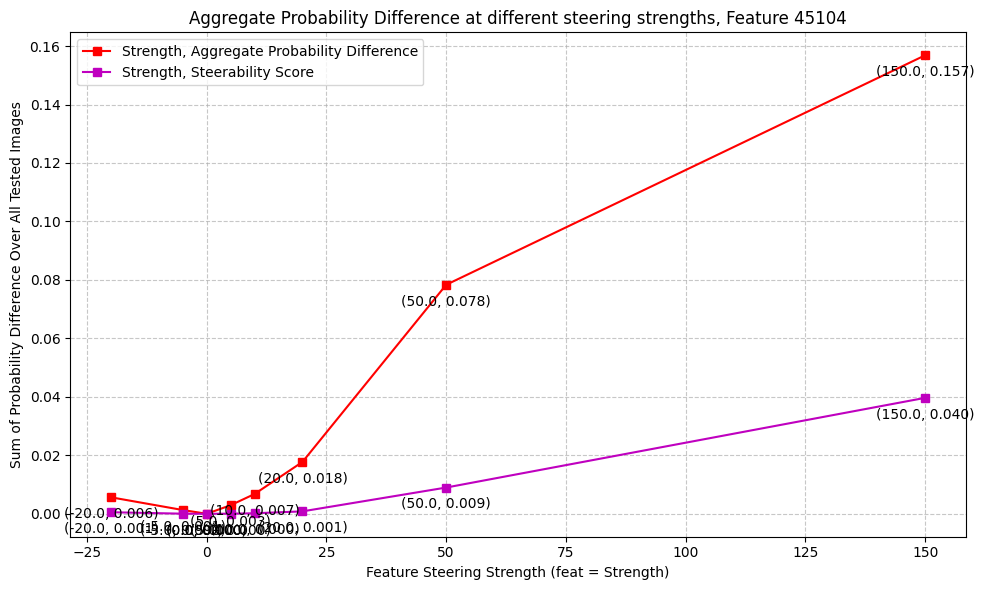

45104
150.0 ['shirts' 'jersey' 'clips' 'patch' 'cameras' 'tampa' 'pink' 'patches'
 'faces' 'polish']
150.0 probs tensor([0.1586, 0.0707, 0.0264, 0.0261, 0.0253, 0.0213, 0.0212, 0.0187, 0.0185,
        0.0174], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0246, 0.0047, 0.0008, 0.0007, 0.0006, 0.0004, 0.0004, 0.0004, 0.0003,
        0.0002])
['shirts' 'jersey' 'cameras' 'clips' 'patch' 'pink' 'tampa' 'patches'
 'laptops' 'polish']


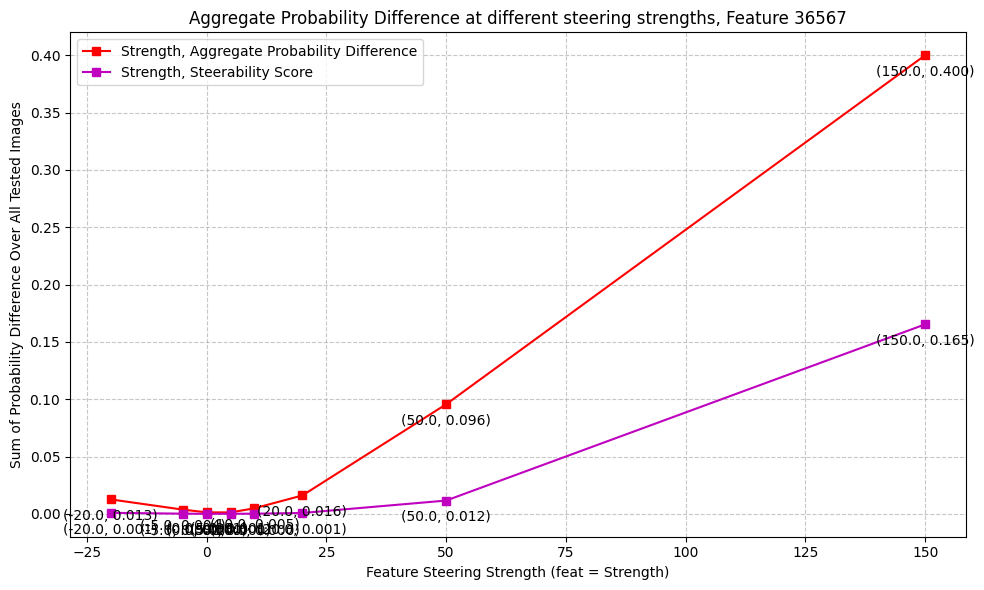

36567
150.0 ['faces' 'group' 'houses' 'vacations' 'city' 'people' 'sides' 'ages' 'cpu'
 'cartoon']
150.0 probs tensor([0.3734, 0.0223, 0.0190, 0.0148, 0.0123, 0.0123, 0.0106, 0.0103, 0.0101,
        0.0086], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.6008e-01, 3.9690e-04, 1.3840e-04, 1.1615e-04, 9.7874e-05, 8.6103e-05,
        6.7616e-05, 5.8741e-05, 4.3330e-05, 3.1630e-05])
['faces' 'group' 'vacations' 'sides' 'people' 'ages' 'city' 'dogs' 'face'
 'houses']


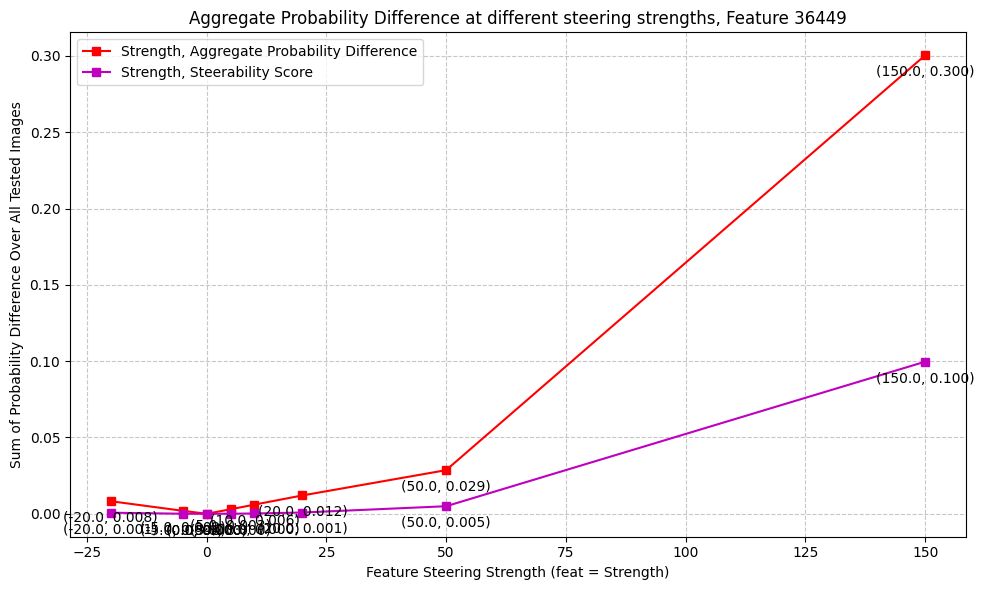

36449
150.0 ['lesbian' 'carrying' 'engines' 'mountains' 'drinking' 'casinos'
 'emissions' 'capacity' 'allowing' 'mechanisms']
150.0 probs tensor([0.2997, 0.0478, 0.0323, 0.0219, 0.0195, 0.0179, 0.0101, 0.0086, 0.0083,
        0.0082], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.0249e-02, 2.0536e-03, 1.0374e-03, 4.6988e-04, 3.0724e-04, 1.1949e-04,
        6.6454e-05, 5.6424e-05, 5.6001e-05, 4.9234e-05])
['lesbian' 'carrying' 'engines' 'mountains' 'casinos' 'emissions'
 'allowing' 'modem' 'drinking' 'acceptance']


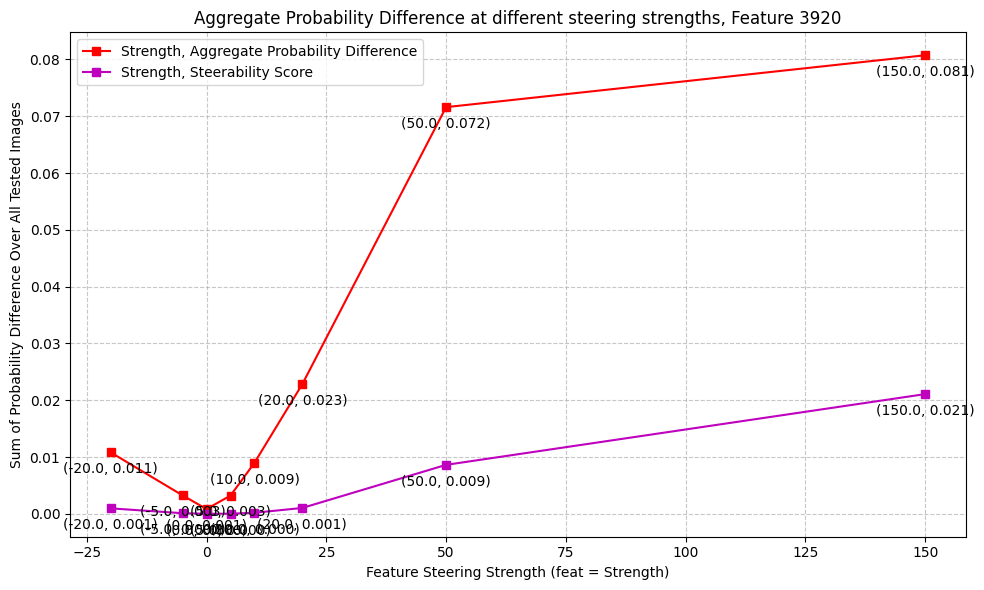

3920
150.0 ['packages' 'bags' 'units' 'ups' 'tabs' 'utilities' 'attorneys' 'utility'
 'cities' 'shirts']
150.0 probs tensor([0.1006, 0.0894, 0.0450, 0.0266, 0.0254, 0.0193, 0.0145, 0.0139, 0.0132,
        0.0120], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.5188e-03, 6.1173e-03, 2.0198e-03, 5.9465e-04, 5.1911e-04, 2.3869e-04,
        2.1319e-04, 2.1078e-04, 1.1980e-04, 8.8026e-05])
['bags' 'packages' 'units' 'ups' 'tabs' 'attorneys' 'utilities' 'utility'
 'tags' 'attachment']


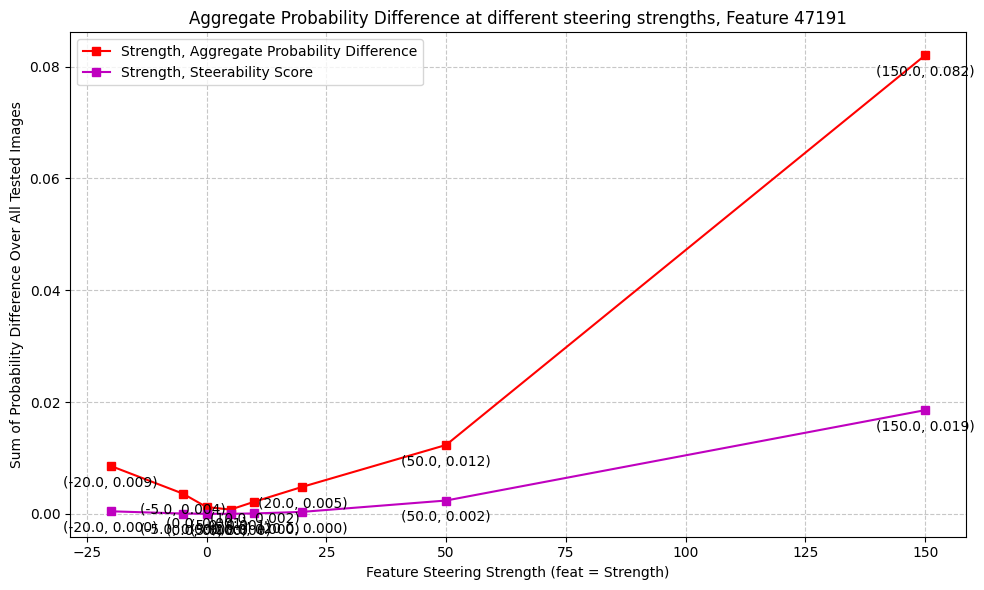

47191
150.0 ['upskirt' 'batteries' 'sublime' 'pregnant' 'battery' 'beer' 'python'
 'mature' 'charge' 'mountain']
150.0 probs tensor([0.0852, 0.0449, 0.0352, 0.0270, 0.0214, 0.0174, 0.0172, 0.0149, 0.0140,
        0.0131], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0067, 0.0025, 0.0016, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002,
        0.0001])
['upskirt' 'batteries' 'sublime' 'pregnant' 'battery' 'python' 'beer'
 'mature' 'mountain' 'edge']


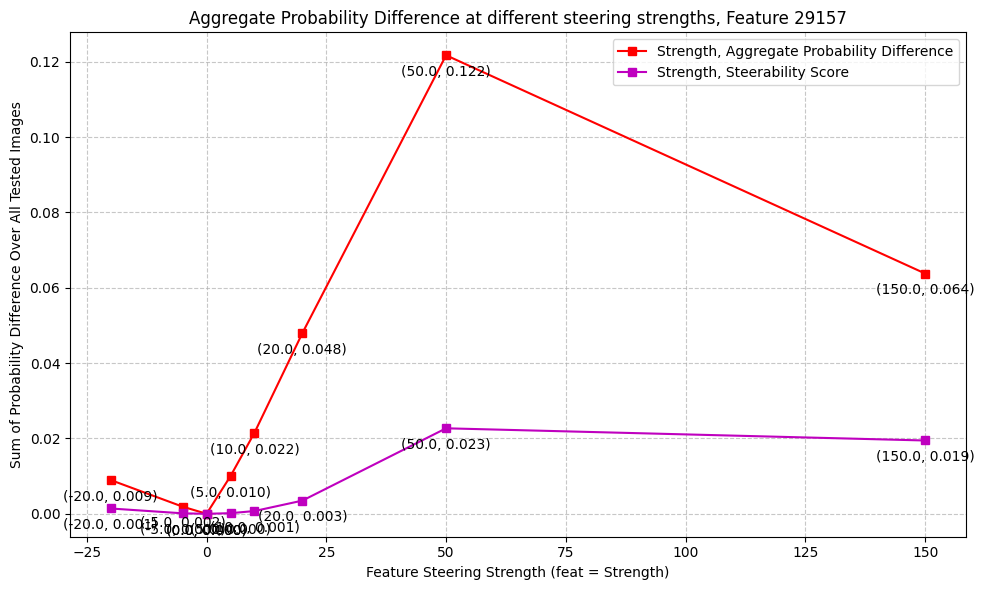

29157
150.0 ['bills' 'capacity' 'capable' 'difficult' 'disclaimer' 'critical'
 'douglas' 'capability' 'officials' 'spiritual']
150.0 probs tensor([0.1093, 0.0722, 0.0613, 0.0279, 0.0266, 0.0209, 0.0187, 0.0184, 0.0168,
        0.0140], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0041, 0.0038, 0.0038, 0.0009, 0.0007, 0.0004, 0.0004, 0.0004, 0.0003,
        0.0002])
['bills' 'capacity' 'capable' 'disclaimer' 'difficult' 'critical'
 'capability' 'officials' 'douglas' 'typically']


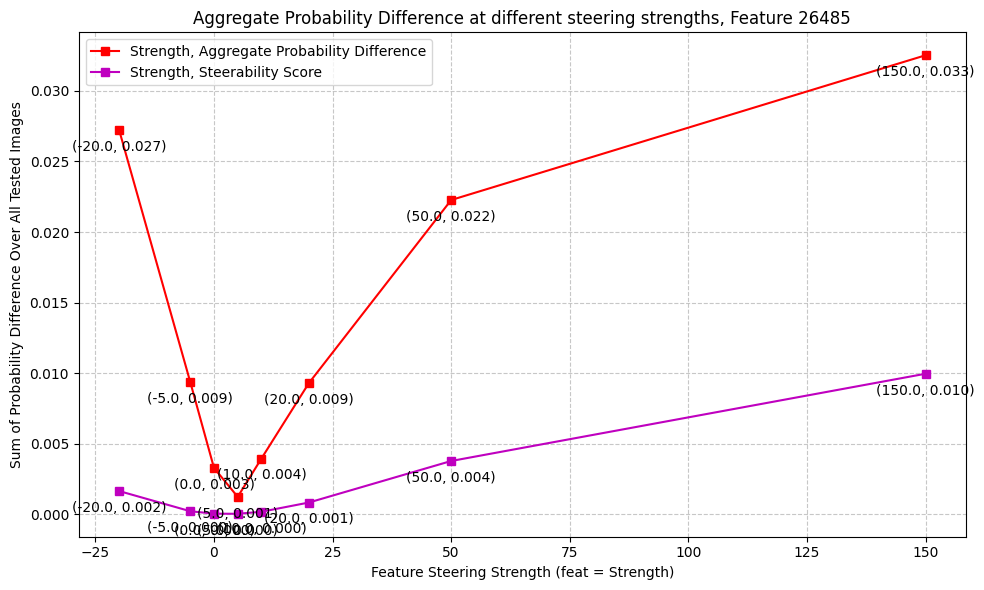

26485
150.0 ['cells' 'units' 'vertical' 'cache' 'estimates' 'apartments' 'challenges'
 'optimization' 'penis' 'unlimited']
150.0 probs tensor([0.0371, 0.0315, 0.0251, 0.0251, 0.0221, 0.0177, 0.0167, 0.0150, 0.0144,
        0.0140], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0011, 0.0010, 0.0007, 0.0006, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['cells' 'units' 'cache' 'vertical' 'estimates' 'challenges'
 'optimization' 'unlimited' 'penis' 'mechanical']


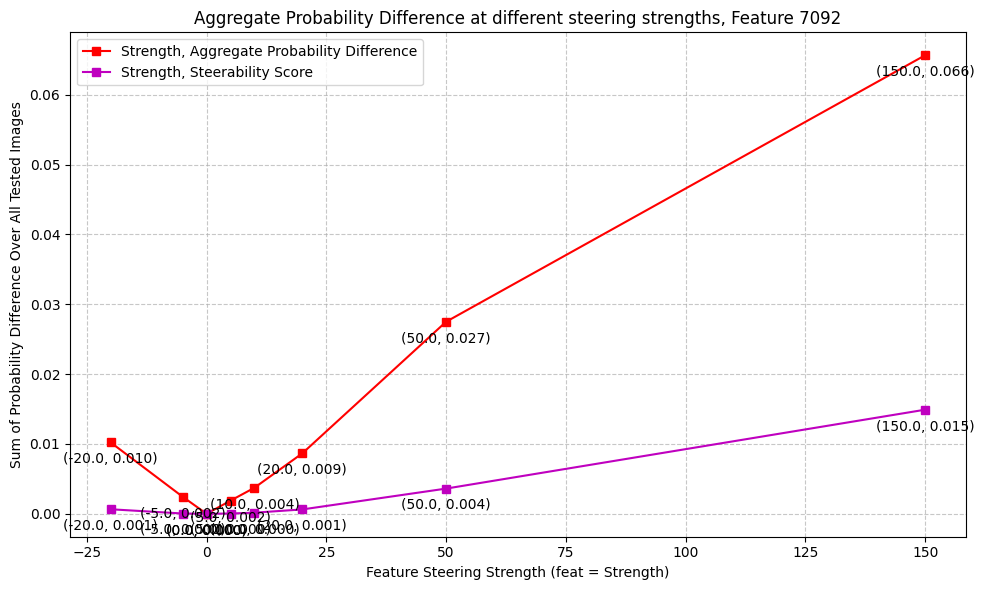

7092
150.0 ['capable' 'bags' 'milfs' 'multiple' 'clips' 'multi' 'modes' 'cables'
 'kings' 'capture']
150.0 probs tensor([0.0650, 0.0491, 0.0343, 0.0280, 0.0198, 0.0189, 0.0168, 0.0154, 0.0131,
        0.0108], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.3100e-03, 1.7337e-03, 1.1204e-03, 7.2928e-04, 3.9002e-04, 2.8268e-04,
        2.5625e-04, 2.3292e-04, 1.2736e-04, 9.2423e-05])
['capable' 'bags' 'milfs' 'multiple' 'clips' 'modes' 'multi' 'cables'
 'capture' 'kings']


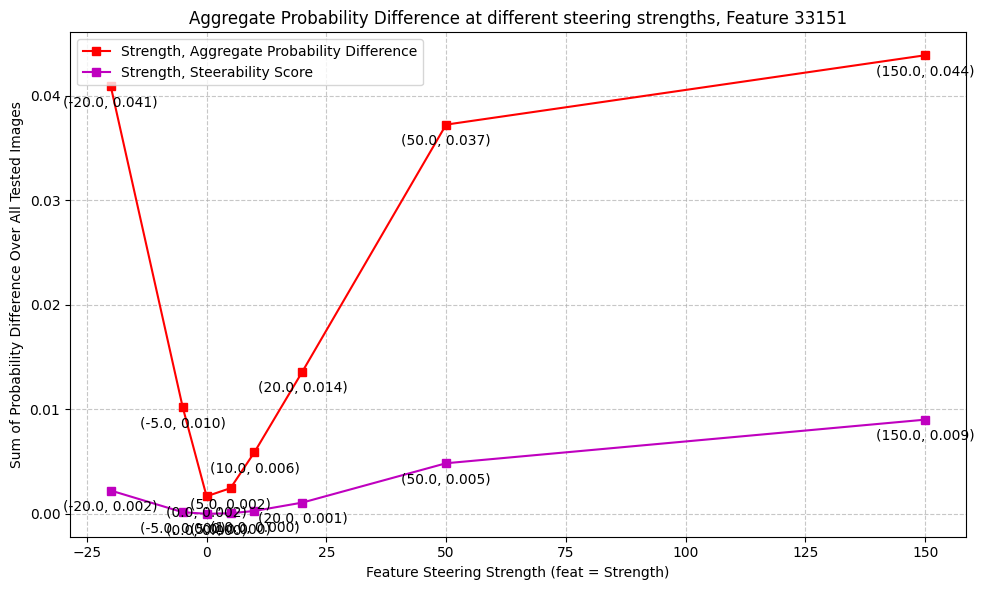

33151
150.0 ['apartments' 'tourist' 'ads' 'spiritual' 'photography' 'packages'
 'benefits' 'cam' 'principles' 'yoga']
150.0 probs tensor([0.0527, 0.0407, 0.0343, 0.0191, 0.0158, 0.0146, 0.0141, 0.0139, 0.0131,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.9267e-03, 9.3050e-04, 5.5072e-04, 2.4658e-04, 1.9294e-04, 1.6365e-04,
        1.6184e-04, 1.2741e-04, 1.1609e-04, 8.5354e-05])
['apartments' 'tourist' 'ads' 'photography' 'spiritual' 'benefits' 'cam'
 'principles' 'javascript' 'yoga']


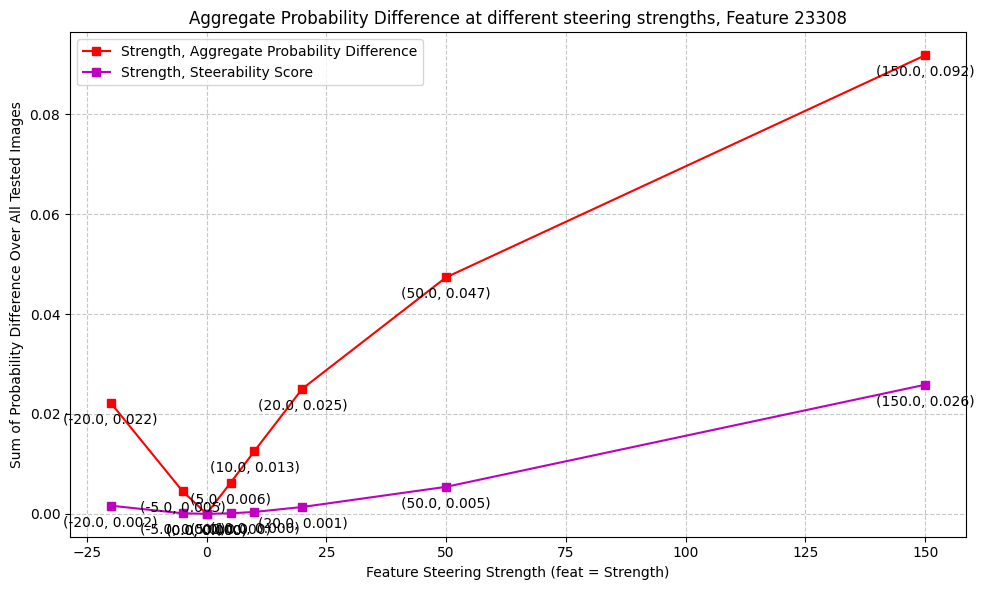

23308
150.0 ['guests' 'mountain' 'mountains' 'bills' 'hills' 'falls' 'journey'
 'drinking' 'beer' 'coast']
150.0 probs tensor([0.0992, 0.0882, 0.0556, 0.0343, 0.0289, 0.0275, 0.0265, 0.0150, 0.0137,
        0.0125], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0084, 0.0077, 0.0033, 0.0008, 0.0007, 0.0005, 0.0001, 0.0001, 0.0001,
        0.0001])
['mountain' 'guests' 'mountains' 'hills' 'falls' 'journey' 'coast'
 'horses' 'mouth' 'beer']


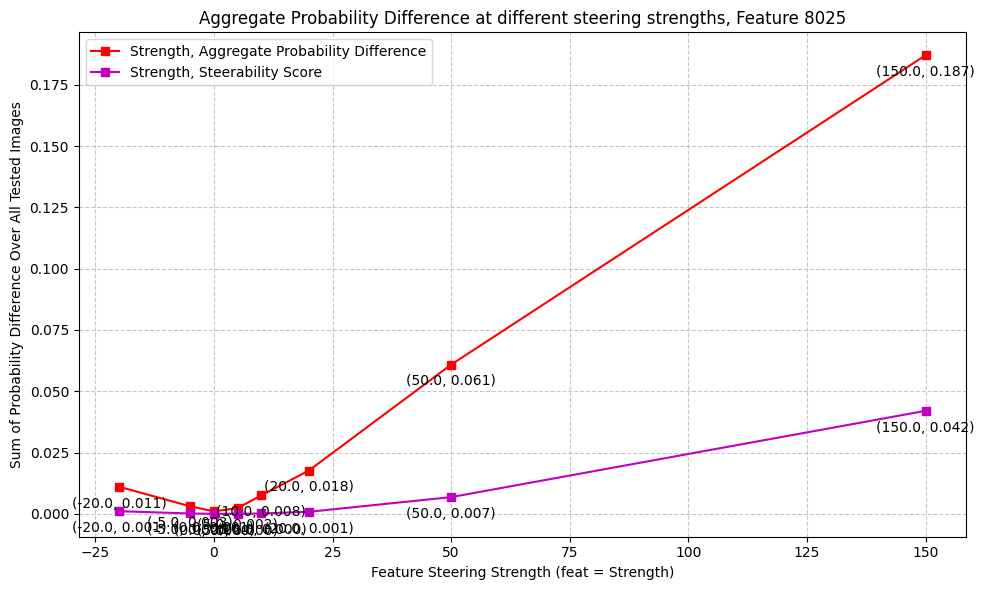

8025
150.0 ['output' 'charge' 'bills' 'utility' 'taken' 'civil' 'ads' 'saw' 'cm'
 'charges']
150.0 probs tensor([0.2027, 0.0311, 0.0297, 0.0268, 0.0267, 0.0198, 0.0180, 0.0141, 0.0126,
        0.0126], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.5001e-02, 8.3988e-04, 7.1328e-04, 4.6995e-04, 3.6075e-04, 2.3307e-04,
        1.5231e-04, 1.4370e-04, 1.3361e-04, 9.9072e-05])
['output' 'utility' 'taken' 'charge' 'civil' 'saw' 'vhs' 'charges' 'cm'
 'matrix']


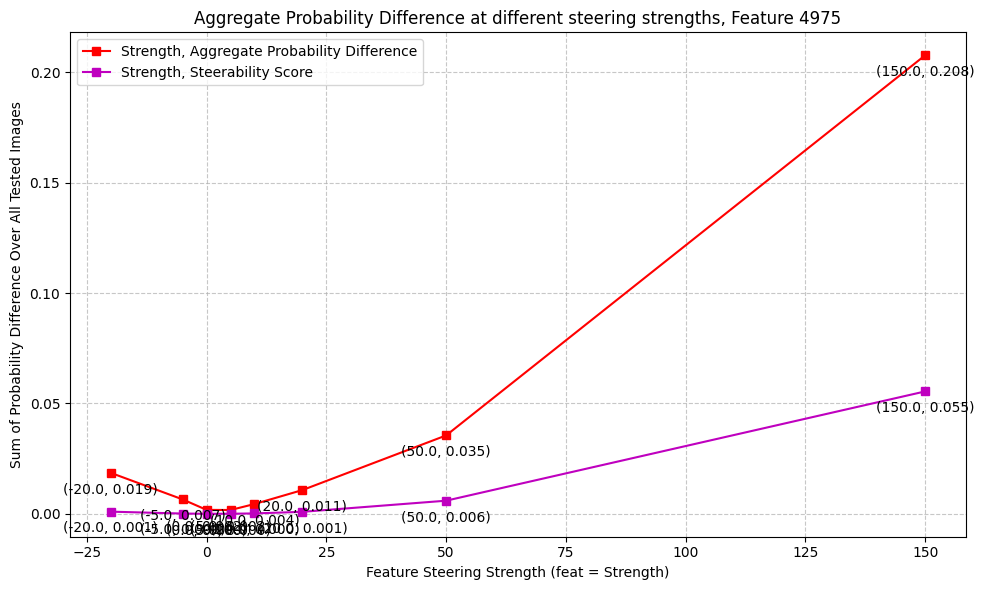

4975
150.0 ['prints' 'print' 'tourist' 'cells' 'modules' 'cards' 'poker' 'maps'
 'falls' 'cities']
150.0 probs tensor([0.2149, 0.0606, 0.0495, 0.0368, 0.0275, 0.0197, 0.0167, 0.0137, 0.0097,
        0.0090], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.3138e-02, 2.6494e-03, 1.5884e-03, 1.1193e-03, 7.6341e-04, 3.2599e-04,
        2.7428e-04, 7.4442e-05, 7.2095e-05, 5.5407e-05])
['prints' 'print' 'tourist' 'cells' 'modules' 'cards' 'poker' 'maps'
 'falls' 'towns']


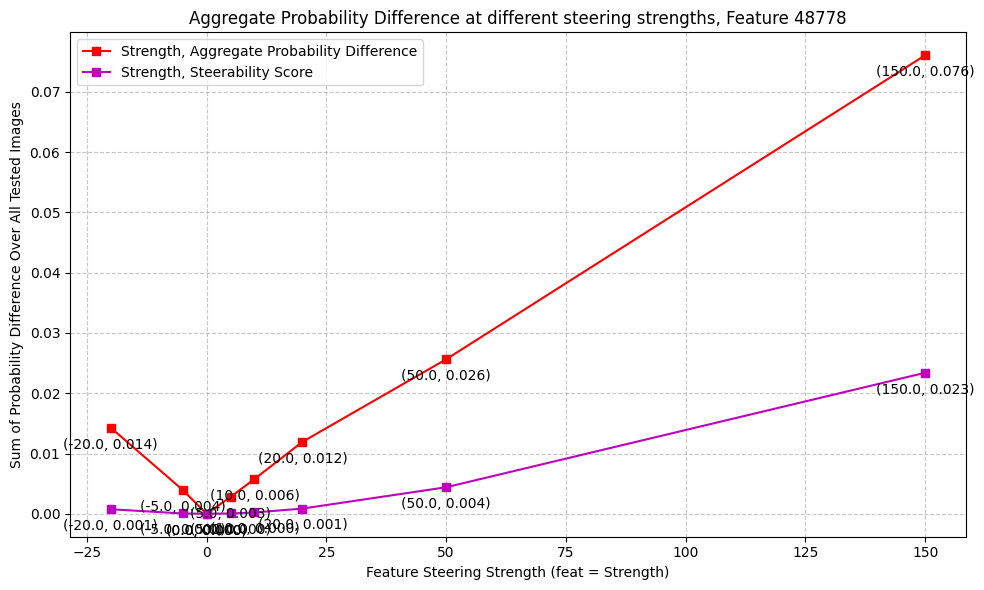

48778
150.0 ['unix' 'kim' 'ministry' 'linux' 'amd' 'xxx' 'sublime' 'joint' 'cpu'
 'upskirt']
150.0 probs tensor([0.0747, 0.0691, 0.0538, 0.0397, 0.0339, 0.0304, 0.0223, 0.0211, 0.0173,
        0.0135], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0058, 0.0040, 0.0028, 0.0015, 0.0014, 0.0012, 0.0006, 0.0003, 0.0002,
        0.0002])
['unix' 'kim' 'ministry' 'xxx' 'linux' 'amd' 'sublime' 'joint' 'upskirt'
 'jobs']


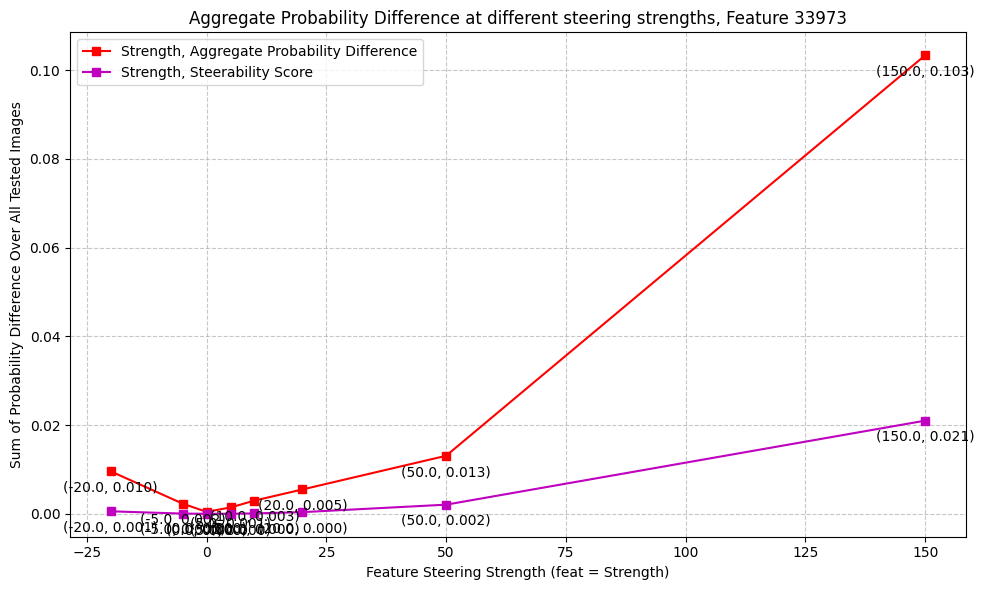

33973
150.0 ['cleaning' 'saw' 'taken' 'pakistan' 'louisiana' 'lunch' 'vietnam' 'tea'
 'running' 'thailand']
150.0 probs tensor([0.1027, 0.0438, 0.0254, 0.0227, 0.0188, 0.0162, 0.0136, 0.0126, 0.0112,
        0.0106], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0676e-02, 2.3316e-03, 6.5232e-04, 4.4851e-04, 2.8987e-04, 2.0634e-04,
        1.7247e-04, 1.6978e-04, 1.2507e-04, 9.0384e-05])
['cleaning' 'saw' 'taken' 'pakistan' 'louisiana' 'lunch' 'vietnam' 'tea'
 'thailand' 'tobacco']


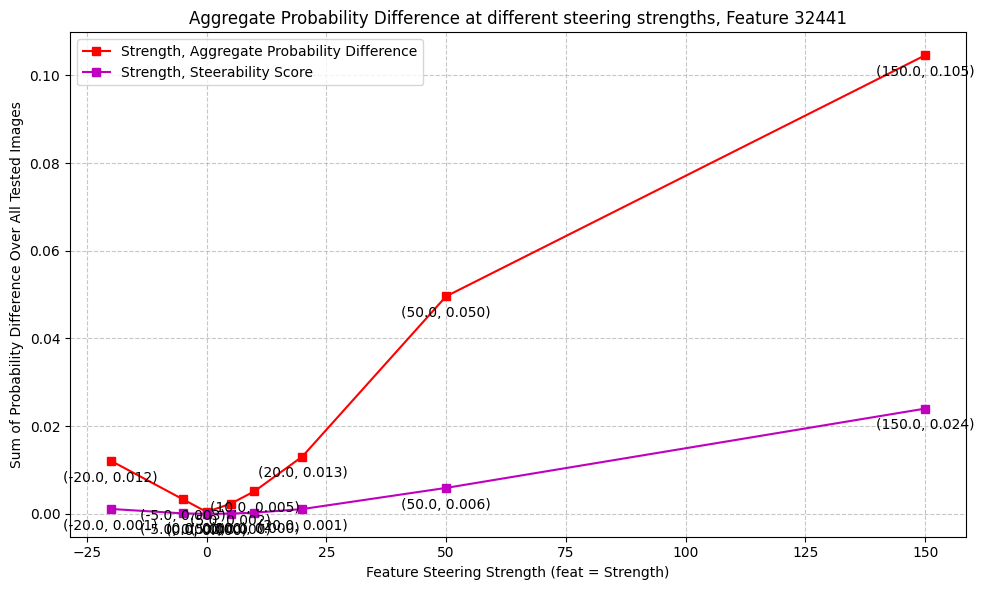

32441
150.0 ['shirts' 'sublime' 'churches' 'checkout' 'journey' 'douglas' 'kits'
 'family' 'cpu' 'packages']
150.0 probs tensor([0.1091, 0.0545, 0.0516, 0.0313, 0.0261, 0.0210, 0.0182, 0.0167, 0.0130,
        0.0126], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0943e-02, 3.7703e-03, 2.7203e-03, 9.3535e-04, 4.1130e-04, 3.9880e-04,
        1.3482e-04, 9.9148e-05, 9.1686e-05, 6.2635e-05])
['shirts' 'sublime' 'churches' 'checkout' 'journey' 'douglas' 'sites'
 'daughter' 'cumshots' 'drives']


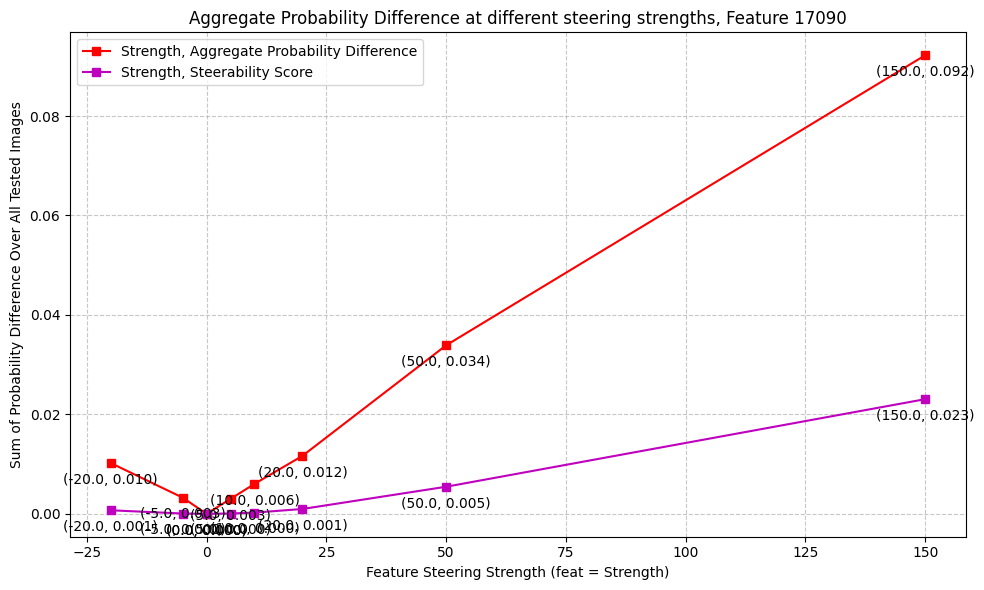

17090
150.0 ['malaysia' 'massage' 'multi' 'fitness' 'yoga' 'mountains' 'muscle'
 'linux' 'pull' 'mountain']
150.0 probs tensor([0.0912, 0.0627, 0.0566, 0.0270, 0.0232, 0.0220, 0.0178, 0.0177, 0.0166,
        0.0137], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0085, 0.0037, 0.0028, 0.0005, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002,
        0.0002])
['malaysia' 'massage' 'multi' 'mountains' 'fitness' 'yoga' 'muscle' 'pull'
 'linux' 'mountain']


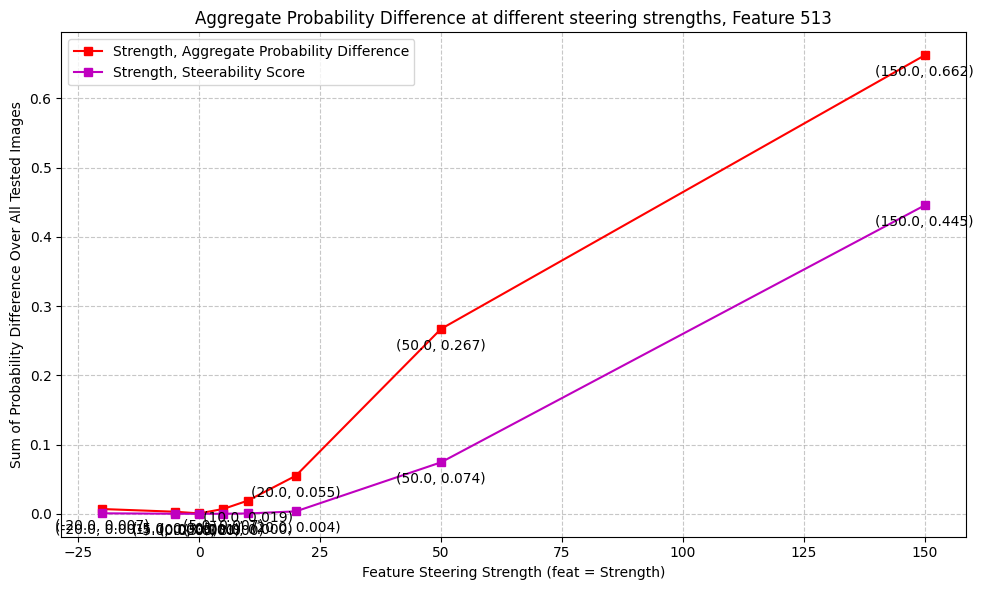

513
150.0 ['cities' 'city' 'cells' 'units' 'girls' 'lakes' 'walls' 'maps' 'couples'
 'concepts']
150.0 probs tensor([0.6661, 0.0388, 0.0281, 0.0209, 0.0062, 0.0061, 0.0042, 0.0041, 0.0037,
        0.0034], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.3843e-01, 1.1426e-03, 5.3390e-04, 3.6072e-04, 3.0948e-05, 1.7181e-05,
        1.0174e-05, 9.1019e-06, 4.9929e-06, 4.8630e-06])
['cities' 'city' 'cells' 'units' 'lakes' 'girls' 'creek' 'concepts'
 'couples' 'posters']


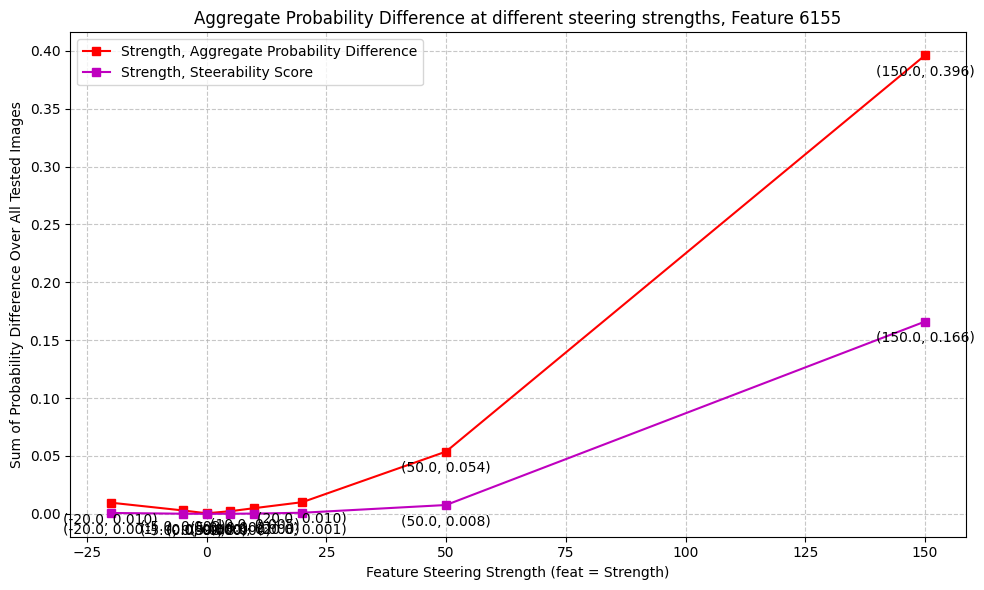

6155
150.0 ['scripts' 'drink' 'jobs' 'ads' 'lesbian' 'tabs' 'script' 'johnny'
 'ministry' 'java']
150.0 probs tensor([0.4056, 0.0473, 0.0325, 0.0187, 0.0180, 0.0155, 0.0152, 0.0147, 0.0113,
        0.0106], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.5691e-01, 1.6137e-03, 1.2722e-03, 3.0281e-04, 1.8756e-04, 1.8120e-04,
        1.8080e-04, 1.2954e-04, 9.8834e-05, 9.4380e-05])
['scripts' 'drink' 'jobs' 'lesbian' 'johnny' 'script' 'tabs' 'ministry'
 'usb' 'java']


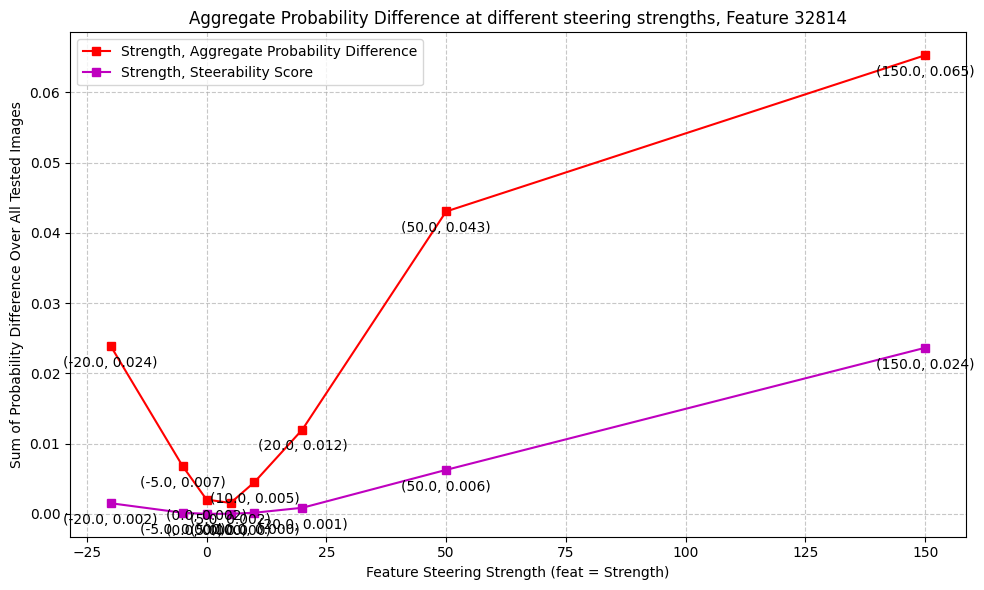

32814
150.0 ['pub' 'tourist' 'obviously' 'obvious' 'beer' 'pipeline' 'lesbian'
 'multiple' 'capacity' 'vacuum']
150.0 probs tensor([0.0849, 0.0693, 0.0602, 0.0597, 0.0495, 0.0241, 0.0170, 0.0135, 0.0131,
        0.0120], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.2605e-03, 3.8052e-03, 3.5367e-03, 3.3552e-03, 2.2301e-03, 6.7465e-04,
        2.6693e-04, 2.0329e-04, 1.5729e-04, 9.9051e-05])
['pub' 'obviously' 'obvious' 'tourist' 'beer' 'pipeline' 'lesbian'
 'vacuum' 'multiple' 'mature']


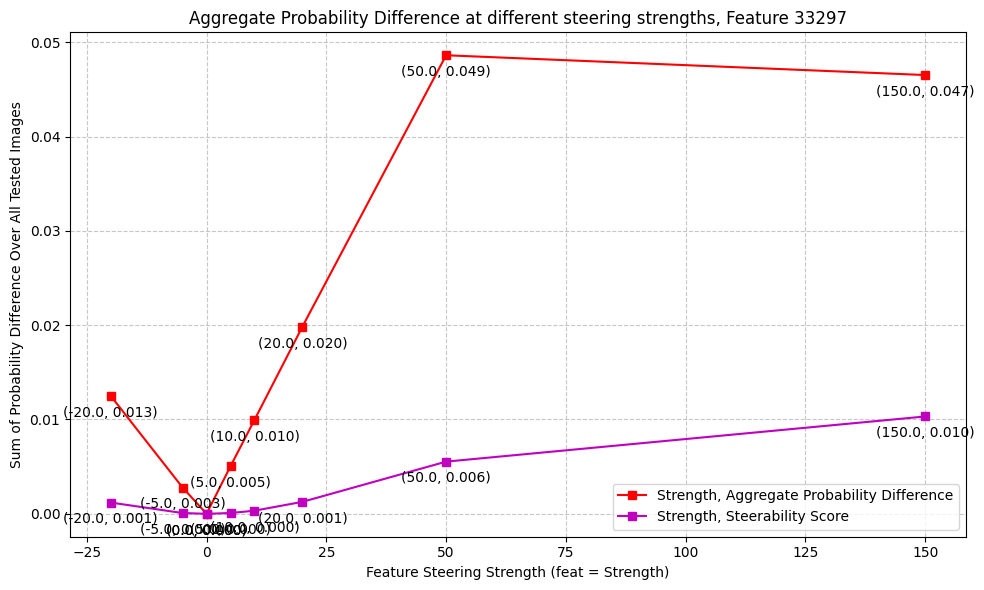

33297
150.0 ['giant' 'capacity' 'principle' 'principles' 'kings' 'bills' 'damages'
 'maintained' 'comes' 'gain']
150.0 probs tensor([0.0532, 0.0383, 0.0325, 0.0217, 0.0180, 0.0178, 0.0173, 0.0139, 0.0107,
        0.0101], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.1647e-03, 9.5836e-04, 5.9460e-04, 3.7801e-04, 3.7419e-04, 2.1313e-04,
        2.1096e-04, 9.4617e-05, 9.2069e-05, 8.2689e-05])
['giant' 'principle' 'capacity' 'damages' 'principles' 'maintained'
 'kings' 'comes' 'savings' 'familiar']


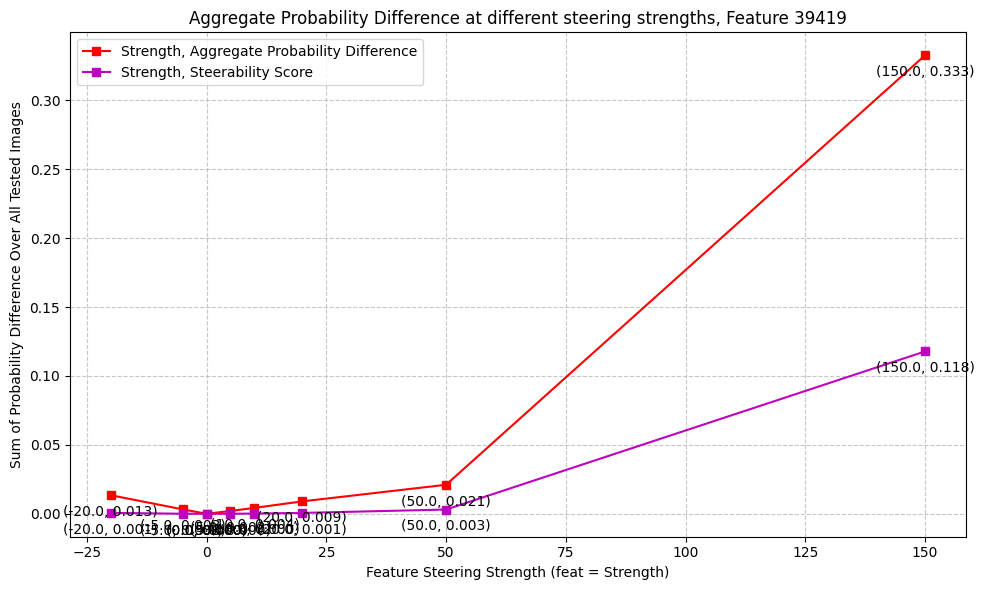

39419
150.0 ['yellow' 'battery' 'walls' 'family' 'orange' 'checks' 'wall' 'batteries'
 'sublime' 'maps']
150.0 probs tensor([0.3103, 0.0247, 0.0198, 0.0182, 0.0171, 0.0171, 0.0166, 0.0143, 0.0113,
        0.0106], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1070e-01, 6.4485e-04, 3.1909e-04, 2.6749e-04, 2.5586e-04, 2.3559e-04,
        2.1714e-04, 1.3830e-04, 4.8291e-05, 4.1639e-05])
['yellow' 'battery' 'orange' 'walls' 'checks' 'wall' 'batteries' 'sublime'
 'check' 'money']


In [27]:
# Steerability metric
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    agg_diff_arr = []
    steerability_arr = []
    i = 0
    for key in steering_strength_info:
        steerability_arr.append(steering_strength_info[key][4][feat_num_steerability].sum().cpu().item())
        agg_diff_arr.append(steering_strength_info[key][3][feat_num_steerability].cpu().item())

    import matplotlib.pyplot as plt
    import numpy as np

    # Sample data
    x = [tup[0] for tup in sorted(feat_num_concept_arr)]
    y1 = agg_diff_arr
    y2 = steerability_arr

    # Create the plot
    plt.figure(figsize=(10, 6))

    # Plot each line with different colors and markers
    plt.plot(np.array(x), y1, 'rs-', label='Strength, Aggregate Probability Difference')  # Red line with squares
    plt.plot(np.array(x), y2, 'ms-', label='Strength, Steerability Score')  # Red line with squares

    # Label each point
    for i in range(len(x)):
        # Labels for series
        plt.annotate(f'({x[i]:.1f}, {y1[i]:.3f})', 
                    (x[i], y1[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')
        plt.annotate(f'({x[i]:.1f}, {y2[i]:.3f})', 
                    (x[i], y2[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')

    # Customize the plot
    plt.xlabel('Feature Steering Strength (feat = Strength)')
    plt.ylabel('Sum of Probability Difference Over All Tested Images')
    plt.title(f'Aggregate Probability Difference at different steering strengths, Feature {feat_num_steerability}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    # Adjust layout to prevent label overlap
    plt.tight_layout()


    # plt.savefig("test.svg")

    # Show the plot
    plt.show()
    # image, tuple position, idx of top-k
    print(feat_num)
    print(dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0])
    print(dict_key, "probs", steering_strength_image_results[str(dict_key)][feat_num][image_idx][1])
    print(steering_strength_info[150.0][4][feat_num_steerability].shape)
    vals, idxs = torch.topk(steering_strength_info[150.0][5][feat_num_steerability].cpu(), k=10)
    print("probabilities * abs(probabilities)", vals)
    print(np.array(selected_vocab)[idxs.cpu()])
    

In [43]:
feat_top_concept_dict = {}

key = 150.0
# Steerability metric
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    if steering_strength_info[key][4][feat_num_steerability].sum().cpu().item() > .10:
        feat_top_concept_dict[feat_num] = steering_strength_image_results[str(key)][feat_num][image_idx][0][0]


num steerable features: 39
num concepts: 27


Counter({'bills': 6,
         'sublime': 4,
         'houses': 3,
         'shirts': 2,
         'faces': 2,
         'output': 1,
         'community': 1,
         'taken': 1,
         'journey': 1,
         'papers': 1,
         'kits': 1,
         'pupils': 1,
         'cocks': 1,
         'tourist': 1,
         'debian': 1,
         'spanking': 1,
         'massage': 1,
         'parking': 1,
         'pub': 1,
         'cumshots': 1,
         'cpu': 1,
         'mysql': 1,
         'bags': 1,
         'apartments': 1,
         'paypal': 1,
         'lesbian': 1,
         'ministry': 1})

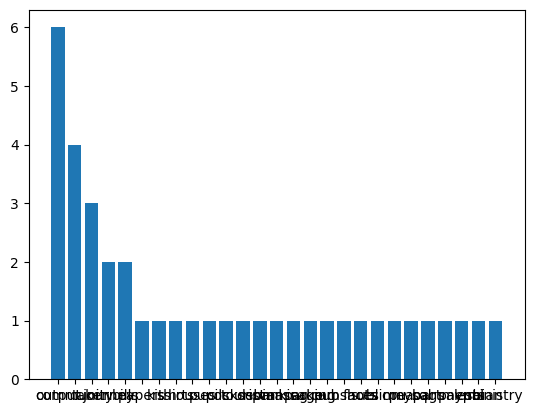

In [45]:
from collections import Counter
import matplotlib.pyplot as plt

featctr = Counter(feat_top_concept_dict.values())
print("num steerable features:", sum(featctr.values()))
print("num concepts:", len(featctr))
plt.bar(featctr.keys(), sorted(featctr.values(), reverse=True) )

Counter(feat_top_concept_dict.values())

feat: 15232
asymptotic_steering_specificity: 0.01583242043852806
asymptotic_steering_power: 0.06371258944272995
asymptotic_steering_power percent: 6.37%
specificity/power: 0.24849751951707325
feat: 6127
asymptotic_steering_specificity: 0.08210375905036926
asymptotic_steering_power: 0.25340816378593445
asymptotic_steering_power percent: 25.34%
specificity/power: 0.32399808208123115
feat: 4276
asymptotic_steering_specificity: 0.012048120610415936
asymptotic_steering_power: 0.04568469151854515
asymptotic_steering_power percent: 4.57%
specificity/power: 0.2637233657476957
feat: 28406
asymptotic_steering_specificity: 0.00878147128969431
asymptotic_steering_power: 0.037500228732824326
asymptotic_steering_power percent: 3.75%
specificity/power: 0.2341711393884859
feat: 5062
asymptotic_steering_specificity: 0.02383996732532978
asymptotic_steering_power: 0.07499302923679352
asymptotic_steering_power percent: 7.50%
specificity/power: 0.31789577735357405
feat: 42189
asymptotic_steering_specificit

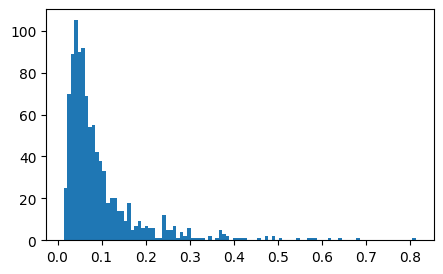

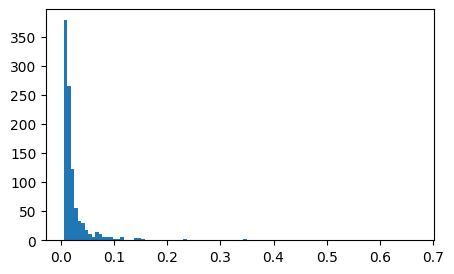

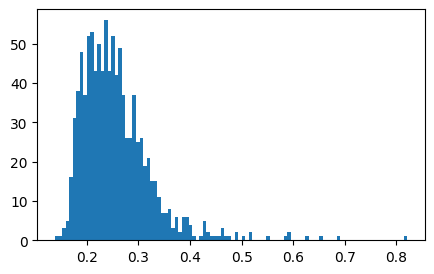

In [46]:
# SAE steering power and specificity metrics:

sae_asps = []
sae_asy_str_specs = []
sae_asrs = []
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    
    asymptote_key = max([float(key) for key in steering_strength_info.keys()])
    asymptotic_steering_specificity = steering_strength_info[asymptote_key][4][feat_num_steerability].sum().cpu().item()
    asymptotic_steering_power = steering_strength_info[asymptote_key][3][feat_num_steerability].cpu().item()
    
    print(f"feat: {feat_num_steerability}")
    print(f"asymptotic_steering_specificity: {asymptotic_steering_specificity}")
    print(f"asymptotic_steering_power: {asymptotic_steering_power}")
    print(f"asymptotic_steering_power percent: {(asymptotic_steering_power * 100):.2f}%")
    print(f"specificity/power: {asymptotic_steering_specificity/asymptotic_steering_power}")
    
    sae_asps.append(asymptotic_steering_power)
    sae_asy_str_specs.append(asymptotic_steering_specificity)
    sae_asrs.append(asymptotic_steering_specificity/asymptotic_steering_power)


print(f"\nSAE: {selected_sae_weights}")
print(f"\nSAE avg power: {np.array(sae_asps).mean()}")
print(f"SAE avg specificity: {np.array(sae_asy_str_specs).mean()}")
print(f"SAE avg s/p ratio: {np.array(sae_asrs).mean()}")

plt.figure(figsize=(5, 3))
plt.hist(sae_asps, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asy_str_specs, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asrs, bins=100)
plt.show()

### Prev Code

In [ ]:
len(feature_steered_embeds[random_feat_idxs[0]])

In [ ]:
default_embeds.shape
len(default_embeds_list)
default_embeds = torch.cat(default_embeds_list)
default_embeds.shape

In [ ]:

len(altered_embeds_list), altered_embeds_list[0].shape, default_embeds.shape

In [ ]:
og_model.cuda()

In [ ]:
with open("/workspace/clip_dissect_raw.txt", "r") as f:
    larger_vocab = [line[:-1] for line in f.readlines()][:5000]

# with open("/workspace/better_img_desc.txt", "r") as f:
#     larger_vocab = [line[:-1] for line in f.readlines()][:5000]

In [ ]:
# use clip vocab here and compare embeds
import torch
from PIL import Image

tokenizer = open_clip.get_tokenizer('ViT-B-32')
text = tokenizer(larger_vocab)
text_features = og_model.encode_text(text.cuda())
text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True)


print(f"text_features_normed.shape: {text_features_normed.shape}")
text_probs_altered_list = []
with torch.no_grad(), torch.cuda.amp.autocast():
    for key in feature_steered_embeds:
        print(key)
        # embeds already have L2 norm of 1
        text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
        text_probs_altered_list.append(text_probs_altered)
    text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)

print("Label probs altered:", text_probs_altered.shape)  # prints: [[1., 0., 0.]]
print("Label probs default:", text_probs_default.shape)  # prints: [[1., 0., 0.]]

### Summed Logit Difference

In [ ]:
# subtract from default, label, and print trends
text_probs_altered.shape

# selected_vocab = all_imagenet_class_names
selected_vocab = larger_vocab

top_concept_per_feat = {}
top_val_per_feat = {}
top_diff_per_feat = {}
top_ratio_per_feat = {}
# run this for sampled features over all of imagenet eval
for j, text_probs_altered in enumerate(text_probs_altered_list):
    print(f"{'============================================'*2}\n\nFor Feature {random_feat_idxs[j]}")
    print("actual image content:")
    default_vals_softmax, default_idxs_softmax = torch.topk(text_probs_default,k=10)
    print(default_vals_softmax, "\n", np.array(selected_vocab)[default_idxs_softmax.cpu()])
    
    
    logit_diff = text_probs_altered - text_probs_default
    logit_diff_aggregate = logit_diff.sum(dim=0)
    
    logit_ratio = text_probs_altered/text_probs_default
    logit_ratio_aggregate = logit_ratio.mean(dim=0)
    
    print(f"text_probs_altered.softmax(): {text_probs_altered.softmax(1).shape}")
    text_probs_altered_softmax = text_probs_altered.softmax(1)
    vals_softmax, idxs_softmax = torch.topk(text_probs_altered_softmax,k=10)
    
#     print(f"text_probs_altered.softmax(): {text_probs_altered.sum(0).softmax(0).shape}")
#     text_probs_altered_softmax_agg = text_probs_altered.sum(0).softmax(0)
#     vals_softmax_agg, idxs_softmax_agg = torch.topk(text_probs_altered_softmax_agg,k=10)
    
    print(f"\nSoftmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax}")
    print(np.array(selected_vocab)[idxs_softmax.cpu()])
    for i in range(vals_softmax.shape[0]):
        print(vals_softmax[i], "\n", np.array(selected_vocab)[idxs_softmax.cpu()][i])
        break
        
#     print(f"\nAgg Softmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax_agg}")
#     print(np.array(selected_vocab)[idxs_softmax_agg.cpu()])
    
    vals_agg, idxs_agg = torch.topk(logit_diff_aggregate,k=10)
    vals_least_agg, idxs_least_agg = torch.topk(logit_diff_aggregate,k=10,largest=False)
    
    ratios_agg, ratios_idxs_agg = torch.topk(logit_ratio_aggregate,k=10)
    ratios_least_agg, ratios_idxs_least_agg = torch.topk(logit_ratio_aggregate,k=10,largest=False)
    
    vals, idxs = torch.topk(logit_diff,k=5)
    vals_least, idxs_least = torch.topk(logit_diff,k=5,largest=False)
    
    ratios, ratios_idxs = torch.topk(logit_ratio,k=5)
    ratios_least, ratios_idxs_least = torch.topk(logit_ratio,k=5,largest=False)
    
    top_concept_per_feat[random_feat_idxs[j]] = np.array(selected_vocab)[idxs_softmax.cpu()][0][0]
    top_val_per_feat[random_feat_idxs[j]] = vals_softmax[0][0]
    top_diff_per_feat[random_feat_idxs[j]] = vals_agg[0]
    top_ratio_per_feat[random_feat_idxs[j]] = ratios_agg[0]
    
    
    print(f"\nMost Changed, by Absolute Diff Over {logit_diff.shape[0]} Images:\n{vals_agg}")
    print(np.array(selected_vocab)[idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[idxs_least_agg.cpu()])
    
    print(f"\nMost Changed, by Ratio Over {logit_diff.shape[0]} Images:")
    print(ratios_agg)
    print(np.array(selected_vocab)[ratios_idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[ratios_idxs_least_agg.cpu()])

In [ ]:
top_concept_per_feat,top_val_per_feat,top_ratio_per_feat

In [ ]:
steering_strength_info = {}
steering_strength_info[steering_strength] = (top_concept_per_feat,top_val_per_feat,top_ratio_per_feat,top_diff_per_feat)


In [ ]:
steering_strength_info[steering_strength][0].keys()

In [ ]:
steering_strength_info

In [ ]:
i = 0
for feat_num in steering_strength_info[steering_strength][0].keys():
    print(f"=====================\nfeat_num: {feat_num}")
    feat_num_concept_arr = []
    feat_num_prob_arr = []
    feat_num_ratio_arr = []
    for key in steering_strength_info:
        print(key, steering_strength_info[key][0][feat_num])
        feat_num_concept_arr.append((key, steering_strength_info[key][0][feat_num]))
        print(key, steering_strength_info[key][1][feat_num])
        feat_num_prob_arr.append((key, steering_strength_info[key][1][feat_num].item()))
        print(key, steering_strength_info[key][2][feat_num])
        feat_num_ratio_arr.append((key, steering_strength_info[key][2][feat_num].item()))
    i += 1
    if i > 5:
        break

In [ ]:
sorted(feat_num_concept_arr),sorted(feat_num_prob_arr),sorted(feat_num_ratio_arr),

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
# y3 = [tup[1] for tup in sorted(feat_num_ratio_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
# plt.plot(x, y1, 'bo-', label='Series 1')  # Blue line with circles
plt.plot(np.array(x), y2, 'rs-', label='Series 2')  # Red line with squares
# plt.plot(x, y3, 'gd-', label='Series 3')  # Green line with diamonds

# Label each point for all three series
for i in range(len(x)):
#     # Labels for series 1
#     plt.annotate(f'({x[i]}, {y1[i]})', 
#                 (x[i], y1[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')
    
    # Labels for series 2
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
#     # Labels for series 3
#     plt.annotate(f'({x[i]}, {y3[i]})', 
#                 (x[i], y3[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')

# Customize the plot
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_info[0.0][0][feat_num]}. Label at max steered val: {steering_strength_info[max(list(steering_strength_info.keys()))][0][feat_num]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()

# Show the plot
plt.show()

## Enc/Dec Clustering/Exploration

In [ ]:
encoder_weights_for_math = sparse_autoencoder.W_enc
decoder_weights_for_math = sparse_autoencoder.W_dec

In [ ]:
dists_from_feat_0 = encoder_weights_for_math[0] - encoder_weights_for_math

In [ ]:
dists_from_feat_0_normalized = encoder_weights_for_math[0]/encoder_weights_for_math[0].norm(p=2) - encoder_weights_for_math/encoder_weights_for_math.norm(p=2,dim=0)

In [ ]:
dists_from_feat_0.norm(p=2, dim=0).shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dists_from_feat_0.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Encoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dists_from_feat_0.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0 = decoder_weights_for_math[0]/decoder_weights_for_math[0].norm(p=2) - decoder_weights_for_math/decoder_weights_for_math.norm(p=2)
dec_dists_from_feat_0.shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dec_dists_from_feat_0.T.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Decoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dec_dists_from_feat_0.T.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0.T.norm(p=2, dim=0).shape